In [ ]:
# Copyright (C) 2024  Jose Ángel Pérez Garrido
# 
# This program is free software: you can redistribute it and/or modify
# it under the terms of the GNU General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.

# This program is distributed in the hope that it will be useful,
# but WITHOUT ANY WARRANTY; without even the implied warranty of
# MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
# GNU General Public License for more details.

# You should have received a copy of the GNU General Public License
# along with this program.  If not, see <https://www.gnu.org/licenses/>.

# Genetic Algorithm
## Setup the environment

First create a conda environment using the command `conda create --name ec` and activate it in your terminal using `conda activate ec`.

### Install the requirements:

[https://github.com/guofei9987/scikit-opt](https://github.com/guofei9987/scikit-opt)

take care to install all packages you need additionally (such as `numpy`, `scipy`,`setuptools`,`wheel`, etc.)

Pytorch is also required in order to access GPU functionalities.


### Analyze Guofei-package
The Guofei-package offer several optimization algorithms, including the genetic algorithm which offer several implementations for the operators included in `/scikit-opt/sko/operators`: 
- **Recombination/crossover**:
    - **Simple crossover**:
        - `crossover_1point`
    - **k-point crossover**: Cut at k points and interchange the corresponding parts
        - `crossover_2point`: 2 points crossover
        - `crossover_2point_bit`: 3 times faster than `crossover_2point`, but only use for 0/1 type of Chrom
        - `crossover_2point_prob`: 2 points crossover with probability

    - `crossover_pmx`: Executes a partially matched crossover (PMX) on Chrom.
    

The GA class employs **crossover_2point_bit** whereas the GA_TSP class employs **crossover_pmx**. RCGA class employs **crossover_SBX**, a simulated binary crossover integrated into class RCGA.

- **Mutation**: Regarding mutation possibilities, the Guofei-package supports seven different implementations to select the parents being allowed to have off-springs:
    - **Gene mutation**:
        - `mutation`: Mutation of 0/1 type chromosome faster than `self.Chrom = (mask + self.Chrom) % 2`
        - `mutation_TSP_1`: Every gene in every chromosome mutate
    - **Gene flip**:
        - `mutation_swap`: Swaps the positions of two elements
    - **Gene sequence inversion**:
        - `mutation_reverse`: Reverse n1 to n2. Also called `2-Opt`: removes two random edges, reconnecting them so they cross. Karan Bhatia, "Genetic Algorithms and the Traveling Salesman Problem", 1994 https://pdfs.semanticscholar.org/c5dd/3d8e97202f07f2e337a791c3bf81cd0bbb13.pdf

The GA and RCGA classes employs **mutation** whereas the GA_TSP class employs **mutation_reverse**.
        
- **Selection**: Regarding selection options, the Guofei-package supports four different implementations of two different types to select the parents being allowed to have off-springs:
    - **Roulette wheel**: assign to each individual a fraction of the wheel
according to its relative fitness and spin the wheel:
        - `selection_roulette_1`
        - `selection_roulette_2`
    - **Tournament based**: draw a certain number of random individuals,
select the best one as parent:
        - `selection_tournament`: Select the best individual among *tournsize* randomly chosen individuals
        - `selection_tournament_faster`: Select the best individual among *tournsize* randomly chosen. Same with `selection_tournament` but much faster using numpy
    individuals
    
GA, RCGA and GA_TSP classes employ **selection_tournament_faster**.

The remaining criterion can be consulted into the class implementations of GA and GA_TSP available in `/scikit-opt/sko`: 
- **Initialization**: GA, RCGA and GA_TSP classes generate the initial population with random genomes in the function `crtbp()`
- **Stopping criteria**: GA, RCGA and GA_TSP classes apply a stopping **once a certain number of iterations has been executed**. In addition, GA class supports an optional early stopping mechanism to allow to stop the algorithm execution whether **the best result is not improved after a user-defined number of iterations**.



### Import modules:

In [1]:
import torch
import math, random
import csv, os, sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import spatial
from sko.GA import GA, GA_TSP, RCGA

TOURS_PATH = "./tours"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("CUDA available:",torch.cuda.is_available())

CUDA available: True


### Define the objective functions:

- Schaffer-function:

In [2]:
def schaffer_n2(p):
    '''
    This function has plenty of local minimum, with strong shocks
    global minimum at (0,0) with value 0
    https://en.wikipedia.org/wiki/Test_functions_for_optimization
    '''
    x1, x2 = p
    part1 = np.square(x1) - np.square(x2)
    part2 = np.square(x1) + np.square(x2)
    return 0.5 + (np.square(np.sin(part1)) - 0.5) / np.square(1 + 0.001 * part2)

def schaffer_n4(p):
    '''
    This function has 4 global minimum at (0,1.25312), (0,-1.25313)
    (1.25312,0), (-1.25313,0) with value 0.292579
    https://en.wikipedia.org/wiki/Test_functions_for_optimization
    '''
    x1, x2 = p
    part1 = np.abs(np.square(x1) - np.square(x2))
    part2 = np.square(x1) + np.square(x2)
    return 0.5 + (np.square(np.cos(np.sin(part1))) - 0.5) / np.square(1 + 0.001 * part2)

- Rosenbrock-function:

In [3]:
def rosenbrock(p):
    sum = 0
    for i in range(len(p)-1):
        xi = p[i]
        xii = p[i+1]
        part = 100*(xii-xi**2)**2+ (xi-1)**2
        sum+=part
    return sum

###  Minimize the Schaffer-function in a Monte Carlo loop

Schaffer's function is a standard test function in optimization. The N.2 encoding has a unique minimum value of 0 attained at the point [0,0]. The plot below shows the Schaffer function with dimension 2.

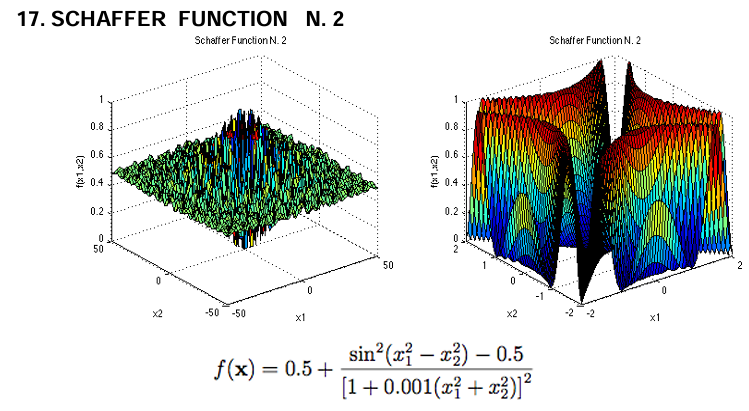

The N.4 encoding has 4 global minimum at [0,1.25312], [0,-1.25313], [1.25312,0], [-1.25313,0] with value 0.292579. The function is usually evaluated on the square xi ∈ [-100, 100], for all i = 1, 2.

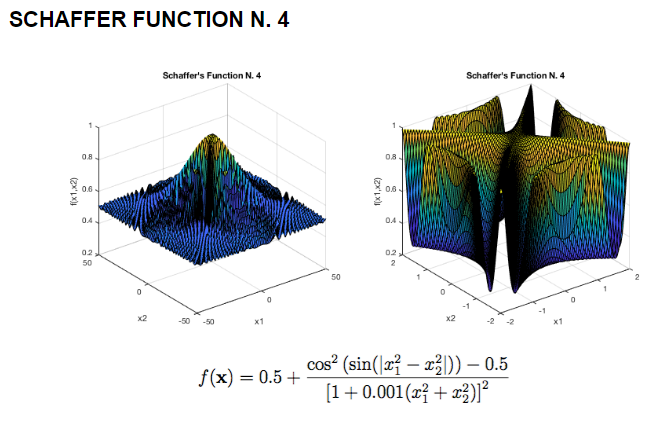

We implement the algorithm embedded into a Monte Carlo loop with a certain number of rounds and compute some statistics (mininum, iteration in which the minimum was found, mean and variance of the objective function). In addition, in a Monte Carlo simulation, random sampling is used to estimate the properties of a system or process by generating a large number of random samples. That is why we also compute the Monte Carlo Standard Error (MCSE) which provides a measure of how much the estimated value may vary due to random sampling variability.

We keep and return the best result (lower mean of the objective function) that we found during the Monte Carlo loop.

In [4]:
# Define the Monte Carlo function
def monte_carlo(rounds, func, n_dim, algorithm, lb, ub, algorithm_params, plot=False):
    # Auxiliary variables
    results = []
    best_total_result = float('inf')
    best_ga = None
    best_iteration = None

    for i in range(rounds): # Monte Carlo loop
        ga = algorithm(func=func, n_dim=n_dim, lb=lb, ub=ub, **algorithm_params)

        if ga.__class__.__name__ is GA:
            ga.to(device=device) # use GPU if available
            
        best_x, best_y = ga.run()
        #print('Round',i,'\nbest_x:', best_x, '\nbest_y:', best_y)
        results.append(best_y)

        # Update best result found during the Monte Carlo loop
        if best_y < best_total_result:
            best_iteration = i
            best_total_result = best_y
            best_ga = ga

    # Calculate minimum, mean, and variance of the objective function
    min_result = np.min(results)
    mean_result = np.mean(results)
    variance_result = np.var(results)

    # Compute Monte Carlo Standard Error (MCSE)
    mcse = np.sqrt(variance_result) / np.sqrt(rounds)

    print("Minimum of objective function:", min_result)
    print("Minimum found in iteration:", best_iteration)
    print("Mean of objective function:", mean_result)
    print("Variance of objective function:", variance_result)
    print("Monte Carlo standard error:", mcse)
    

    # Plot best ga
    if(plot):
        Y_history = pd.DataFrame(best_ga.all_history_Y)
        fig, ax = plt.subplots(2, 1)
        ax[0].plot(Y_history.index, Y_history.values, '.', color='red')
        Y_history.min(axis=1).cummin().plot(kind='line')
        plt.show()

    return best_ga, mean_result

### 1. Run the examples of the Guofei-packages that minimize the Schaffer-function (with both encodings) in a Monte Carlo loop and log the mininum, mean, and variance of the objective function.

####  1.1. Minimize functions using integer encoding class (GA)

We initialize a certain number of Monte Carlo rounds.

In [6]:
rounds=10

#### Schaffer-function N.2

Run the algorithm with the parameters of the examples of the Guofei-packages that minimize the Schaffer-function.

Minimum of objective function: 0.0
Minimum found in iteration: 2
Mean of objective function: 4.523676675138866e-06
Variance of objective function: 6.945092201287726e-11
Monte Carlo standard error: 2.6353542838274564e-06


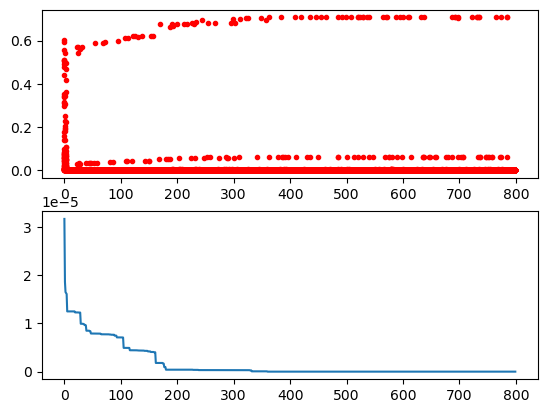

In [6]:
params = {'size_pop': 50, 'max_iter': 800, 'prob_mut': 0.001, 'precision':1e-7}
results = monte_carlo(rounds, schaffer_n2, 2, GA, [-1, -1], [1, 1], params, plot=True)

#### Schaffer-function N.4

Minimum of objective function: 0.4441563824442296
Minimum found in iteration: 0
Mean of objective function: 0.4441563824442296
Variance of objective function: 0.0
Monte Carlo standard error: 0.0


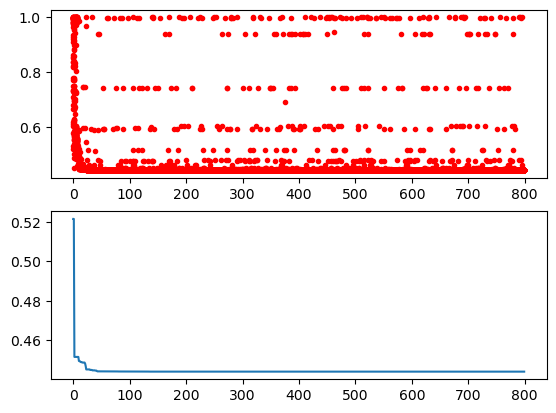

In [7]:
params = {'size_pop': 50, 'max_iter': 800, 'prob_mut': 0.001, 'precision':1e-7}
results = monte_carlo(rounds, schaffer_n4, 2, GA, [-1, -1], [1, 1], params, plot=True)

Using the parameters of the examples of the Guofei-packages that minimize the Schaffer-function N.2 we achieve to find the global minimum in the second Monte Carlo round, but with a quite high mean and variance of objective function highlighting that using this set of parameters normally we need to execute the GA several times to find the minimum, consuming execution time and affecting the system performance. We can also see that the algorithm takes around 330 iterations to converge.

Regarding Schaffer-function N.4, we can see that GA falls in a local minima (0.44) far from the real global minimum (0.292579) in every Monte Carlo round (since the variance is 0) making necessary to find another set of parameters to be able to reach this minimum. We can also see that the algorithm takes around 45 iterations to converge.

####  1.2. Minimize functions using real-coding class (RCGA)

#### Schaffer-function N.2

Run the algorithm with the parameters of the examples of the Guofei-packages that minimize the Schaffer-function.

Minimum of objective function: 0.0
Minimum found in iteration: 0
Mean of objective function: 0.0
Variance of objective function: 0.0
Monte Carlo standard error: 0.0


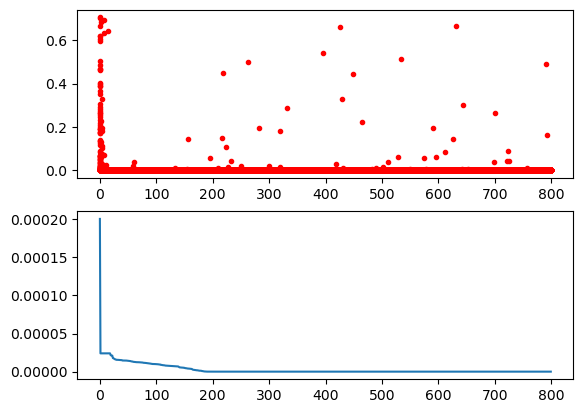

In [13]:
params = {'size_pop': 50, 'max_iter': 800, 'prob_mut': 0.001}
results = monte_carlo(rounds, schaffer_n2, 2, RCGA, [-1, -1], [1, 1], params, plot=True)

#### Schaffer-function N.4

Minimum of objective function: 0.44415638244422917
Minimum found in iteration: 0
Mean of objective function: 0.44415638244422917
Variance of objective function: 0.0
Monte Carlo standard error: 0.0


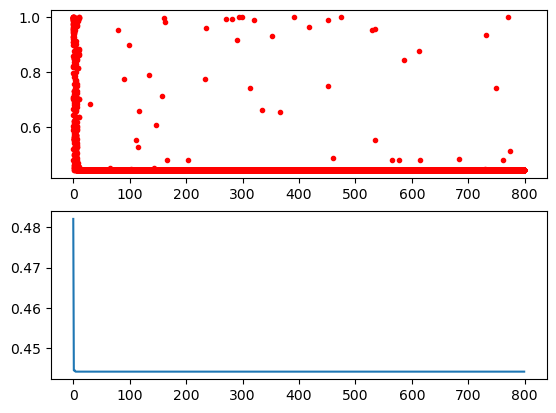

In [14]:
params = {'size_pop': 50, 'max_iter': 800, 'prob_mut': 0.001}
results = monte_carlo(rounds, schaffer_n4, 2, RCGA, [-1, -1], [1, 1], params, plot=True)

Using the parameters of the examples of the Guofei-packages that minimize the Schaffer-function N.2 we achieve to find the global minimum with a mean objective function value of 0.0 across the different Monte Carlo rounds. This implies that the system is perfectly balanced as it achieved to find the minimal solution (0) in every Monte Carlo round,

Regarding Schaffer-function N.4, we can see that again GA falls in a local minima (0.44) far from the real global minimum (0.292579) in every Monte Carlo round (since the variance is 0) making necessary to find another set of parameters to be able to reach this minimum. It is also interesting to see that this situation happens in few epochs.

### 2. Try to find a parameter set of the genetic algorithms sufficiently good.

A sufficiently good parameter set for a Genetic Algorithm (GA) can be evaluated based on its ability to consistently produce high-quality solutions for the given problem within a reasonable amount of time.

Thus, in order to find a parameter set we will consider the following aspects:

1. Evaluate the **stability** of the algorithm across multiple runs with the same parameter set. A good parameter set should produce consistent results close to the minimum across different runs, indicating robustness.

2. Measure **how quickly** the GA converges towards optimal or near-optimal solutions. This can be assessed by monitoring the fitness value of the best solution found over generations.
A good parameter set should lead to fast convergence towards high-quality solutions without premature convergence or stagnation.

First, we will look a parameter set fixing the maximum number of iterations to satisfy the first condition, and then we will try to reduce the maximum number of iterations to speed up the training without affecting the stability of the algorithm. The first aspect has higher priority since for this project we prefer a high stability than high velocity. 

####  2.1. Minimize functions using integer encoding class (GA)

### Schaffer-function N.2

The selection of Genetic Algorithm (GA) parameters (selection mechanism, crossover and mutation rate) is problem dependent and because of the No Free Lunch theorem there is no general search algorithm to find those parameters that works well for all problems.

Thus, we will perform a **grid search** over a set of parameters for each Schaffer-function over the Genetic algorithm. Then, we can evaluate the performance of each parameter set using the Monte Carlo loop keeping track of the best mean objective function value found.

Parameters to tune:
- precision : array_like
    - The precision of every variables of func (schaffer, rosenbrock)
- size_pop : int
    - Size of population
- max_iter : int
    - Max of iterations
- prob_mut : float between 0 and 1
    - Probability of mutation

In [8]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'precision': [1e-7, 1e-5, 1e-3]
}

# Perform grid search for GA
best_params_n2 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, schaffer_n2, 2, GA, [-1, -1], [1, 1], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_n2 = params

                print()

print("Best Parameters:", best_params_n2)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-07}
Minimum of objective function: 1.2092030383548114e-05
Minimum found in iteration: 9
Mean of objective function: 0.00017437175603148835
Variance of objective function: 4.183882027135381e-08
Monte Carlo standard error: 6.468293458969978e-05

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-05}
Minimum of objective function: 6.075491554291546e-08
Minimum found in iteration: 4
Mean of objective function: 9.626389757558807e-05
Variance of objective function: 3.525096677535444e-08
Monte Carlo standard error: 5.937252460132922e-05

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 0.001}
Minimum of objective function: 2.0339094105037425e-06
Minimum found in iteration: 3
Mean of objective function: 0.0002763057773663757
Variance of objective function: 2.110225062909307e-07
Monte Carlo standard error: 0.00014526613724159207

Testing params 

The best parameters found are **{'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}**, with a mean objective function value of 0.0 across the different Monte Carlo rounds. This implies that the system is perfectly balanced as it achieved to find the minimal solution (0) in every Monte Carlo round.

In [17]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20],
    'max_iter': [10,50,100,500,800],
    'prob_mut': [0.01],
    'precision': [1e-7]
}

# Perform grid search for GA
best_params_n2 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, schaffer_n2, 2, GA, [-1, -1], [1, 1], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_n2 = params

                print()

print("Best Parameters:", best_params_n2)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 10, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 7.626757475565071e-08
Minimum found in iteration: 4
Mean of objective function: 0.00011350363374998951
Variance of objective function: 2.8954428818037368e-08
Monte Carlo standard error: 5.3809319655648284e-05

Testing params {'size_pop': 20, 'max_iter': 50, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 1.3895343133896176e-06
Minimum found in iteration: 4
Mean of objective function: 6.524559240392303e-05
Variance of objective function: 5.085765623361208e-09
Monte Carlo standard error: 2.2551642120611103e-05

Testing params {'size_pop': 20, 'max_iter': 100, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 8.43769498715119e-15
Minimum found in iteration: 9
Mean of objective function: 1.0139255367519473e-05
Variance of objective function: 7.057035022788491e-10
Monte Carlo standard error: 8.400616062401906e-06

Testing params {'size_

Again we can see that the best parameters found are **{'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}**. Until a number of maximum iterations of 500 the algorithm is not able to reach the global minimum (recall that in the previous section we saw how the algorithm took around 330 iterations to converge) and increasing it to 800 seems to improve the mean of objective function value (probably some runs require more iterations to converge). As we are primarily focus on performance and robustness we will consider this set as the best one across all the experiments and we conclude considering this parameter set **sufficiently good** for this problem. 

### Schaffer-function N.4
Let's focus our attention now in the Schaffer-function N.4. We will perform again a grid search over a set of parameters for each Schaffer-function over the Genetic algorithm. Since in the literature it is usually evaluated on the square xi ∈ [-100, 100], for all i = 1, 2, we will define a search area (lower and upper bounds) in that range. Recall that the global minimum has a value of value 0.292579.

In [9]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'precision': [1e-7, 1e-5, 1e-3]
}

# Perform grid search for GA
best_params_n4 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, schaffer_n4, 2, GA, [-100, -100], [100, 100], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_n4 = params

                print()

print("Best Parameters:", best_params_n4)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-07}
Minimum of objective function: 0.29517743997040274
Minimum found in iteration: 1
Mean of objective function: 0.3836315104635112
Variance of objective function: 0.003944124102215116
Monte Carlo standard error: 0.019859818987632078

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-05}
Minimum of objective function: 0.32415962460017655
Minimum found in iteration: 8
Mean of objective function: 0.42476612391321816
Variance of objective function: 0.003886073711272443
Monte Carlo standard error: 0.01971312687341215

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 0.001}
Minimum of objective function: 0.35012866277397814
Minimum found in iteration: 1
Mean of objective function: 0.4029137766074407
Variance of objective function: 0.0016162120572858385
Monte Carlo standard error: 0.012713032908341889

Testing params {'size_pop': 20, 'max_it

The best parameters found are **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 0.001}**, with a mean and variance of objective function values of 0.292579 and 3.25e-10 respectively across the different Monte Carlo rounds. This implies that the system is perfectly balanced as it achieved to reach the global minimal solution (0.292579) in almost every round.

In [18]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20],
    'max_iter': [10,50,100,500,800],
    'prob_mut': [0.01],
    'precision': [1e-7]
}

# Perform grid search for GA
best_params_n4 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, schaffer_n4, 2, GA, [-100, -100], [100, 100], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_n4 = params

                print()

print("Best Parameters:", best_params_n4)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 10, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 0.29710355347388573
Minimum found in iteration: 2
Mean of objective function: 0.37760529982574814
Variance of objective function: 0.0035281553529984125
Monte Carlo standard error: 0.018783384553904048

Testing params {'size_pop': 20, 'max_iter': 50, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 0.299550781719888
Minimum found in iteration: 2
Mean of objective function: 0.3624842915933067
Variance of objective function: 0.004064222811458209
Monte Carlo standard error: 0.02015991768698029

Testing params {'size_pop': 20, 'max_iter': 100, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 0.29677980159484146
Minimum found in iteration: 7
Mean of objective function: 0.36821303015234064
Variance of objective function: 0.002928009230117566
Monte Carlo standard error: 0.01711142667961256

Testing params {'size_pop': 20, 'max_iter': 500, 

Again we can see that the best parameters found are **{'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}**. We can observe that the higher the number of iterations the higher the performance with lower minimum and mean of objective function. Note that we cannot take the convergence time of the previous section as an example since its convergence was too fast because it fell in a local minimum. Thus we conclude considering this parameter set **sufficiently good** for this problem.

####  2.2. Minimize functions using real-coding class (RCGA)

Let's repeat the previous experiments but in this case using the real-coding genetic algorithm.

The selection of Genetic Algorithm (GA) parameters (selection mechanism, crossover and mutation rate) is problem dependent and because of the No Free Lunch theorem there is no general search algorithm to find those parameters that works well for all problems.

Thus, we will perform a **grid search** over a set of parameters for each Schaffer-function over the Genetic algorithm. Then, we can evaluate the performance of each parameter set using the Monte Carlo loop keeping track of the best mean objective function value found.

Parameters to tune:
- prob_cros : float between 0 and 1
    - Probability of crossover
- size_pop : int
    - Size of population
- max_iter : int
    - Max of iterations
- prob_mut : float between 0 and 1
    - Probability of mutation

In [18]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'prob_cros': [0.0001, 0.001, 0.01]
}

# Perform grid search for GA
best_rc_params_n2 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for prob_cros in ga_param_grid['prob_cros']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'prob_cros':prob_cros}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, schaffer_n2, 2, RCGA, [-1, -1], [1, 1], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_rc_params_n2 = params

                print()

print("Best Parameters:", best_rc_params_n2)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.0001}
Minimum of objective function: 1.8201516340798918e-05
Minimum found in iteration: 8
Mean of objective function: 0.0005777194128034902
Variance of objective function: 8.194643775058864e-07
Monte Carlo standard error: 0.0002862628822439064

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.001}
Minimum of objective function: 9.383884786773322e-06
Minimum found in iteration: 6
Mean of objective function: 0.0005260939568798861
Variance of objective function: 4.4051279628643684e-07
Monte Carlo standard error: 0.00020988396705952478

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.01}
Minimum of objective function: 4.9613037716444985e-06
Minimum found in iteration: 7
Mean of objective function: 0.00031468726492021594
Variance of objective function: 1.4920161532408907e-07
Monte Carlo standard error: 0.0001221481130939357

Testing param

The best parameters found are **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'prob_cros': 0.01}**, with a mean objective function value of 2.45e-11 across the different Monte Carlo rounds, really close to the global minimum. This implies that the system is almost perfectly balanced as it achieved to find the minimal solution (0) in every Monte Carlo round. Note that real-coding enables the genetic algorithm to explore a continuous range of potential solutions, offering flexibility in finding optimal or near-optimal solutions within the specified search space but makes more difficult to exact solutions when they are discrete as in this case (global minimum is 0).

In [19]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [500],
    'max_iter': [10,50,100,500,800],
    'prob_mut': [0.01],
    'prob_cros': [0.01]
}

# Perform grid search for GA
best_rc_params_n2 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for prob_cros in ga_param_grid['prob_cros']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'prob_cros':prob_cros}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, schaffer_n2, 2, RCGA, [-1, -1], [1, 1], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_rc_params_n2 = params

                print()

print("Best Parameters:", best_rc_params_n2)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 500, 'max_iter': 10, 'prob_mut': 0.01, 'prob_cros': 0.01}
Minimum of objective function: 4.5949360816255336e-08
Minimum found in iteration: 1
Mean of objective function: 1.956860084179057e-06
Variance of objective function: 1.2080801981085882e-11
Monte Carlo standard error: 1.0991270163673478e-06

Testing params {'size_pop': 500, 'max_iter': 50, 'prob_mut': 0.01, 'prob_cros': 0.01}
Minimum of objective function: 3.62887964122649e-09
Minimum found in iteration: 0
Mean of objective function: 3.967209253330495e-07
Variance of objective function: 7.697198887839019e-13
Monte Carlo standard error: 2.7743826138150117e-07

Testing params {'size_pop': 500, 'max_iter': 100, 'prob_mut': 0.01, 'prob_cros': 0.01}
Minimum of objective function: 3.47759043783924e-11
Minimum found in iteration: 0
Mean of objective function: 3.444457412737911e-07
Variance of objective function: 1.0184497789094355e-12
Monte Carlo standard error: 3.191315996433815e-07

Testing params {'size_po

Again we can see that the best parameters found are **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'prob_cros': 0.01}**. We can observe that the higher the number of iterations the higher the performance with lower minimum and mean of objective function. Thus we conclude considering this parameter set **sufficiently good** for this problem.

### Schaffer-function N.4
Let's focus our attention now in the Schaffer-function N.4. We will perform again a grid search over a set of parameters for each Schaffer-function over the Genetic algorithm. Since in the literature it is usually evaluated on the square xi ∈ [-100, 100], for all i = 1, 2, we will define a search area (lower and upper bounds) in that range. Recall that the global minimum has a value of value 0.292579.

In [19]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'prob_cros': [0.0001, 0.001, 0.01]
}

# Perform grid search for GA
best_rc_params_n4 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for prob_cros in ga_param_grid['prob_cros']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'prob_cros':prob_cros}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, schaffer_n4, 2, RCGA, [-1, -1], [1, 1], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_rc_params_n4 = params

                print()

print("Best Parameters:", best_rc_params_n4)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.0001}
Minimum of objective function: 0.44427255215346234
Minimum found in iteration: 4
Mean of objective function: 0.4823956388603746
Variance of objective function: 0.0019098110739932598
Monte Carlo standard error: 0.013819591433878425

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.001}
Minimum of objective function: 0.45762087884769403
Minimum found in iteration: 1
Mean of objective function: 0.48823821277377355
Variance of objective function: 0.0012386222254989912
Monte Carlo standard error: 0.011129340616132615

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.01}
Minimum of objective function: 0.4479790154928264
Minimum found in iteration: 4
Mean of objective function: 0.5173379065640739
Variance of objective function: 0.002719494761323016
Monte Carlo standard error: 0.016490890701605587

Testing params {'size_pop': 20, 'max_i

The best parameters found are **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'prob_cros': 0.01}**, with a mean and variance of objective function values of 0.4442 and 4.95e-17 respectively across the different Monte Carlo rounds. As we can see, after the grid search we have not achieved to improve the mean of objective function nor get closer to the global minimum at least in one Monte Carlo round. This situation highlights one important difference between integer-coding and real-coding. While integer-coding may result in a coarser search space compared to real-coding, it is more efficient for certain types of problems and less prone to fall into a local minimum as it happened in the last experiment. So, in this case we have **not found a sufficiently good** parameter set.

###  3. Minimize the Rosenbrock-function (with both encodings) in a Monte Carlo loop

### 3.1. Using integer-encoding class (GA)

Rosenbrock's function is a standard test function in optimization. It has a unique minimum value of 0 attained at the point [1,1].

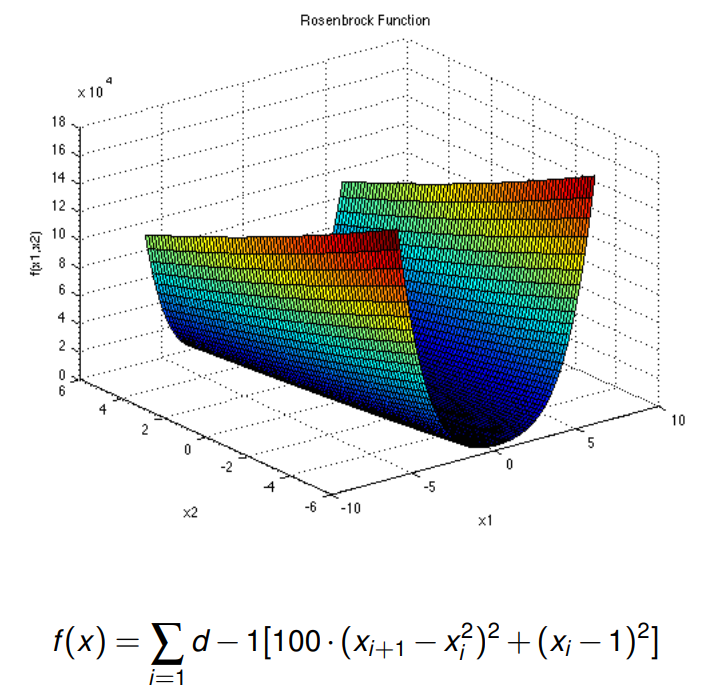

First, we will use the **parameter set which provided the best results in the previous experiment with the Schaffer N.2 implementation**. We will test it with Rosenbrock function both in three and four dimensions.

Testing best params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 0.06411714260811224
Minimum found in iteration: 3
Mean of objective function: 0.35565856026205467
Variance of objective function: 0.012840523967426801
Monte Carlo standard error: 0.035833676852127246


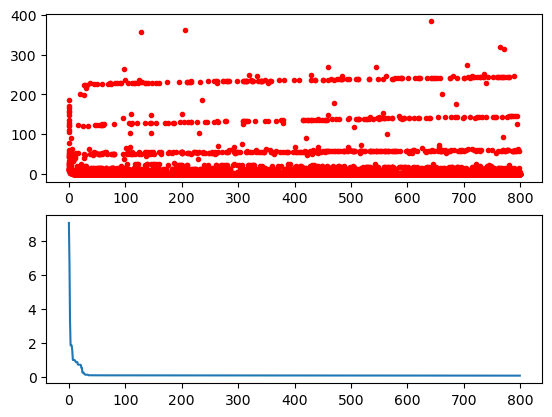

In [10]:
# Rosenbrock function in three dimensions
print("Testing best params",best_params_n2)
results = monte_carlo(rounds, rosenbrock, 3, GA, [-1, -1, -1], [1, 1, 1], best_params_n2, plot=True)

Testing Rosenbrock function in four dimensions with best params: {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 0.19157312035599436
Minimum found in iteration: 8
Mean of objective function: 0.717411339494095
Variance of objective function: 0.052106287569644784
Monte Carlo standard error: 0.07218468505828975


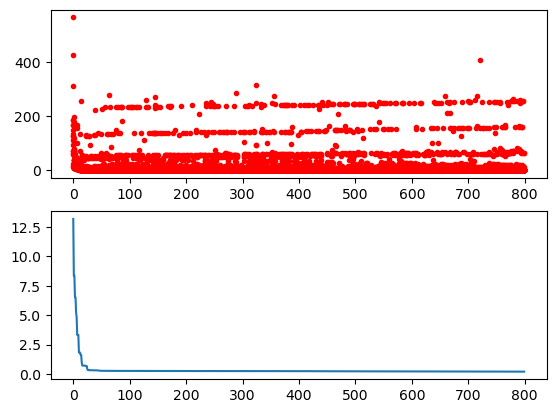

In [11]:
# Rosenbrock function in four dimensions
print("Testing Rosenbrock function in four dimensions with best params:",best_params_n2)
results = monte_carlo(rounds, rosenbrock, 4, GA, [-1, -1, -1, -1], [1, 1, 1, 1], best_params_n2, plot=True)

In this case the parameter set does not seem to be the best one since we obtain a mean of objective function on 0.36 and 0.72 for three and four dimensions respectively, quite far from the minimal solution (0). In addition, the minimum of objective function shows that we have not found the minimal solution in any round. Both executions take around 50 iterations to converge.

As in the previous section, we will perform a grid search over a set of parameters for each Rosenbrock-function over the Genetic algorithm. Then, we can evaluate the performance of each parameter set using the Monte Carlo loop keeping track of the best mean objective function value found. First, we will evaluate it for the Rosenbrock function in three dimensions.

In [12]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'precision': [1e-7, 1e-5, 1e-3]
}

# Perform grid search for GA
best_params_rosen_3 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 3, GA, [-1, -1, -1], [1, 1, 1], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_rosen_3 = params

                print()

print("Best Parameters:", best_params_rosen_3)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-07}
Minimum of objective function: 0.09233856292118602
Minimum found in iteration: 4
Mean of objective function: 0.8529093738885918
Variance of objective function: 0.6220808587488805
Monte Carlo standard error: 0.2494154884422538

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-05}
Minimum of objective function: 0.16379851176861468
Minimum found in iteration: 9
Mean of objective function: 1.0092725154267106
Variance of objective function: 0.6856227814805681
Monte Carlo standard error: 0.2618439958220482

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 0.001}


Minimum of objective function: 0.023196823177510328
Minimum found in iteration: 1
Mean of objective function: 0.8628693413723283
Variance of objective function: 0.22065875726658754
Monte Carlo standard error: 0.14854587078292938

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.001, 'precision': 1e-07}
Minimum of objective function: 0.1323796753351051
Minimum found in iteration: 5
Mean of objective function: 0.6706766261040681
Variance of objective function: 0.10090210893217033
Monte Carlo standard error: 0.10045004177807511

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.001, 'precision': 1e-05}
Minimum of objective function: 0.0824874714657984
Minimum found in iteration: 8
Mean of objective function: 0.6871221107483689
Variance of objective function: 0.12090636824354209
Monte Carlo standard error: 0.10995743187413122

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.001, 'precision': 0.001}
Minimum of objective function: 0.06042160217737647

From the output it is interesting to see how along the different experiments we have not been able to reach the minimum value of 0, though some parameter sets have come quite close. The best parameters found are **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}** with a mean objective function value of 0.1484 .

Let's see what happens when we evaluate the Rosenbrock function in four dimensions.

In [17]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'precision': [1e-7, 1e-5, 1e-3]
}

# Perform grid search for GA
best_params_rosen_4 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 4, GA, [-1, -1, -1, -1], [1, 1, 1, 1], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_rosen_4 = params

                print()

print("Best Parameters:", best_params_rosen_4)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-07}
Minimum of objective function: 0.852509425886303
Minimum found in iteration: 9
Mean of objective function: 2.0403023699557616
Variance of objective function: 1.2307040094461623
Monte Carlo standard error: 0.3508139121309419

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-05}
Minimum of objective function: 0.3565944165233501
Minimum found in iteration: 8
Mean of objective function: 1.854411014436403
Variance of objective function: 1.3480609849285867
Monte Carlo standard error: 0.3671595000716428

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 0.001}
Minimum of objective function: 0.6713746291525273
Minimum found in iteration: 4
Mean of objective function: 2.121711767762819
Variance of objective function: 0.6126576919829446
Monte Carlo standard error: 0.24751922995657216

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mu

Using the Rosenbrock function in 4 dimensions the results are even further from the minimum with quite high objective function means due to the increase on complexity derived from a higher dimensionality. The best parameters found are **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}** with a mean objective function value of 0.3159, which is ~0.2 higher than in the previous case.

Now, let's analyze whether the search area (defined by the lower and upper bound) has some influence. In order to do that we will test several combinations of lower and upper bounds. First, we will start testing Rosenbrock function in three dimensions.

Testing search area: lb - [-500, -500, -500] ub - [2, 2, 2]


Minimum of objective function: 1.0741815773389717e-07
Minimum found in iteration: 6
Mean of objective function: 0.14188134855612017
Variance of objective function: 0.014138285593425346
Monte Carlo standard error: 0.037600911682332046


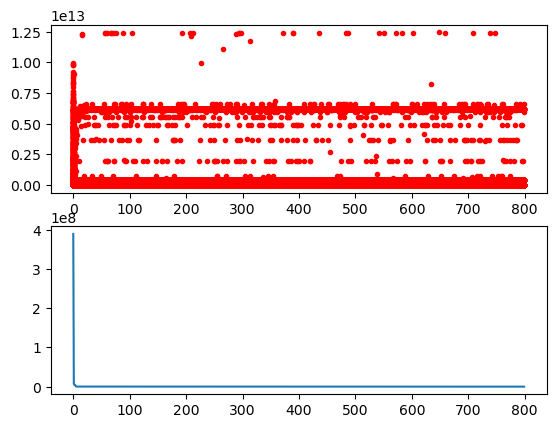

Testing search area: lb - [-500, -500, -500] ub - [100, 100, 100]
Minimum of objective function: 0.09283627096479467
Minimum found in iteration: 2
Mean of objective function: 11.922528402462095
Variance of objective function: 99.93016232007464
Monte Carlo standard error: 3.1611732366334278


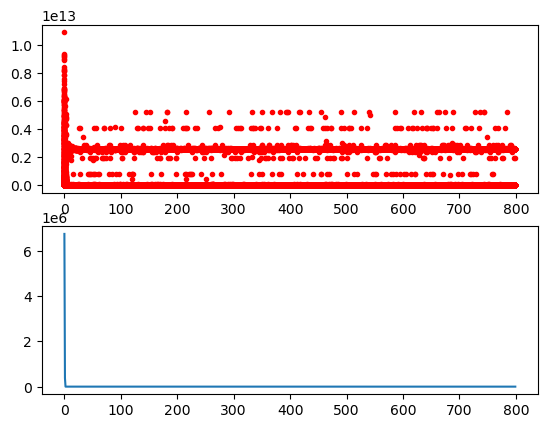

Testing search area: lb - [-500, -500, -500] ub - [500, 500, 500]
Minimum of objective function: 0.1259047069604484
Minimum found in iteration: 8
Mean of objective function: 51.82425709082186
Variance of objective function: 4045.581269227182
Monte Carlo standard error: 20.11363037650633


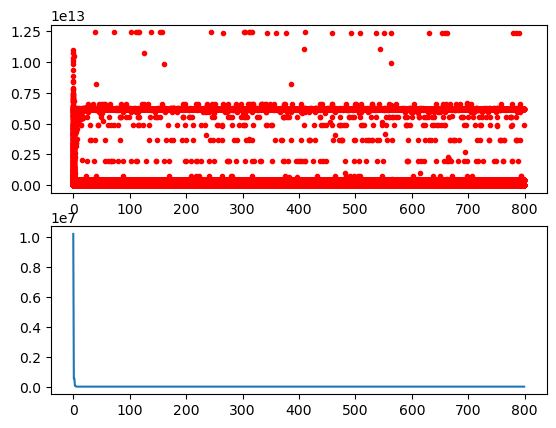

Testing search area: lb - [-100, -100, -100] ub - [2, 2, 2]
Minimum of objective function: 0.01903203278652372
Minimum found in iteration: 7
Mean of objective function: 0.1486199879842996
Variance of objective function: 0.010299146043553014
Monte Carlo standard error: 0.03209228262924439


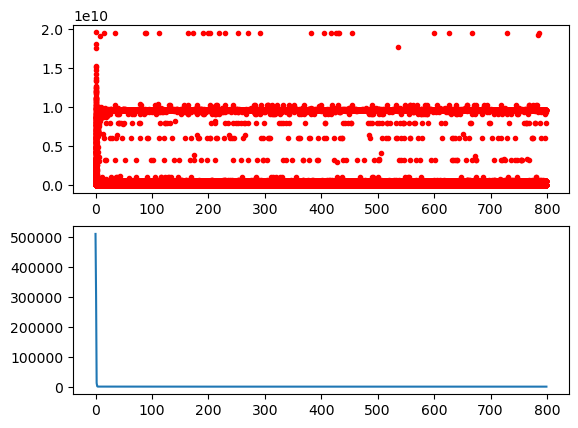

Testing search area: lb - [-100, -100, -100] ub - [100, 100, 100]
Minimum of objective function: 0.010384319447664657
Minimum found in iteration: 1
Mean of objective function: 5.720066886668647
Variance of objective function: 80.52547969006525
Monte Carlo standard error: 2.8377011768342566


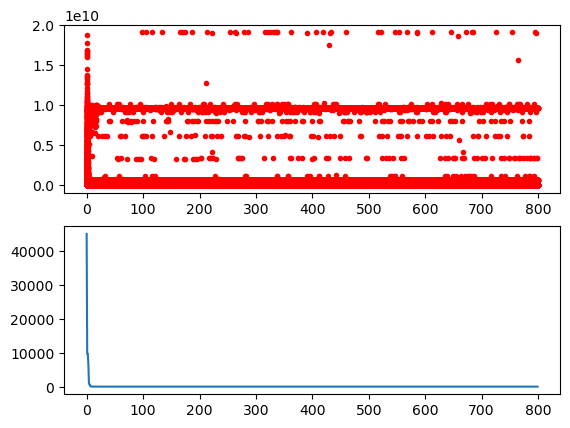

Testing search area: lb - [-100, -100, -100] ub - [500, 500, 500]
Minimum of objective function: 22.440973548783305
Minimum found in iteration: 8
Mean of objective function: 75.79301897253949
Variance of objective function: 1850.7597802817338
Monte Carlo standard error: 13.604263229891334


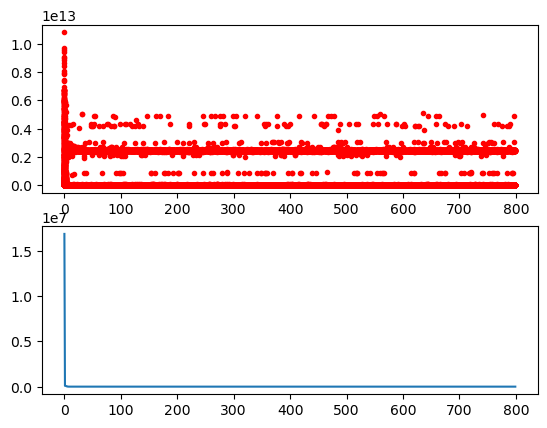

Testing search area: lb - [1, 1, 1] ub - [2, 2, 2]
Minimum of objective function: 0.006539891226606226
Minimum found in iteration: 6
Mean of objective function: 0.029313392153906
Variance of objective function: 0.00044400688511442874
Monte Carlo standard error: 0.006663384163579559


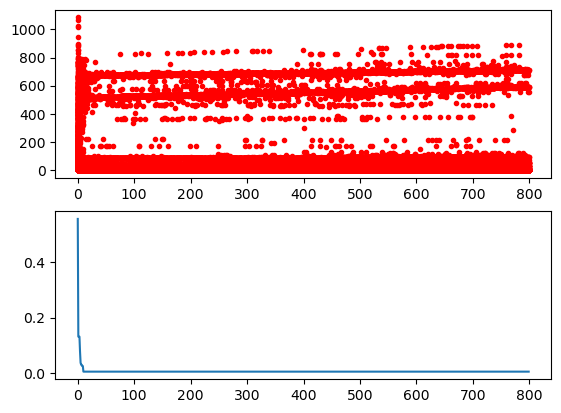

Testing search area: lb - [1, 1, 1] ub - [100, 100, 100]
Minimum of objective function: 0.7020346231311325
Minimum found in iteration: 2
Mean of objective function: 11.826900861802542
Variance of objective function: 76.66313408878543
Monte Carlo standard error: 2.768810829377576


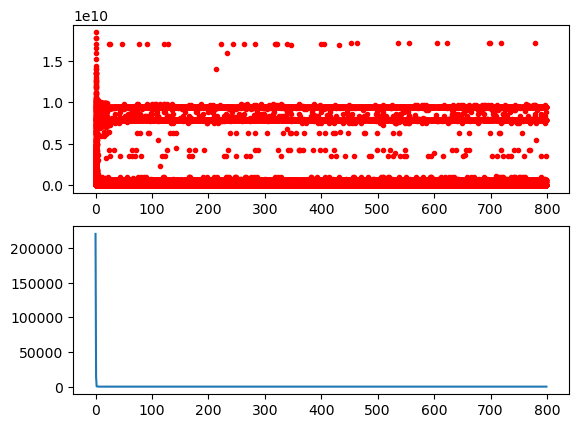

Testing search area: lb - [1, 1, 1] ub - [500, 500, 500]
Minimum of objective function: 0.46302038358981124
Minimum found in iteration: 0
Mean of objective function: 50.798108924086065
Variance of objective function: 2209.6624048517056
Monte Carlo standard error: 14.864933248594511


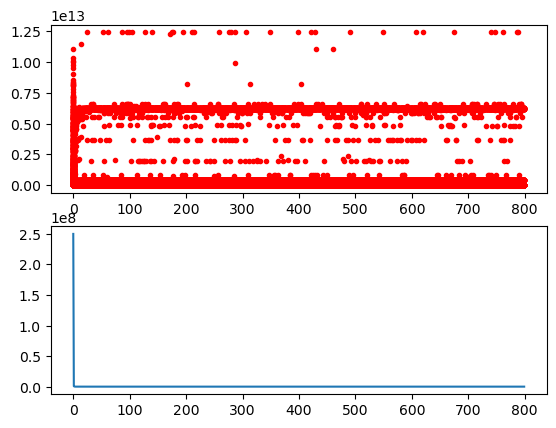

In [14]:
# Rosenbrock function in three dimensions
for lb_v in [-500,-100, 1]:
    for ub_v in [2, 100, 500]:
        lb = [lb_v,lb_v,lb_v]
        ub = [ub_v,ub_v,ub_v]
        print("Testing search area: lb -",lb,"ub -",ub)
        best_ga, mean_result = monte_carlo(rounds, rosenbrock, 3, GA, lb, ub, best_params_rosen_3, plot=True)

Note that the plots only show the convergence and population of the best found solution with the tested boundaries and it is interesting to see that all of them converge in few iterations. 

From the results (minimum, mean and variance) obtained above we can see that the search space or search area can have a significant influence on the performance and behavior of a genetic search algorithm. In the previous experiment we applied a grid search over a search area between ([-1, -1, -1], [1, 1, 1]) and the best parameters found were **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}** with a mean objective function value of 0.1484 and reaching a minimum of objective function of 0.052. However, just by modifying the search area we achieved to get a quite better mean objective function (0.0293) really close to the global minimum value, a minimum of objective function of 0.006 and a very low variance within a testing search area ([1, 1, 1], [2, 2, 2]).

In this case reducing the search space helped to improve the algorithm performance (Rosenbrock function solution is located in (1,1)). Recall that search area refers to the set of all possible solutions that can be explored during the optimization process. These lower and upper bounds set the boundaries within which the algorithm searches for the optimal solution. If the size and scale of the search area is smaller it may lead to faster convergence since the algorithm has fewer options to explore, but it is possible that it will not be able to reach the global minimum. However if the scale is higher there would be a large amount of options leading to an increment of variance clearly exemplified in the results above. Thus, it is important to find a trade-off between complexity and completeness of the exploration which can only by found by experimentation.

Having as a goal to reach the minimum of 0, let's do again the same grid search as before but using the newly discovered search area which achieved to get good performance ([1, 1, 1], [2, 2, 2]).

In [15]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'precision': [1e-7, 1e-5, 1e-3]
}

# Perform grid search for GA
best_params_rosen_3 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 3, GA, [1, 1, 1], [2, 2, 2], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_rosen_3 = params

                print()

print("Best Parameters:", best_params_rosen_3)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-07}
Minimum of objective function: 183.6606874604187
Minimum found in iteration: 9
Mean of objective function: 5552154.553061528
Variance of objective function: 246970830541904.25
Monte Carlo standard error: 4969615.986591964

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1e-05}
Minimum of objective function: 40.6506728885761
Minimum found in iteration: 2
Mean of objective function: 794744.2208115972
Variance of objective function: 1875637615380.265
Monte Carlo standard error: 433086.3211162718

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 0.001}
Minimum of objective function: 19.065501697408788
Minimum found in iteration: 4
Mean of objective function: 13693278.311606243
Variance of objective function: 1024074092442457.6
Monte Carlo standard error: 10119654.601034848

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.

Minimum of objective function: 0.032993555922331656
Minimum found in iteration: 5
Mean of objective function: 1.2915927775010054
Variance of objective function: 1.2503748741276592
Monte Carlo standard error: 0.3536064018266155

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.001, 'precision': 0.001}
Minimum of objective function: 0.4512862480545058
Minimum found in iteration: 3
Mean of objective function: 0.950699763996038
Variance of objective function: 0.05721808700622959
Monte Carlo standard error: 0.07564263811252855

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 0.06381663066379366
Minimum found in iteration: 9
Mean of objective function: 0.8413631985759984
Variance of objective function: 1.3856187536748543
Monte Carlo standard error: 0.37223900301753093

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-05}
Minimum of objective function: 0.0710510720968683
Minim

We obtain again the same best parameters **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-05}**. To conclude with this experiment, let's check whether reducing the number of maximum iterations we mantain the same algorithm stability.

In [21]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [500],
    'max_iter': [10,50,100,500,800],
    'prob_mut': [0.01],
    'precision': [1e-5]
}

# Perform grid search for GA
best_params_rosen_3 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 3, GA, [1, 1, 1], [2, 2, 2], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_rosen_3 = params

                print()

print("Best Parameters:", best_params_rosen_3)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 500, 'max_iter': 10, 'prob_mut': 0.01, 'precision': 1e-05}
Minimum of objective function: 0.011483762818057928
Minimum found in iteration: 0
Mean of objective function: 0.03054368804006611
Variance of objective function: 0.00036872233031415557
Monte Carlo standard error: 0.006072251067883767

Testing params {'size_pop': 500, 'max_iter': 50, 'prob_mut': 0.01, 'precision': 1e-05}
Minimum of objective function: 0.0004751968042441577
Minimum found in iteration: 1
Mean of objective function: 0.014752306865520714
Variance of objective function: 5.649215198777581e-05
Monte Carlo standard error: 0.0023768077748900058

Testing params {'size_pop': 500, 'max_iter': 100, 'prob_mut': 0.01, 'precision': 1e-05}
Minimum of objective function: 0.0011388719490313319
Minimum found in iteration: 9
Mean of objective function: 0.030489588951950596
Variance of objective function: 0.0008315018987888409
Monte Carlo standard error: 0.009118672594127068

Testing params {'size_pop': 50

In this case the best parameters found are **{'size_pop': 500, 'max_iter': 50, 'prob_mut': 0.01, 'precision': 1e-05}**. As we previously saw, using Rosenbrock function the algorithm converges quickly making not necessary to execute a large number of iterations. Thus, reducing it we can obtain an improvement in execution time without affecting the algorithm stability and we conclude considering this parameter set **sufficiently good** for this problem.

Let's now test Rosenbrock function in four dimensions to see what happens. First, let's analyze the influence of the search area.

Testing search area: lb - [-500, -500, -500, -500] ub - [2, 2, 2, 2]


Minimum of objective function: 0.0009254777379693044
Minimum found in iteration: 0
Mean of objective function: 0.37953470241438386
Variance of objective function: 0.08215649813448193
Monte Carlo standard error: 0.09064022183031213


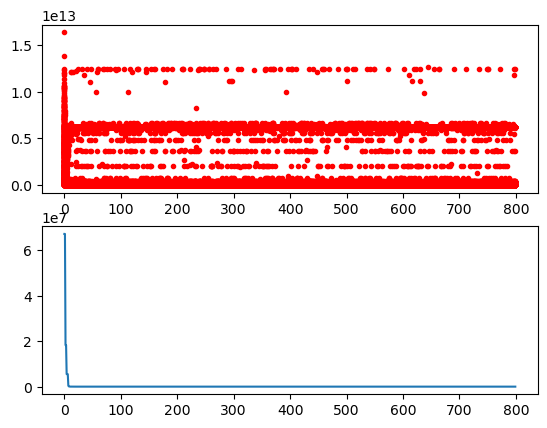

Testing search area: lb - [-500, -500, -500, -500] ub - [100, 100, 100, 100]
Minimum of objective function: 0.02369852434736886
Minimum found in iteration: 8
Mean of objective function: 16.178952138889183
Variance of objective function: 468.6809194138955
Monte Carlo standard error: 6.84602745695557


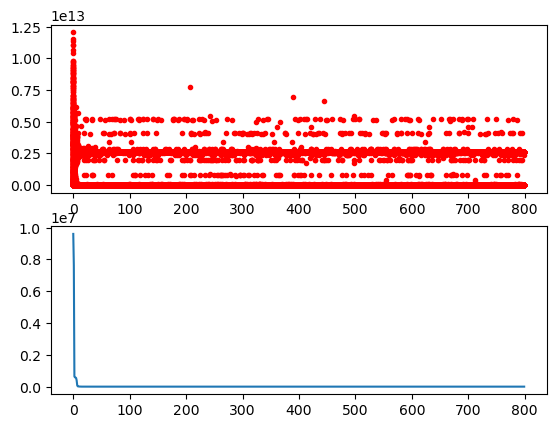

Testing search area: lb - [-500, -500, -500, -500] ub - [500, 500, 500, 500]
Minimum of objective function: 0.16713813537515393
Minimum found in iteration: 7
Mean of objective function: 34.978023774398636
Variance of objective function: 3509.3132126205846
Monte Carlo standard error: 18.7331610056087


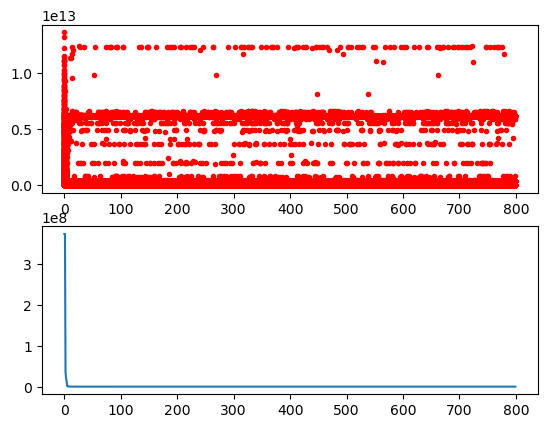

Testing search area: lb - [-100, -100, -100, -100] ub - [2, 2, 2, 2]
Minimum of objective function: 0.033134041942965625
Minimum found in iteration: 1
Mean of objective function: 0.37108596616551603
Variance of objective function: 0.029953053911432114
Monte Carlo standard error: 0.05472938325199007


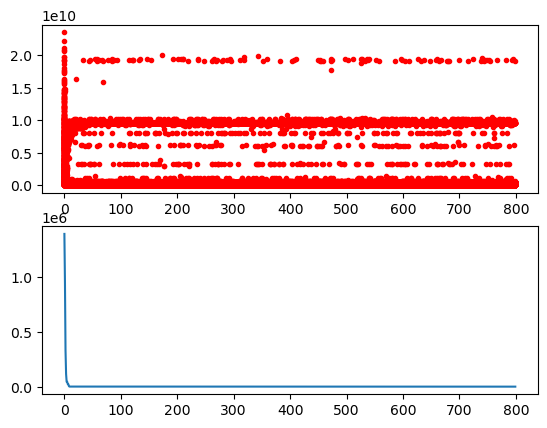

Testing search area: lb - [-100, -100, -100, -100] ub - [100, 100, 100, 100]
Minimum of objective function: 0.049929736553840316
Minimum found in iteration: 6
Mean of objective function: 12.623609331028494
Variance of objective function: 372.3299572937249
Monte Carlo standard error: 6.101884604724386


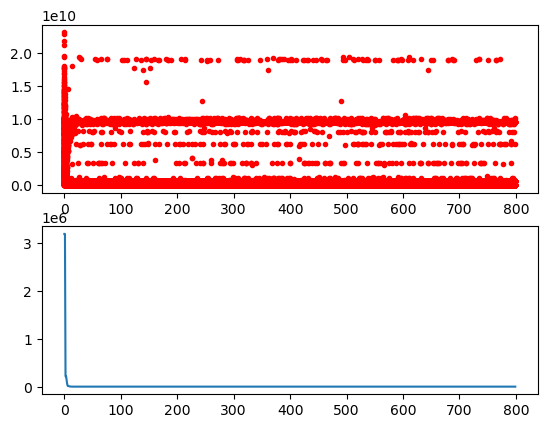

Testing search area: lb - [-100, -100, -100, -100] ub - [500, 500, 500, 500]
Minimum of objective function: 10.918755214733913
Minimum found in iteration: 1
Mean of objective function: 58.84369858988249
Variance of objective function: 3167.396556812757
Monte Carlo standard error: 17.797181116156448


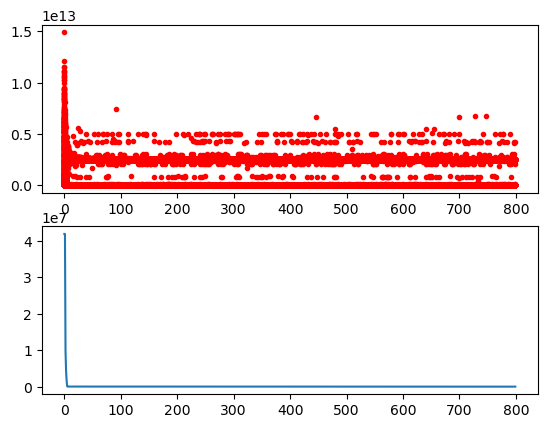

Testing search area: lb - [1, 1, 1, 1] ub - [2, 2, 2, 2]
Minimum of objective function: 0.04113455244262908
Minimum found in iteration: 4
Mean of objective function: 0.07146800481489306
Variance of objective function: 0.000468232676802861
Monte Carlo standard error: 0.006842752931407512


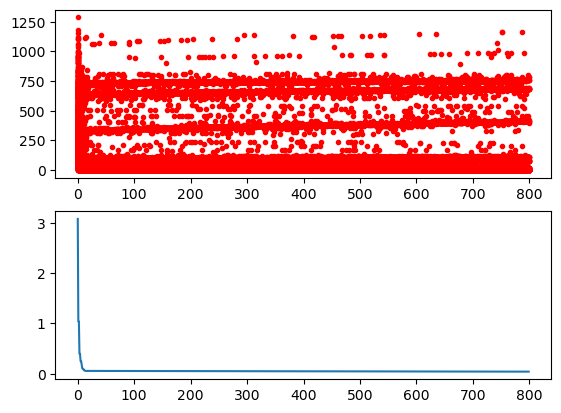

Testing search area: lb - [1, 1, 1, 1] ub - [100, 100, 100, 100]
Minimum of objective function: 0.7832826227732106
Minimum found in iteration: 1
Mean of objective function: 29.186641631831616
Variance of objective function: 506.63767269495384
Monte Carlo standard error: 7.117848500038152


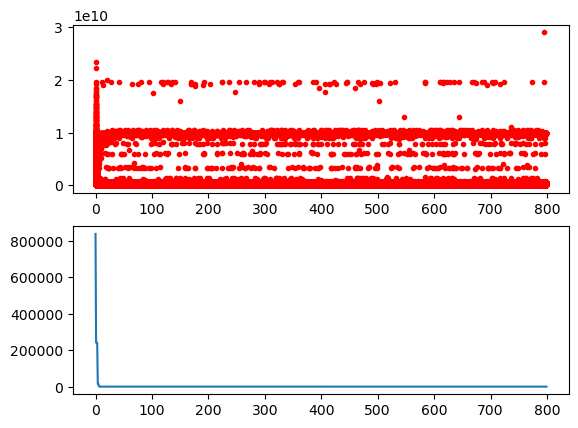

Testing search area: lb - [1, 1, 1, 1] ub - [500, 500, 500, 500]
Minimum of objective function: 19.327118317779515
Minimum found in iteration: 5
Mean of objective function: 197.95986842546182
Variance of objective function: 20527.30315204351
Monte Carlo standard error: 45.307066945503664


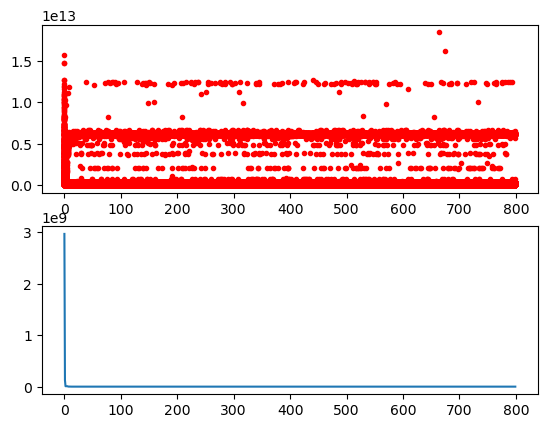

In [18]:
# Rosenbrock function in four dimensions
for lb_v in [-500,-100, 1]:
    for ub_v in [2, 100, 500]:
        lb = [lb_v,lb_v,lb_v,lb_v]
        ub = [ub_v,ub_v,ub_v,ub_v]
        print("Testing search area: lb -",lb,"ub -",ub)
        best_ga, mean_result = monte_carlo(rounds, rosenbrock, 4, GA, lb, ub, best_params_rosen_4, plot=True)

Same as with Rosenbrock function in three dimensions, the search area has a significant influence in the GA. In this case the search area which provide a closest minimum of objective function (0.0006) to the global minimum is [-500, 2], however the search area which provide the lowest mean of objective function is again ([1, 1, 1, 1], [2, 2, 2, 2]). To end with this experiment let's reduce the number of maximum iterations. Recall that the previous best parameter set was **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1e-07}**.

In [23]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [500],
    'max_iter': [10,50,100,500,800],
    'prob_mut': [0.01],
    'precision': [1e-7]
}

# Perform grid search for GA
best_params_rosen_4 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 4, GA, [1, 1, 1, 1], [2, 2, 2, 2], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_rosen_4 = params

                print()

print("Best Parameters:", best_params_rosen_4)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 500, 'max_iter': 10, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 0.042277261897361654
Minimum found in iteration: 5
Mean of objective function: 0.10003323582466636
Variance of objective function: 0.0015091037359122523
Monte Carlo standard error: 0.012284558339282091

Testing params {'size_pop': 500, 'max_iter': 50, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 0.02437658127732531
Minimum found in iteration: 9
Mean of objective function: 0.06371664831452115
Variance of objective function: 0.0003493933791868417
Monte Carlo standard error: 0.0059109506780791335

Testing params {'size_pop': 500, 'max_iter': 100, 'prob_mut': 0.01, 'precision': 1e-07}
Minimum of objective function: 0.047301711375218936
Minimum found in iteration: 7
Mean of objective function: 0.07501044833260746
Variance of objective function: 0.00045255736678564463
Monte Carlo standard error: 0.006727238413982699

Testing params {'size_pop': 500, 'm

Same as using Rosenbrock function in 3 dimensions, the best parameters found are **{'size_pop': 500, 'max_iter': 50, 'prob_mut': 0.01, 'precision': 1e-07}**. As we previously saw, using Rosenbrock function the algorithm converges quickly making not necessary to execute a large number of iterations. Thus, reducing it we can obtain an improvement in execution time without affecting the algorithm stability and we conclude considering this parameter set **sufficiently good** for this problem.

#### ANOTHER EXPERIMENT: High precision values

Let's repeat now the previous grid search experiments for Schaffer N.2, Schaffer N.4 and Rosenbrock functions but using the integer-number precision which were not previously tested.

In [19]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'precision': [1, 5, 25]
}

# Perform grid search for GA
best_params_n2 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, schaffer_n2, 2, GA, [-1, -1], [1, 1], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_n2 = params

                print()

print("Best Parameters:", best_params_n2)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1}
Minimum of objective function: 0.0
Minimum found in iteration: 1
Mean of objective function: 0.0005982047880287222
Variance of objective function: 8.349809263144732e-07
Monte Carlo standard error: 0.00028896036515662027

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 5}
Minimum of objective function: 0.0019940159600957408
Minimum found in iteration: 0
Mean of objective function: 0.0019940159600957408
Variance of objective function: 0.0
Monte Carlo standard error: 0.0

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 25}
Minimum of objective function: 0.0019940159600957408
Minimum found in iteration: 0
Mean of objective function: 0.0019940159600957408
Variance of objective function: 0.0
Monte Carlo standard error: 0.0

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.001, 'precision': 1}
Minimum of objective function: 0.0


Minimum of objective function: 0.0019940159600957408
Minimum found in iteration: 0
Mean of objective function: 0.0019940159600957408
Variance of objective function: 0.0
Monte Carlo standard error: 0.0

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.001, 'precision': 25}
Minimum of objective function: 0.0019940159600957408
Minimum found in iteration: 0
Mean of objective function: 0.0019940159600957408
Variance of objective function: 0.0
Monte Carlo standard error: 0.0

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 1}
Minimum of objective function: 0.0
Minimum found in iteration: 0
Mean of objective function: 0.0
Variance of objective function: 0.0
Monte Carlo standard error: 0.0

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.01, 'precision': 5}
Minimum of objective function: 0.0019940159600957408
Minimum found in iteration: 0
Mean of objective function: 0.0019940159600957408
Variance of objective function: 0.0
Monte Carl

In [20]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'precision': [1, 5, 25]
}

# Perform grid search for GA
best_params_n4 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, schaffer_n4, 2, GA, [-100, -100], [100, 100], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params_n4 = params

                print()

print("Best Parameters:", best_params_n4)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1}
Minimum of objective function: 0.3166208030475184
Minimum found in iteration: 4
Mean of objective function: 0.3880896320885893
Variance of objective function: 0.0024899012328090993
Monte Carlo standard error: 0.0157794208791359

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 5}
Minimum of objective function: 0.4049159750787352
Minimum found in iteration: 3
Mean of objective function: 0.4473454314206055
Variance of objective function: 0.0007659656782781879
Monte Carlo standard error: 0.00875194651650813

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 25}
Minimum of objective function: 0.4952641281948948
Minimum found in iteration: 0
Mean of objective function: 0.49536278623313823
Variance of objective function: 8.760067659056991e-08
Monte Carlo standard error: 9.359523310007294e-05

Testing params {'size_pop': 20, 'max_iter': 800, 'pr

In [21]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'precision': [1, 5, 25]
}

# Perform grid search for GA
best_params = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for precision in ga_param_grid['precision']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'precision':precision}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 3, GA, [-1, -1, -1], [1, 1, 1], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_params = params

                print()

print("Best Parameters:", best_params)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 1}
Minimum of objective function: 0.0
Minimum found in iteration: 0
Mean of objective function: 0.0
Variance of objective function: 0.0
Monte Carlo standard error: 0.0

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 5}
Minimum of objective function: 0.0
Minimum found in iteration: 0
Mean of objective function: 0.0
Variance of objective function: 0.0
Monte Carlo standard error: 0.0

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'precision': 25}
Minimum of objective function: 0.0
Minimum found in iteration: 0
Mean of objective function: 0.0
Variance of objective function: 0.0
Monte Carlo standard error: 0.0

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.001, 'precision': 1}
Minimum of objective function: 0.0
Minimum found in iteration: 0
Mean of objective function: 0.0
Variance of objective function: 0.0
Monte Carlo standard error: 0

It is interesting to see that using an integer precision the Schaffer N.2 and Rosenbrock functions returns a Mean of objective function of 0 in almost every tested parameter set whereas Schaffer N.4 is not able to reach (or at least to get close) to the global minimum.

The precision parameter defines how finely the search space is divided. Since the latter function has global minimums in (0,1.25312), (0,-1.25313) (1.25312,0) and (-1.25313,0), using an integer precision makes the search space to be divided into bigger increments, overpassing these points.

Thus, we have just seen that the precision parameter can be critical for problems where small changes in parameter values can significantly affect the fitness or quality of solutions. While smaller precision values can enhance the accuracy of solutions, it may also increase the computational cost of the genetic algorithm. This is because a smaller precision value often requires a larger population size and more generations to explore the search space thoroughly.

### 3.2. Using real-encoding class (RCGA)

First, we will use the **parameter set which provided the best results in the previous experiment with the Schaffer N.2 implementation**. We will test it with Rosenbrock function both in three and four dimensions.

Testing Rosenbrock function in three dimensions with best params: {'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'prob_cros': 0.01}
Minimum of objective function: 0.004970991314266196
Minimum found in iteration: 1
Mean of objective function: 0.1960067516984232
Variance of objective function: 0.035971566381095894
Monte Carlo standard error: 0.05997630063708156


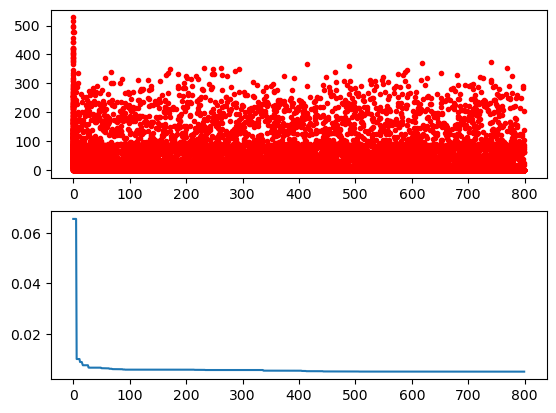

In [20]:
# Rosenbrock function in three dimensions
print("Testing Rosenbrock function in three dimensions with best params:",best_rc_params_n2)
results = monte_carlo(rounds, rosenbrock, 3, RCGA, [-1, -1, -1], [1, 1, 1], best_rc_params_n2, plot=True)

Testing Rosenbrock function in four dimensions with best params: {'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'prob_cros': 0.01}
Minimum of objective function: 0.004504663590763174
Minimum found in iteration: 5
Mean of objective function: 0.4181944596160494
Variance of objective function: 0.27078219418249844
Monte Carlo standard error: 0.16455460922821286


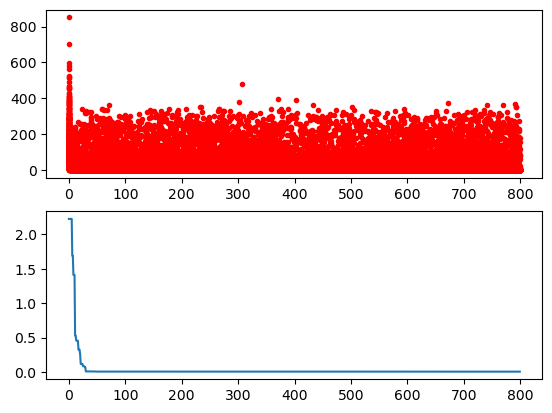

In [21]:
# Rosenbrock function in four dimensions
print("Testing Rosenbrock function in four dimensions with best params:",best_rc_params_n2)
results = monte_carlo(rounds, rosenbrock, 4, RCGA, [-1, -1, -1, -1], [1, 1, 1, 1], best_rc_params_n2, plot=True)

In this case the parameter set does not seem to be the best one since we obtain a mean of objective function on 0.19 and 0.41 for three and four dimensions respectively, quite far from the minimal solution (0). In addition, the minimum of objective function shows that we have not found the minimal solution in any round, but at least we get quite close.

As in the previous section, we will perform a grid search over a set of parameters for each Rosenbrock-function over the Genetic algorithm. Then, we can evaluate the performance of each parameter set using the Monte Carlo loop keeping track of the best mean objective function value found. First, we will evaluate it for the Rosenbrock function in three dimensions. We will use the search area ([1,1,1],[2,2,2])

In [23]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'prob_cros': [0.0001, 0.001, 0.01]
}

# Perform grid search for GA
best_rc_params_rosen_3 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for prob_cros in ga_param_grid['prob_cros']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'prob_cros':prob_cros}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 3, RCGA, [1, 1, 1], [2, 2, 2], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_rc_params_rosen_3 = params

                print()

print("Best Parameters:", best_rc_params_rosen_3)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.0001}
Minimum of objective function: 0.4066367944655624
Minimum found in iteration: 1
Mean of objective function: 10.177824799166762
Variance of objective function: 143.26782597317242
Monte Carlo standard error: 3.785073658109871

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.001}
Minimum of objective function: 0.534684403142664
Minimum found in iteration: 4
Mean of objective function: 7.087757862439664
Variance of objective function: 40.51842979490361
Monte Carlo standard error: 2.012919019605697

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.01}
Minimum of objective function: 0.5134968697674448
Minimum found in iteration: 0
Mean of objective function: 2.924662142180975
Variance of objective function: 13.67318747602861
Monte Carlo standard error: 1.1693240558557156

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0

From the output it is interesting to see how along the different experiments we have not been able to reach the minimum value of 0, though some parameter sets have come quite close. The best parameters found are **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.01, 'prob_cros': 0.001}** with a mean objective function value of 0.0182 that we can consider sufficiently good.

In [24]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [500],
    'max_iter': [10,50,100,500,800],
    'prob_mut': [0.01],
    'prob_cros': [0.001]
}

# Perform grid search for GA
best_rc_params_rosen_3 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for prob_cros in ga_param_grid['prob_cros']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'prob_cros':prob_cros}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 3, RCGA, [1, 1, 1], [2, 2, 2], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_rc_params_rosen_3 = params

                print()

print("Best Parameters:", best_rc_params_rosen_3)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 500, 'max_iter': 10, 'prob_mut': 0.01, 'prob_cros': 0.001}
Minimum of objective function: 0.0882566643714677
Minimum found in iteration: 2
Mean of objective function: 0.1817206739065482
Variance of objective function: 0.005414803998032901
Monte Carlo standard error: 0.02326973140806077

Testing params {'size_pop': 500, 'max_iter': 50, 'prob_mut': 0.01, 'prob_cros': 0.001}
Minimum of objective function: 0.00018644737239340695
Minimum found in iteration: 8
Mean of objective function: 0.033103749033353204
Variance of objective function: 0.0017839065795902064
Monte Carlo standard error: 0.013356296566002892

Testing params {'size_pop': 500, 'max_iter': 100, 'prob_mut': 0.01, 'prob_cros': 0.001}
Minimum of objective function: 8.009517234381743e-06
Minimum found in iteration: 8
Mean of objective function: 0.02202399855180249
Variance of objective function: 0.0005705945583798961
Monte Carlo standard error: 0.0075537709680655275

Testing params {'size_pop': 500, 'ma

The best parameters found are **{'size_pop': 500, 'max_iter': 500, 'prob_mut': 0.01, 'prob_cros': 0.001}**. As we previously saw, using Rosenbrock function the algorithm converges quickly making not necessary to execute a large number of iterations. However, we can see that in this case we need a higher number of maximum iterations comparing with integer-coding GA, highlighting the higher complexity of this encoding in terms of exploration of the search space. In conclusion, reducing the number of maximum iterations we can obtain an improvement in execution time without affecting the algorithm stability and we conclude considering this parameter set **sufficiently good** for this problem.

Let's see what happens when we evaluate the Rosenbrock function in four dimensions.

In [25]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [800],
    'prob_mut': [0.0001, 0.001, 0.01],
    'prob_cros': [0.0001, 0.001, 0.01]
}

# Perform grid search for GA
best_rc_params_rosen_4 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for prob_cros in ga_param_grid['prob_cros']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'prob_cros':prob_cros}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 4, RCGA, [1, 1, 1, 1], [2, 2, 2, 2], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_rc_params_rosen_4 = params

                print()

print("Best Parameters:", best_rc_params_rosen_4)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.0001}
Minimum of objective function: 0.28999057802144607
Minimum found in iteration: 9
Mean of objective function: 24.695626710653066
Variance of objective function: 632.689529410623
Monte Carlo standard error: 7.9541783322391195

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.001}
Minimum of objective function: 2.4596250941943403
Minimum found in iteration: 9
Mean of objective function: 29.35879966308862
Variance of objective function: 478.58769748839643
Monte Carlo standard error: 6.9180033065068445

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut': 0.0001, 'prob_cros': 0.01}
Minimum of objective function: 1.4597173693392627
Minimum found in iteration: 5
Mean of objective function: 29.26348107416153
Variance of objective function: 758.5344016527071
Monte Carlo standard error: 8.709388047691451

Testing params {'size_pop': 20, 'max_iter': 800, 'prob_mut':

Using the Rosenbrock function in 4 dimensions the results are even farther from the minimum with quite high objective function means due to the increase on complexity derived from a higher dimensionality. The best parameters found are **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.001, 'prob_cros': 0.0001}** with a mean objective function value of 0.0302 which we can consider sufficiently good.

In [25]:
# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [500],
    'max_iter': [10,50,100,500,800],
    'prob_mut': [0.001],
    'prob_cros': [0.0001]
}

# Perform grid search for GA
best_rc_params_rosen_4 = None
best_mean_result = float('inf')

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            for prob_cros in ga_param_grid['prob_cros']:
                params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut, 'prob_cros':prob_cros}
                print("Testing params",params)
                best_ga, mean_result = monte_carlo(rounds, rosenbrock, 4, RCGA, [1, 1, 1, 1], [2, 2, 2, 2], params)
                
                if mean_result < best_mean_result:
                    best_mean_result = mean_result
                    best_rc_params_rosen_4 = params

                print()

print("Best Parameters:", best_rc_params_rosen_4)
print("Best Mean Objective Function Value:", best_mean_result)

Testing params {'size_pop': 500, 'max_iter': 10, 'prob_mut': 0.001, 'prob_cros': 0.0001}
Minimum of objective function: 0.5240489702492597
Minimum found in iteration: 3
Mean of objective function: 2.8564391842106978
Variance of objective function: 3.320764031080523
Monte Carlo standard error: 0.5762607075864641

Testing params {'size_pop': 500, 'max_iter': 50, 'prob_mut': 0.001, 'prob_cros': 0.0001}
Minimum of objective function: 0.02616092520365266
Minimum found in iteration: 0
Mean of objective function: 0.26029354904062535
Variance of objective function: 0.1519770553695786
Monte Carlo standard error: 0.12327897443180591

Testing params {'size_pop': 500, 'max_iter': 100, 'prob_mut': 0.001, 'prob_cros': 0.0001}
Minimum of objective function: 0.0005933759088804772
Minimum found in iteration: 5
Mean of objective function: 0.13259733464107934
Variance of objective function: 0.012886968351191089
Monte Carlo standard error: 0.03589842385285333

Testing params {'size_pop': 500, 'max_iter': 

We can see that the best parameters found are **{'size_pop': 500, 'max_iter': 800, 'prob_mut': 0.001, 'prob_cros': 0.0001}**. We can observe that the higher the number of iterations the higher the performance with lower minimum and mean of objective function. As we are primarily focus on performance and robustness we will consider this set as the best one across all the experiments and we conclude considering this parameter set **sufficiently good** for this problem. 

### 4. Find the optimal tour in a Monte Carlo loop

In [12]:
# AUXILIARY FUNCTIONS
def TourLength(T):
  t=len(T)
  prev=T[t-1]
  length=0.0
  for i in range(0,t):
    curr=T[i]
    length+=DistanceRounded(prev,curr)
    prev=curr
  return length

def ReadTsp(fn):
  f=open(fn+".tsp","rt")
  reader=csv.reader(f,delimiter=" ",skipinitialspace=True)
  coordinates=False
  cities=[]
  best=0.0
  index=0
  for row in reader:
    if row[0]=="EOF":
      break
    elif coordinates:
      cities.append((float(row[1]),float(row[2]),index))
      index+=1
    elif row[0]=="BEST:":
      best=float(row[1])
    elif row[0]=="NAME:":
      print("reading tour",row[1])
    elif row[0]=="NODE_COORD_SECTION":
      coordinates=True
  f.close()
  opt=[]
  try:
    f=open(fn+".opt.tour","rt")
    reader=csv.reader(f,delimiter=" ",skipinitialspace=True)
    coordinates=False
    for row in reader:
      if row[0]=="EOF" or row[0]=="-1":
        break
      elif coordinates:
        index=int(row[0])
        opt.append((cities[index-1][0],cities[index-1][1],index))
      elif row[0]=="NAME:":
        print("reading optimal tour",row[1])
      elif row[0]=="TOUR_SECTION":
        coordinates=True
  except FileNotFoundError:
    print("optimal tour not available")
  finally:
    f.close()

  print("reading done",best)
  return cities,best,opt

def WriteTsp(fn,T):
  f=open(fn+".opt.tour","wt")
  f.write("NAME: "+fn+".opt.tour\n")
  f.write("COMMENT : Length "+str(TourLength(T))+"\n")
  f.write("COMMENT : Found by tsp [Jose Angel Perez Garrido]\n")
  f.write("TYPE: TOUR\n")
  f.write("DIMENSION: "+str(len(T))+"\n")
  f.write("TOUR_SECTION\n")
  for t in T:
    f.write(str(t[2]+1)+"\n")
  f.write("-1\n")
  f.write("EOF\n")
  f.close()
  print("writing done")

def Distance(p,q):
  """Returns distance between points p and q assuming that the x- and
  y-coordinates are the first and second entry of the point-tuple"""
  #return math.fabs(p[0]-q[0])+math.fabs(p[1]-q[1])
  return math.hypot(p[0]-q[0],p[1]-q[1])

def DistanceRounded(p,q):
  """Returns rounded distance between points p and q assuming that the x- and
  y-coordinates are the first and second entry of the point-tuple"""
  #return int(math.fabs(p[0]-q[0])+math.fabs(p[1]-q[1])+0.5)
  return int(math.hypot(p[0]-q[0],p[1]-q[1])+0.5)

def TourError(T,best_length):
  return 100.0*(TourLength(T)-best_length)/best_length

def MakeTourWithCities(I,C):
  T=[]
  for i in I:
    T.append((C[i][0],C[i][1],i))
  return T

def PlotTour(T,col,show=False,onlypoints=False,fn=None):
  if T!=[]:
    T.append(T[0])
    x,y,i = zip(*T)
    T.pop(-1)
    fig,ax=plt.subplots(figsize=(12.8,9.6))
    for label in (ax.get_xticklabels()+ax.get_yticklabels()):
      label.set_fontsize(16)

    if onlypoints==True:
      ax.scatter(
        x,y,s=100,color=col,marker="o",linewidth=3
      )
    else:
      ax.plot(
        x,y,color=col,marker="o",linewidth=3,markeredgewidth=3,markersize=10
      )
  if fn!=None:
    plt.savefig(fn,transparent=True,bbox_inches='tight')
  if show==True:
    plt.show()

showProgress=False
def PlotProgressTour(C,T,col,show=False,onlypoints=False,fn=None):
  if not showProgress:
    return
  fig,ax=plt.subplots(figsize=(12.8,9.6))
  ax.axis('equal')
  for label in (ax.get_xticklabels()+ax.get_yticklabels()):
    label.set_fontsize(16)
  x,y,i = zip(*C)
  ax.scatter(
    x,y,s=100,color=col,marker="o",linewidth=3
  )
  offset=0
  if T!=[]:
    T.append(T[0])
    x,y,i = zip(*T)
    T.pop(-1)
    if onlypoints==True:
      ax.scatter(
        x,y,s=100,color="cyan",marker="o",linewidth=3
      )
      offset=len(C)
    else:
      ax.plot(
        x,y,color="cyan",marker="o",linewidth=3,markeredgewidth=3,markersize=10
      )
  if fn!=None:
    plt.savefig(fn+"%03d"%(len(T)+offset),transparent=True,bbox_inches='tight')
  if show==True:
    plt.show()

def TriangleSides(prev,curr,p):
  s0=Distance(prev,curr)
  s1=Distance(prev,p)
  s2=Distance(p,curr)
  return s0,s1,s2

### The quick tour approach

  idea:
  - generate a random permutation of the cities
  - take the first three cities to form a triangle to start with
  - proceed with the rest of the points in given random order
    and insert a new city such that the tour increase is minimal
    among all possible insertions
  - stop when there is no more city

In [13]:
def BestInsertionIndex(T,p):
  
  t=len(T)
  prev=T[t-1]
  curr=T[0]
  s0,s1,s2=TriangleSides(prev,curr,p)
  best_i,shortest=0,s1+s2-s0
  prev=curr
  for i in range(1,t):
    curr=T[i]
    s0,s1,s2=TriangleSides(prev,curr,p)
    increase=s1+s2-s0
    if increase<shortest:
      best_i,shortest=i,increase
    prev=curr
  # print("shortest",shortest,"at",best_i)
  return best_i

def QuickTour(Cities,rounds,best_length):
  min_error=sys.float_info.max
  best_tour=[]
  for j in range(0,rounds): # the Monte Carlo loop
    cities=Cities.copy()       # take a new copy of the cities
    random.shuffle(cities)     # mix them up
    tour=[]
    tour.append(cities.pop(0)) # take the first three as starting triangle
    tour.append(cities.pop(0))
    tour.append(cities.pop(0))

    while cities!=[]:  # while there are still unconnected cities
      PlotProgressTour(
        Cities,tour,"skyblue",show=True,onlypoints=False,fn="progress_QT"
      )
      c=cities.pop(0)  # take the next city
      i=BestInsertionIndex(tour,c)  # get tour segment with smallest increase
      tour.insert(i,c) # insert city replacing the segment by two new ones
    PlotProgressTour(
      Cities,tour,"skyblue",show=True,onlypoints=False,fn="progress_QT"
    )

    error=TourError(tour,best_length)
    print(j+1,"relative error quick tour: ",error,"%")
    if error<min_error:
      min_error=error
      best_tour=tour.copy()
    if error==0.0: # the Las Vegas condition
      print("optimum found in",j,"rounds")
      WriteTsp("bestTour",best_tour)
      break
  return best_tour,min_error

###  The classical closest-neighbor approach
  idea:
  - select a random city
  - proceed with connecting the closest still unconnected city
  - stop when there is no more city
  
We implement the algorithm embedded into a Monte Carlo loop with a certain number of rounds and a Las Vegas condition so we can stop when we found an optimal tour.

We keep and return the best tour that we found during the Monte Carlo loop.

In [14]:
def ClosestNeighborTour(Cities,rounds,best_length):
  min_error=sys.float_info.max
  best_tour=[]
  # because we have random tie break, more rounds than there are points
  # can be advantageous
  for j in range(0,rounds): # the Monte Carlo loop
    cities=Cities.copy()
    random.shuffle(cities)
    tour=[]
    tour.append(cities.pop(0))
    while cities!=[]:
      min_dis=sys.float_info.max
      p=tour[0][0],tour[0][1]
      candidates=[]
      for i in range(0,len(cities)):
        q=cities[i][0],cities[i][1]
        dis=Distance(p,q)
        if dis<min_dis:
          min_dis=dis
          candidates=[]
          candidates.append(i)
        elif dis==min_dis:
          candidates.append(i)
      tour.insert(0,cities.pop(candidates[random.randrange(len(candidates))]))
      PlotProgressTour(Cities,tour,"red",show=True,fn="progress_CN")

    error=TourError(tour,best_length)
    print(j+1,"relative error closest neighbor: ",error,"%")
    if error<min_error:
      min_error=error
      best_tour=tour.copy()
    if error==0.0: # the Las Vegas condition
      print("optimum found in",j,"rounds")
      break
  return best_tour,min_error

### The pair-center tour approach
  idea:
  - find closest pair among all pairs of cities
  - substitute this pair of cities by a center city
  - proceed until there is only one city left
  - now we have a binary tree structure
  - travel through the tree top-down and replace
    a "center" by its underlying pair taking care of inserting
    the best possibility
  - stop when all pairs are handled
  
The algorithm uses a data structure of a dictionary to hold the binary tree. Each entry in the dictionary uses as key the index of the current point (either an orignal city or a center being constructed during the progress of the algorithm) and as information a tuple that holds both indices of the points being paired and the coordinates. Hence the tuple `(i,j,x,y)` is the center of points with index `i` and index `j` at location `(x,y)`.

In [15]:
def ClosestPair(L):
  t=len(L)
  best=sys.float_info.max
  pairs=[]
  for i in range(0,t):
    for j in range(i+1,t):
      s0=Distance(L[i],L[j])
      if s0<best:
        best=s0
        pairs=[]
        pairs.append((i,j))
      elif s0==best:
        pairs.append((i,j))
  return pairs[random.randrange(len(pairs))]

def MakeTourWithDictionary(I,D):
  T=[]
  for i in I:
    T.append((D[i][2],D[i][3],i))
  return T

def PairCenterTour(Cities,best_length):
  cities=Cities.copy()
  mark=0
  D={}
  for p in Cities:
    D[mark]=(-1,-1,p[0],p[1])
    mark+=1

  # Deterministic algorithm with pair-center connections
  # First build the binary tree inserting the corresponding centers
  while len(cities)>1:
    a,b=ClosestPair(cities);
    x,y=0.5*(cities[a][0]+cities[b][0]),0.5*(cities[a][1]+cities[b][1])
    D[mark]=(cities[a][2],cities[b][2],x,y)
    cities[a]=(x,y,mark)
    mark+=1
    cities.pop(b)
    PlotProgressTour(
      Cities,cities,"blue",show=True,onlypoints=True,fn="progress_PC"
    )

  # Run the tree downwards and insert the corresponding pair in
  # the best possible way
  mark-=1
  L=[]
  L.append(D[mark][0])
  PlotProgressTour(
    Cities,MakeTourWithDictionary(L,D),"blue",show=True,
    onlypoints=False,fn="progress_PC"
  )
  L.append(D[mark][1])
  PlotProgressTour(
    Cities,MakeTourWithDictionary(L,D),"blue",show=True,
    onlypoints=False,fn="progress_PC"
  )
  t=len(Cities)
  for m in range(mark-1,t-1,-1):
    i=L.index(m)
    Di0=D[L[i]][0]
    Di1=D[L[i]][1]
    q=(D[Di0][2],D[Di0][3])
    r=(D[Di1][2],D[Di1][3])
    p=s=(0,0)
    if i==len(L)-1:
      p=(D[L[i-1]][2],D[L[i-1]][3])
      s=(D[L[0]][2],D[L[0]][3])
    elif i==0:
      p=(D[L[len(L)-1]][2],D[L[len(L)-1]][3])
      s=(D[L[1]][2],D[L[1]][3])
    else:
      p=(D[L[i-1]][2],D[L[i-1]][3])
      s=(D[L[i+1]][2],D[L[i+1]][3])

    if Distance(p,q)+Distance(r,s)>Distance(p,r)+Distance(q,s):
      L[i]=D[m][1]
      L.insert(i+1,D[m][0])
    else:
      L[i]=D[m][0]
      L.insert(i+1,D[m][1])
    PlotProgressTour(
      Cities,MakeTourWithDictionary(L,D),"blue",show=True,
      onlypoints=False,fn="progress_PC"
    )

  tour=MakeTourWithDictionary(L,D)
  error=TourError(tour,best_length)
  return tour,error

### The genetic algorithm tour

We implement the computation of a tour with the genetic algorithm from the `scikit-opt` package embedded into a Monte Carlo loop with a certain number of rounds.

We keep and return the best tour that we found during the Monte Carlo loop..

In [16]:
# Monte Carlo GA Tour
def MonteCarloGATour(rounds,cities,best_length, algorithm_params):
  n=len(cities)
  points_coordinate=[(l[0],l[1]) for l in cities]

  dist_mat=spatial.distance.cdist(
    points_coordinate, points_coordinate, metric='euclidean'
  )

  def cal_total_distance(routine):
    '''The objective function. input routine, return total distance.
    cal_total_distance(np.arange(n))
    '''
    n, = routine.shape
    return sum([dist_mat[routine[i%n], routine[(i+1)%n]] for i in range(n)])

  # Auxiliary variables
  distance_values = []
  best_error = float('inf')
  best_tour = None

  for i in range(rounds): # Monte Carlo loop
    ga_tsp=GA_TSP(
      func=cal_total_distance, n_dim=n, **algorithm_params
    )

    #ga_tsp.to(device=device) # use GPU if available (NOT AVAILABLE)

    best_points, best_distance = ga_tsp.run()
    distance_values.append(best_distance)

    T=MakeTourWithCities(best_points,cities)
    error=TourError(T,best_length)

    # Update best tour found during the Monte Carlo loop
    if error < best_error:
      best_error = error
      best_tour = best_points

  # Calculate minimum, mean, and variance of the objective function
  min_distance = np.min(distance_values)
  mean_distance = np.mean(distance_values)
  variance_distance = np.var(distance_values)

  print("Minimum of objective function:", min_distance)
  print("Mean of objective function:", mean_distance)
  print("Variance of objective function:", variance_distance)

  T=MakeTourWithCities(best_tour,cities)
  error=TourError(T,best_length)

  return T,error

First, we will follow the previous strategy in which we performed a grid search over a set of parameters trying to find the best combination. We will test them using `berlin52.tour`.

In [27]:
filename='berlin52'

# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [1000],
    'prob_mut': [0.0001, 0.001, 0.01, 0.1, 1],
}

# Perform grid search for GA
best_params = None
best_error = float('inf')

theCities,bestLength,bestTour=ReadTsp(TOURS_PATH+"/"+filename)
if bestTour != [] and bestLength!=TourLength(bestTour):
  print("strange best tour given",TourLength(bestTour))

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut}
            print("Testing params",params)
            bestT,error=MonteCarloGATour(rounds,theCities,bestLength,params)
            print("Relative error genetic algorithm: ",error,"%")
            
            if error < best_error:
                best_error = error
                best_params = params

            print()

print("Best Parameters:", best_params)
print("Best Error Value:", best_error)

reading tour berlin52
reading done 7542.0
Testing params {'size_pop': 20, 'max_iter': 1000, 'prob_mut': 0.0001}
Minimum of objective function: 21221.85399213746
Mean of objective function: 22937.324802342475
Variance of objective function: 1356731.0118856826
Relative error genetic algorithm:  181.3444709626094 %

Testing params {'size_pop': 20, 'max_iter': 1000, 'prob_mut': 0.001}
Minimum of objective function: 18582.364522584085
Mean of objective function: 20443.83367902337
Variance of objective function: 1234135.2728969043
Relative error genetic algorithm:  146.3802704852824 %

Testing params {'size_pop': 20, 'max_iter': 1000, 'prob_mut': 0.01}
Minimum of objective function: 12894.335044608388
Mean of objective function: 14109.557239738202
Variance of objective function: 837010.1469712965
Relative error genetic algorithm:  70.9360912224874 %

Testing params {'size_pop': 20, 'max_iter': 1000, 'prob_mut': 0.1}
Minimum of objective function: 8795.44786702413
Mean of objective function: 

Let's find the optimal tour with every heuristic and do a discussion about the obtained results. For the Genetic Algorithm we will use the best parameter set previously found **{'size_pop': 500, 'max_iter': 1000, 'prob_mut': 1}**.

reading tour berlin52
reading done 7542.0
1 relative error quick tour:  10.448156987536462 %
2 relative error quick tour:  9.94431185361973 %
3 relative error quick tour:  8.141076637496685 %
4 relative error quick tour:  11.323256430654999 %
5 relative error quick tour:  9.360912224874038 %
6 relative error quick tour:  14.319809069212411 %
7 relative error quick tour:  7.928931317952798 %
8 relative error quick tour:  10.487934234950941 %
9 relative error quick tour:  11.827101564571732 %
10 relative error quick tour:  18.271015645717316 %
relative error quick tour  7.928931317952798 %


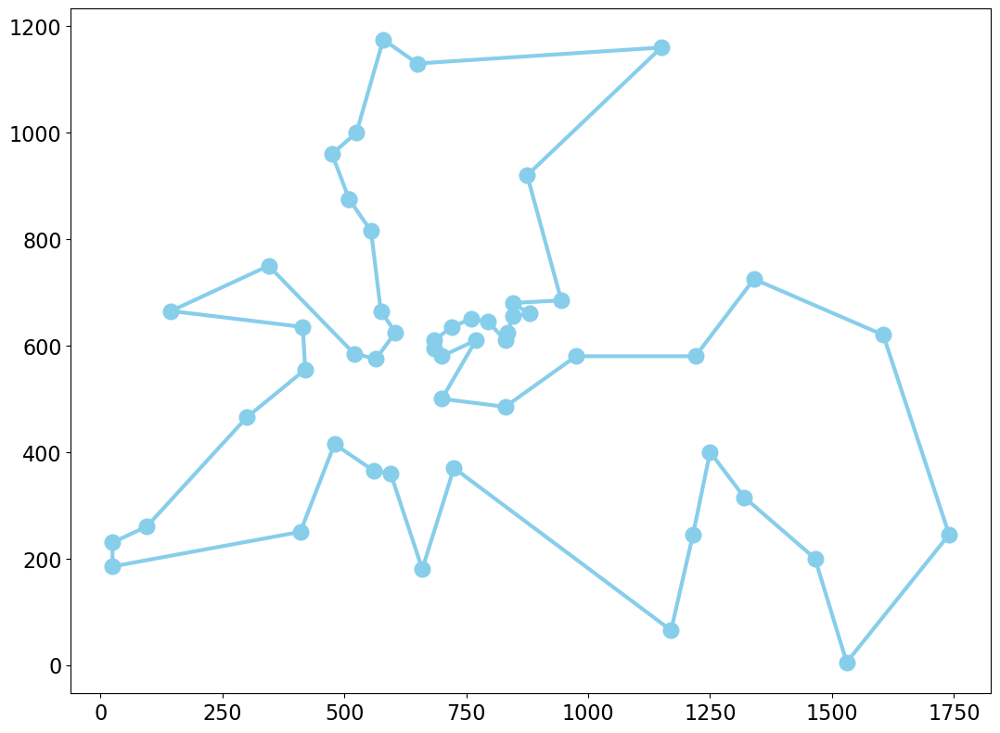

1 relative error closest neighbor:  25.444179262795014 %
2 relative error closest neighbor:  18.271015645717316 %
3 relative error closest neighbor:  8.47255369928401 %
4 relative error closest neighbor:  26.929196499602227 %
5 relative error closest neighbor:  21.14823654203129 %
6 relative error closest neighbor:  20.538318748342615 %
7 relative error closest neighbor:  26.014319809069214 %
8 relative error closest neighbor:  31.22513922036595 %
9 relative error closest neighbor:  35.26915937417131 %
10 relative error closest neighbor:  26.014319809069214 %
relative error closest-neighbor tour:  8.47255369928401 %


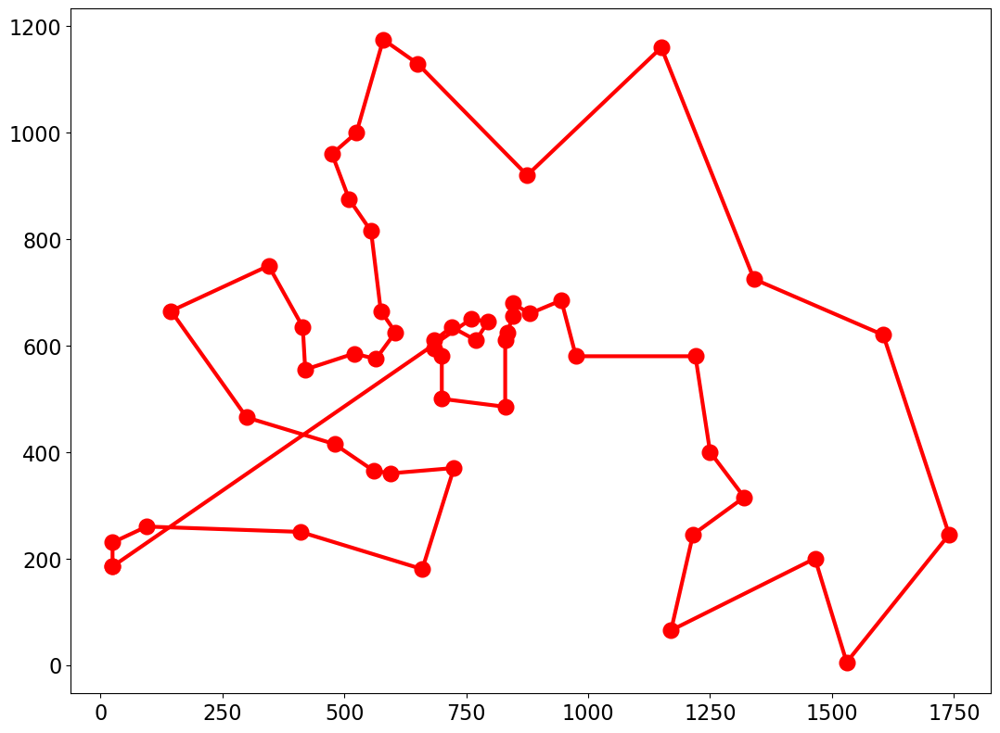

relative error pair-center tour:  7.265977194378149 %


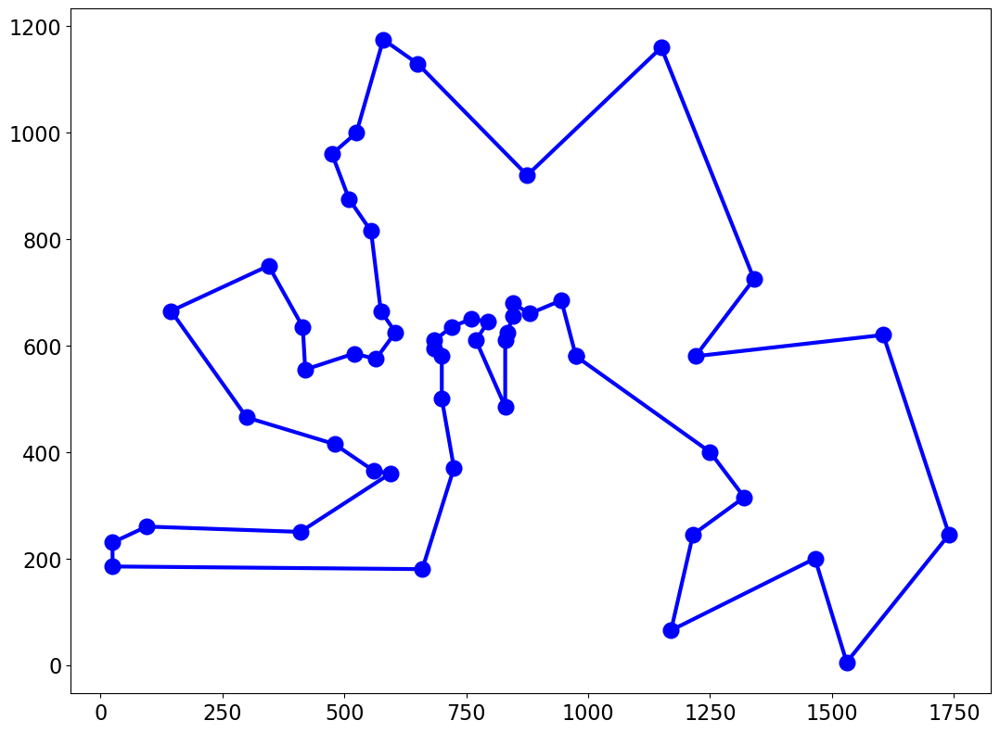

Minimum of objective function: 7789.874824218128
Mean of objective function: 8139.78710953102
Variance of objective function: 34800.47650739854
relative error genetic algorithm:  3.2617342879872715 %


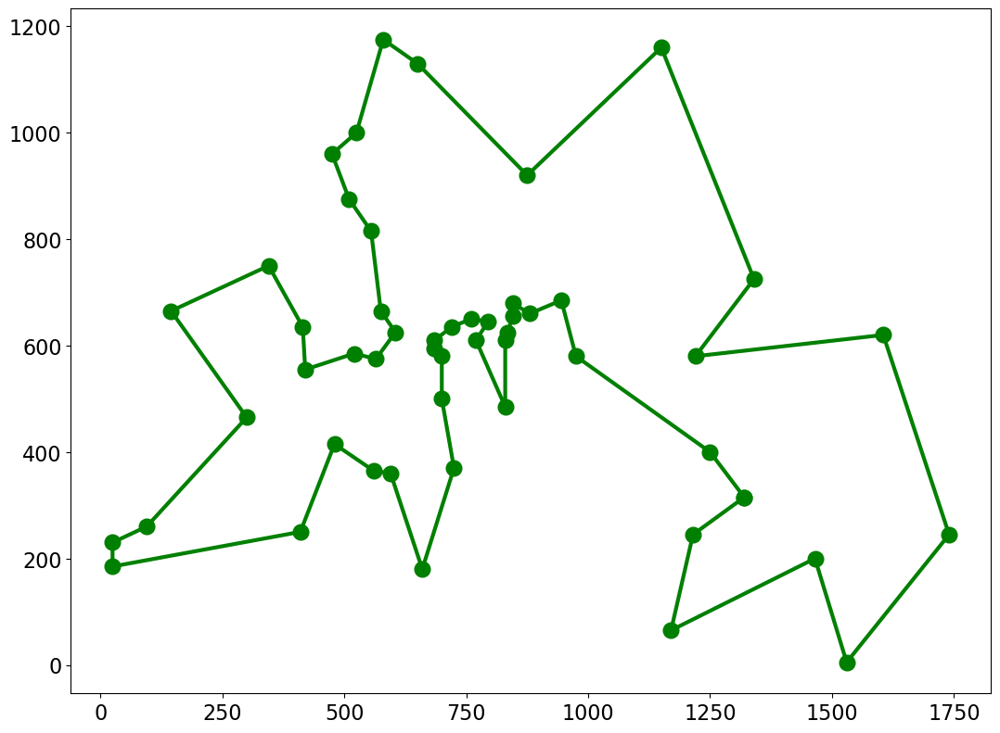

reading tour block40
reading optimal tour bestTour.opt.tour
reading done 400.0
1 relative error quick tour:  4.0 %
2 relative error quick tour:  11.0 %
3 relative error quick tour:  7.0 %
4 relative error quick tour:  4.0 %
5 relative error quick tour:  2.0 %
6 relative error quick tour:  6.0 %
7 relative error quick tour:  8.0 %
8 relative error quick tour:  2.0 %
9 relative error quick tour:  6.0 %
10 relative error quick tour:  6.0 %
relative error quick tour  2.0 %


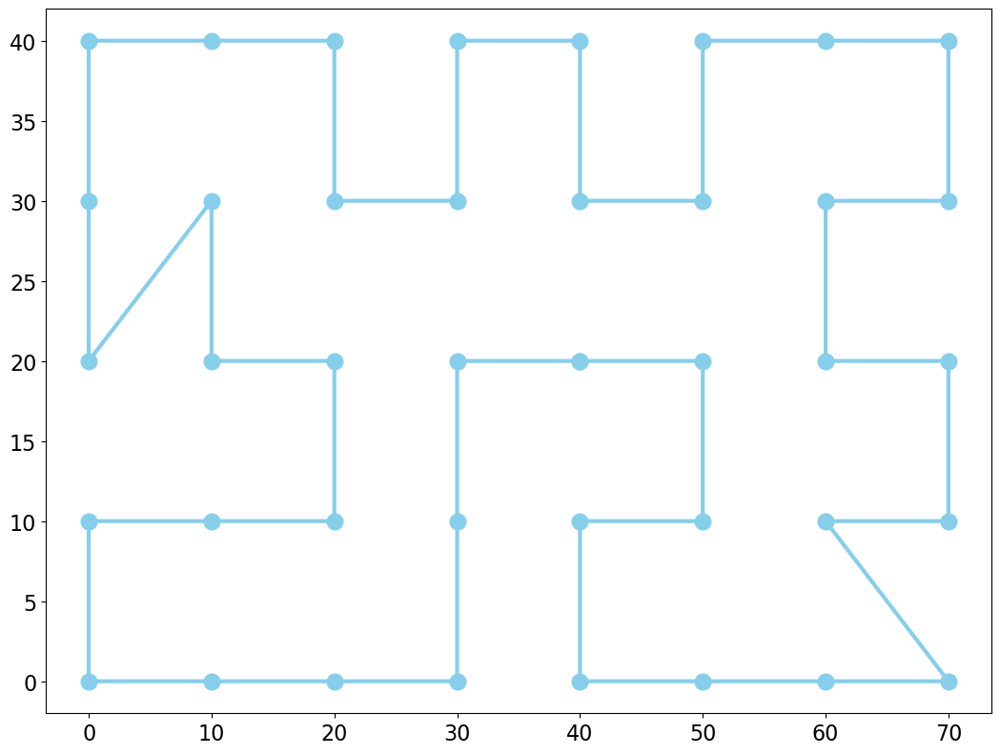

1 relative error closest neighbor:  25.25 %
2 relative error closest neighbor:  18.5 %
3 relative error closest neighbor:  27.25 %
4 relative error closest neighbor:  31.0 %
5 relative error closest neighbor:  22.0 %
6 relative error closest neighbor:  24.5 %
7 relative error closest neighbor:  29.5 %
8 relative error closest neighbor:  22.75 %
9 relative error closest neighbor:  19.25 %
10 relative error closest neighbor:  36.0 %
relative error closest-neighbor tour:  18.5 %


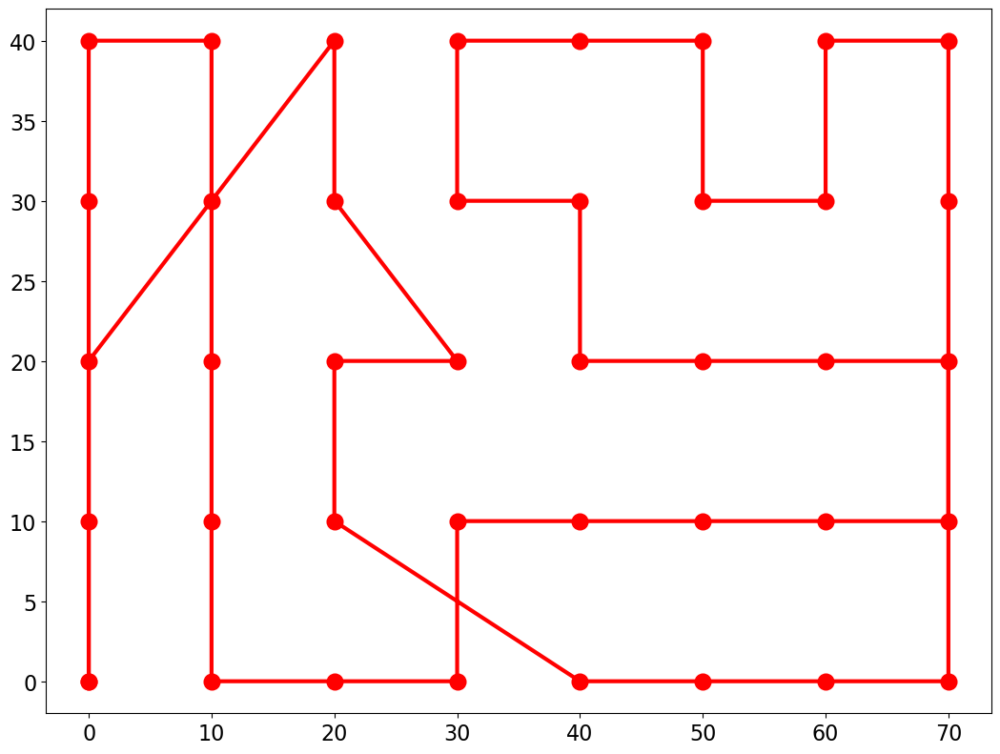

relative error pair-center tour:  6.0 %


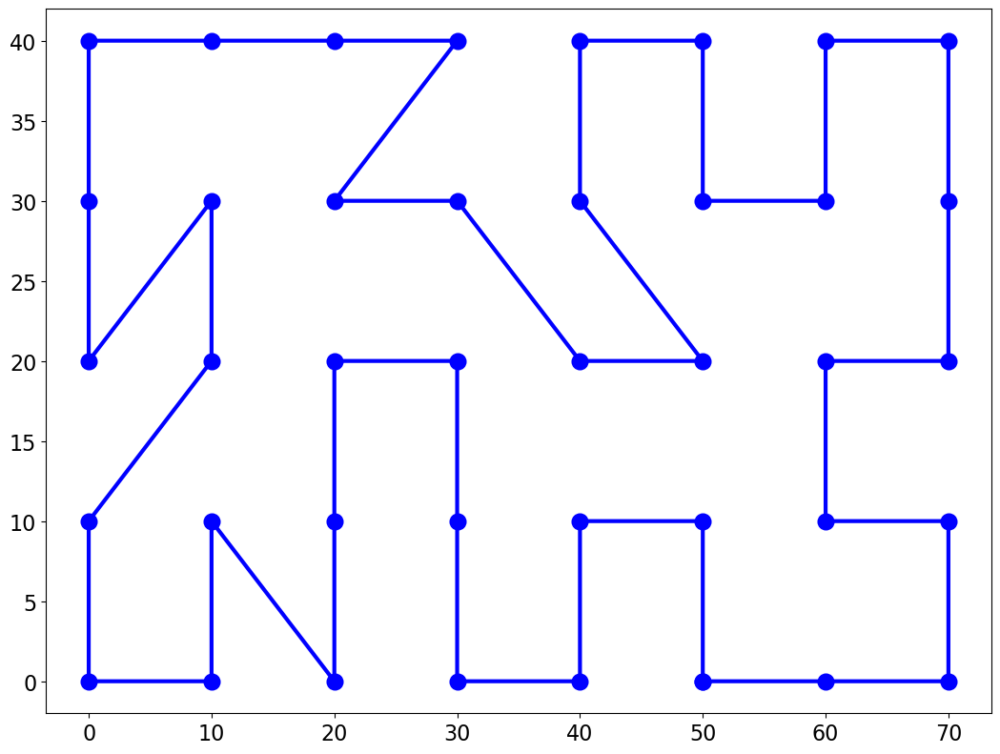

Minimum of objective function: 400.0
Mean of objective function: 410.7695526217005
Variance of objective function: 28.13795154162483
relative error genetic algorithm:  0.0 %


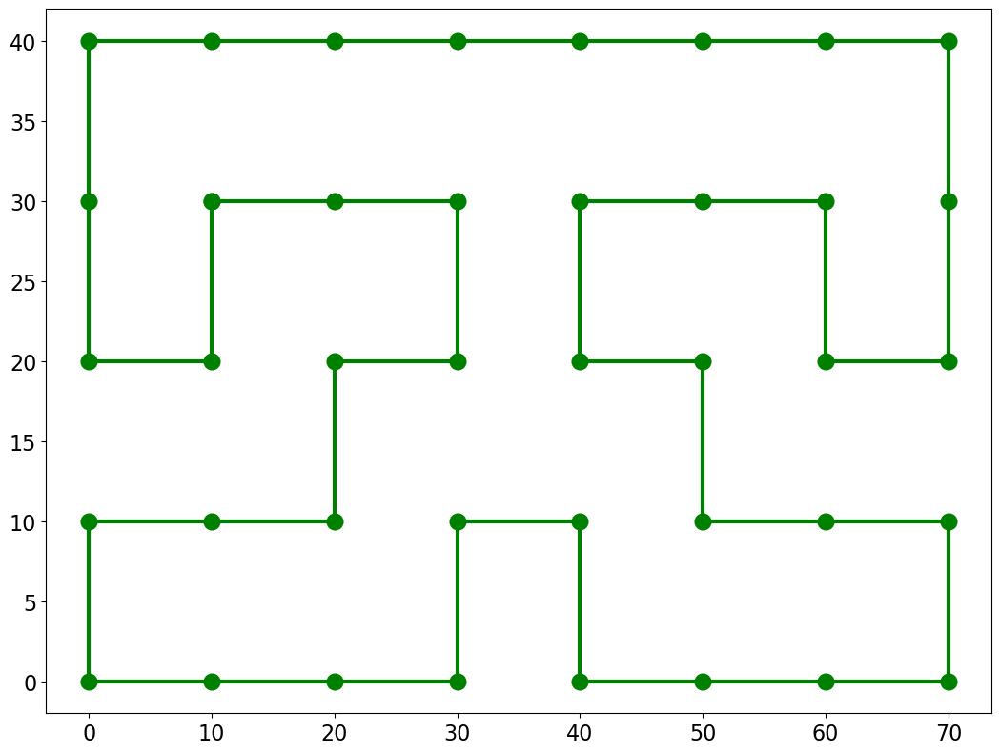

reading tour dj38
reading optimal tour dj38.pc.opt.tour
reading done 6656.0
1 relative error quick tour:  6.580528846153846 %
2 relative error quick tour:  4.642427884615385 %
3 relative error quick tour:  11.658653846153847 %
4 relative error quick tour:  13.070913461538462 %
5 relative error quick tour:  20.98858173076923 %
6 relative error quick tour:  9.900841346153847 %
7 relative error quick tour:  3.4555288461538463 %
8 relative error quick tour:  7.8876201923076925 %
9 relative error quick tour:  8.052884615384615 %
10 relative error quick tour:  7.451923076923077 %
relative error quick tour  3.4555288461538463 %


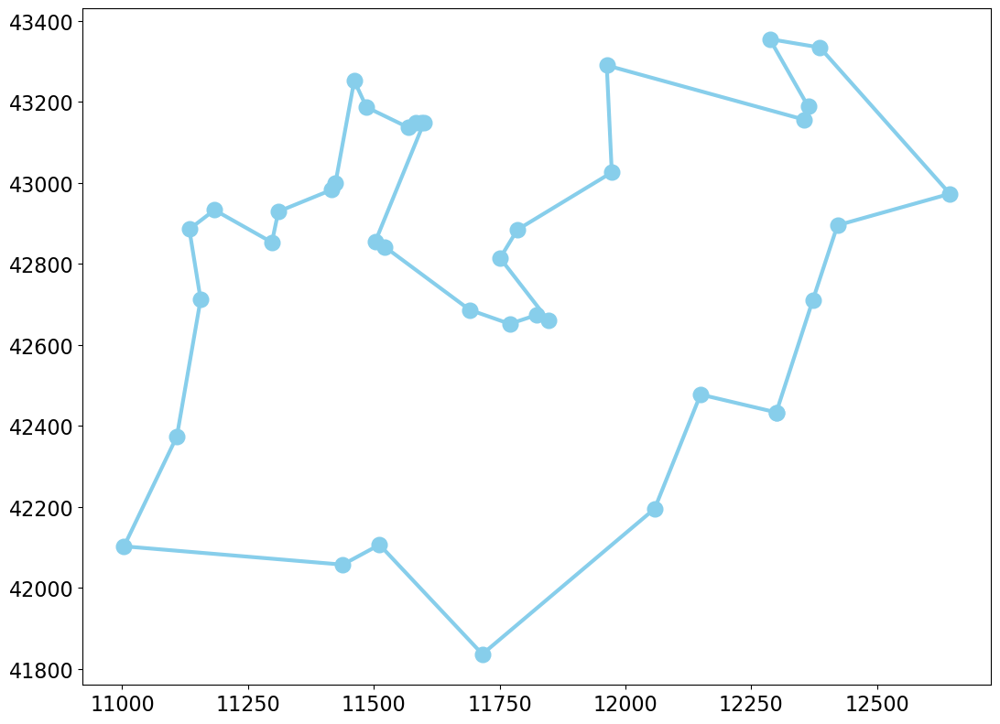

1 relative error closest neighbor:  2.5390625 %
2 relative error closest neighbor:  22.611177884615383 %
3 relative error closest neighbor:  35.77223557692308 %
4 relative error closest neighbor:  5.228365384615385 %
5 relative error closest neighbor:  34.85576923076923 %
6 relative error closest neighbor:  13.115985576923077 %
7 relative error closest neighbor:  19.996995192307693 %
8 relative error closest neighbor:  19.42608173076923 %
9 relative error closest neighbor:  13.115985576923077 %
10 relative error closest neighbor:  14.272836538461538 %
relative error closest-neighbor tour:  2.5390625 %


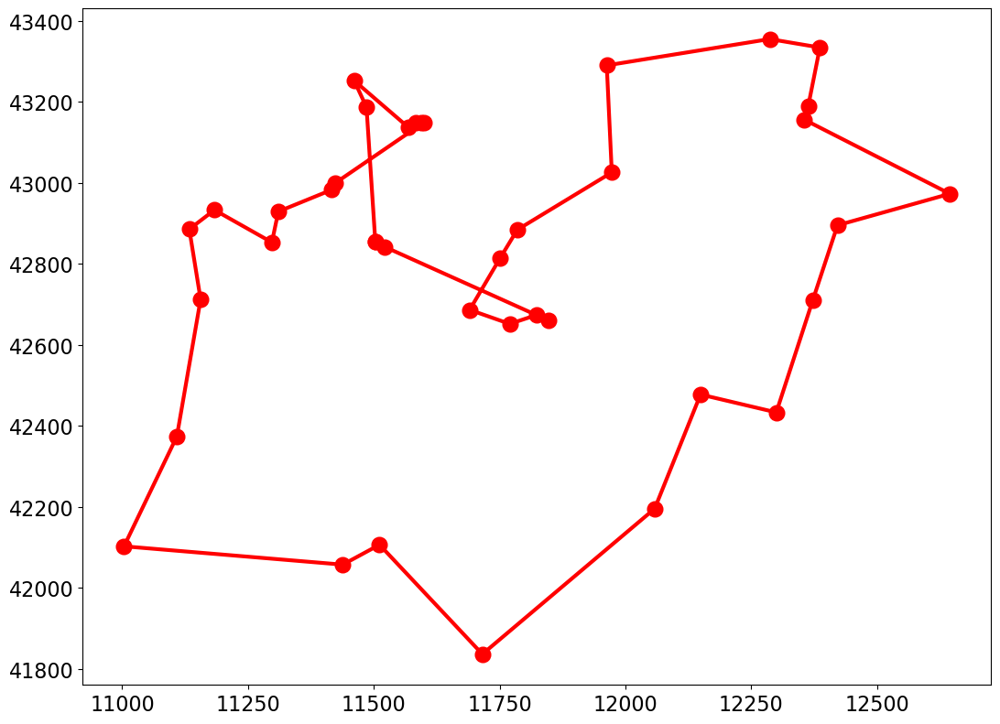

relative error pair-center tour:  3.2001201923076925 %


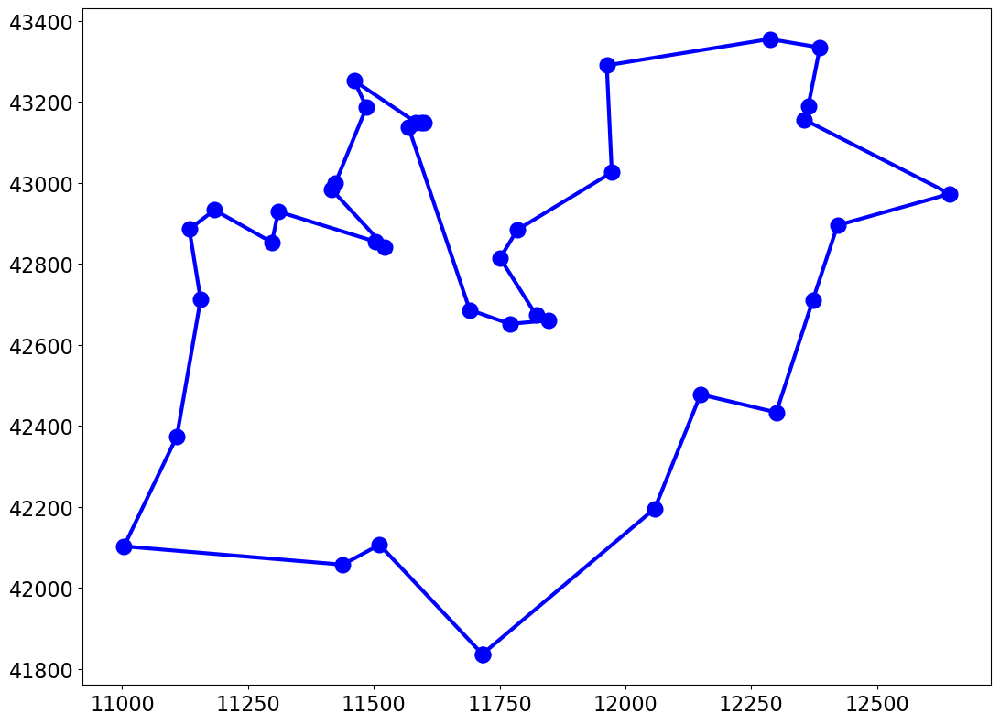

Minimum of objective function: 6659.431532931464
Mean of objective function: 6807.742745009474
Variance of objective function: 38123.50073485893
relative error genetic algorithm:  0.0 %


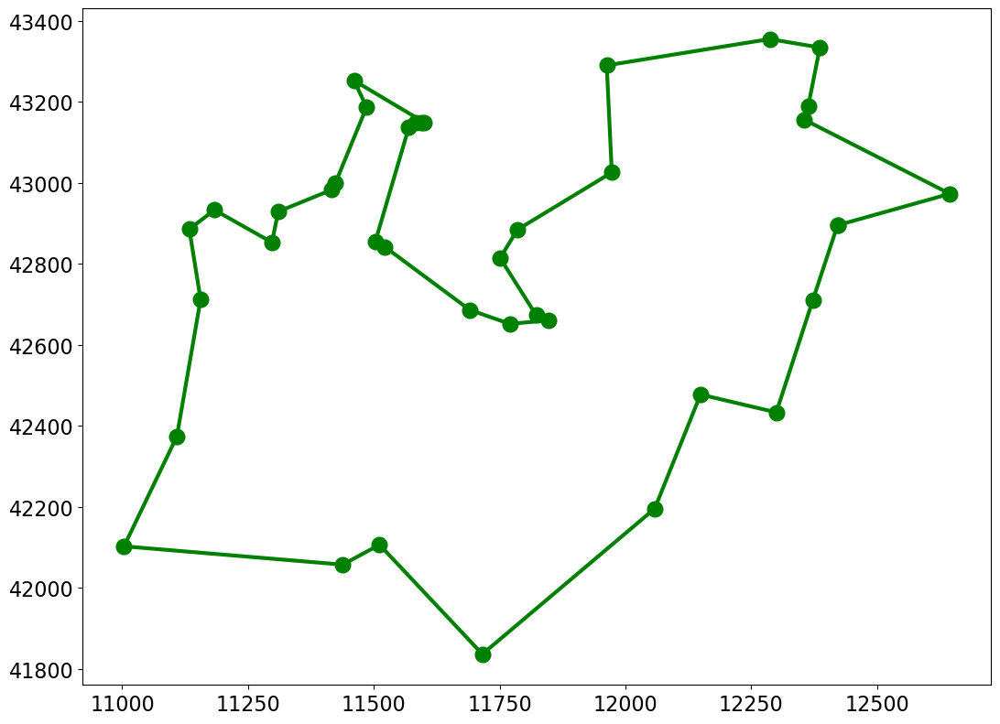

reading tour eil51
reading optimal tour eil51.opt.tour
reading done 426.0
1 relative error quick tour:  5.39906103286385 %
2 relative error quick tour:  8.685446009389672 %
3 relative error quick tour:  4.929577464788732 %
4 relative error quick tour:  11.267605633802816 %
5 relative error quick tour:  6.103286384976526 %
6 relative error quick tour:  5.868544600938967 %
7 relative error quick tour:  4.460093896713615 %
8 relative error quick tour:  9.389671361502348 %
9 relative error quick tour:  7.981220657276995 %
10 relative error quick tour:  4.225352112676056 %
relative error quick tour  4.225352112676056 %


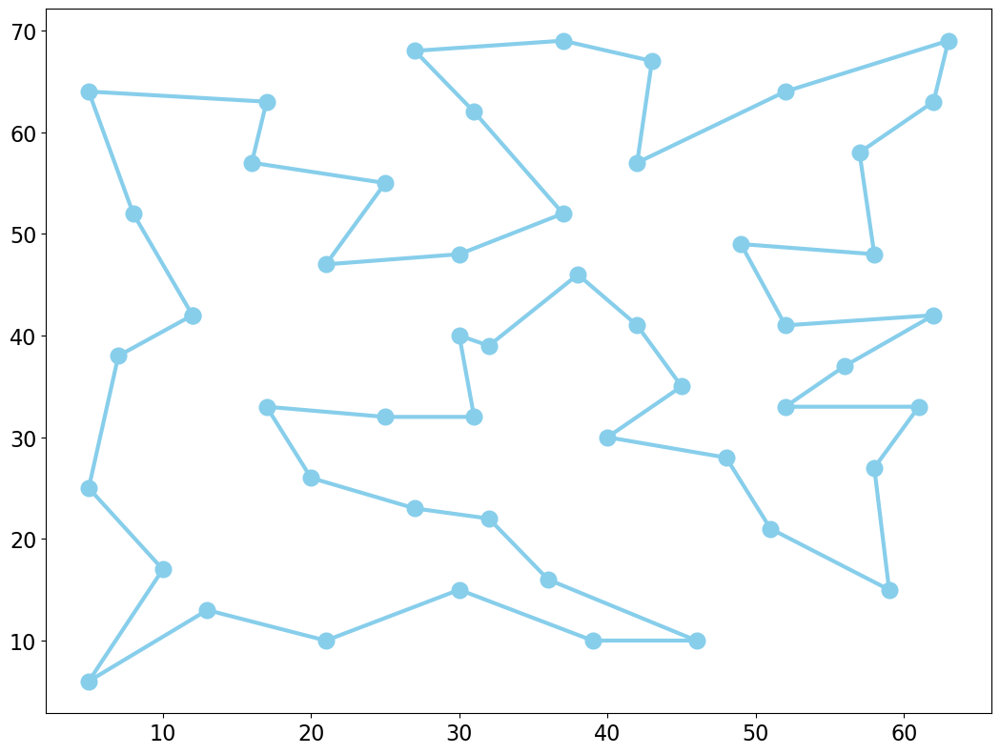

1 relative error closest neighbor:  31.690140845070424 %
2 relative error closest neighbor:  25.35211267605634 %
3 relative error closest neighbor:  37.32394366197183 %
4 relative error closest neighbor:  32.159624413145536 %
5 relative error closest neighbor:  22.300469483568076 %
6 relative error closest neighbor:  38.967136150234744 %
7 relative error closest neighbor:  35.68075117370892 %
8 relative error closest neighbor:  28.63849765258216 %
9 relative error closest neighbor:  22.300469483568076 %
10 relative error closest neighbor:  21.5962441314554 %
relative error closest-neighbor tour:  21.5962441314554 %


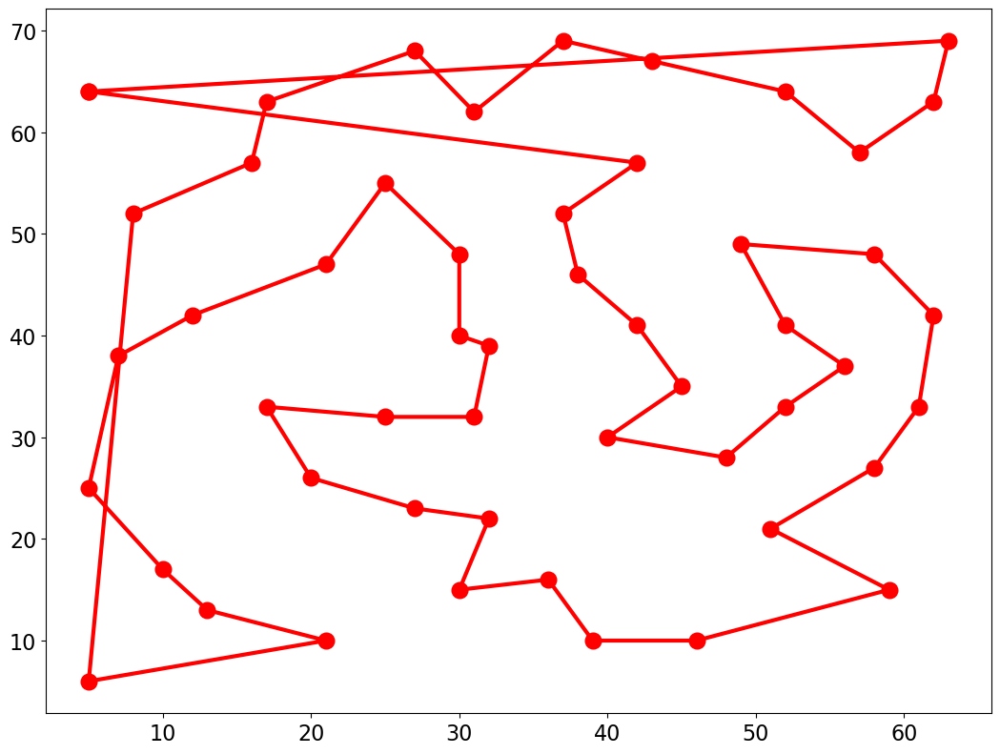

relative error pair-center tour:  20.422535211267604 %


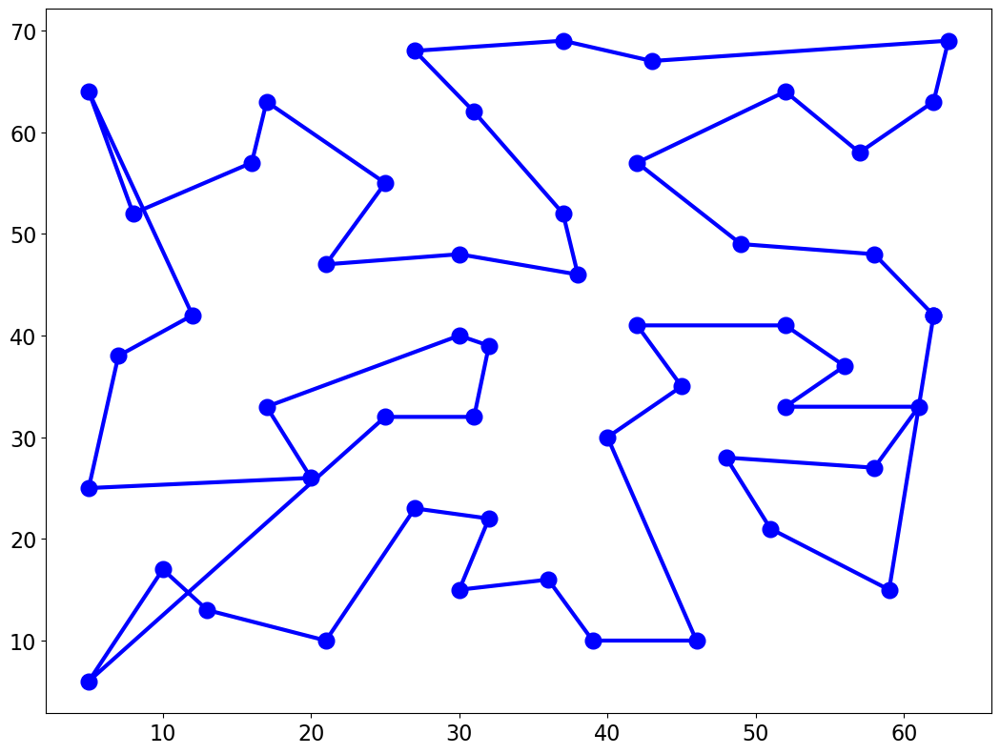

Minimum of objective function: 437.5581870769916
Mean of objective function: 452.17798464901927
Variance of objective function: 98.66256308309697
relative error genetic algorithm:  2.112676056338028 %


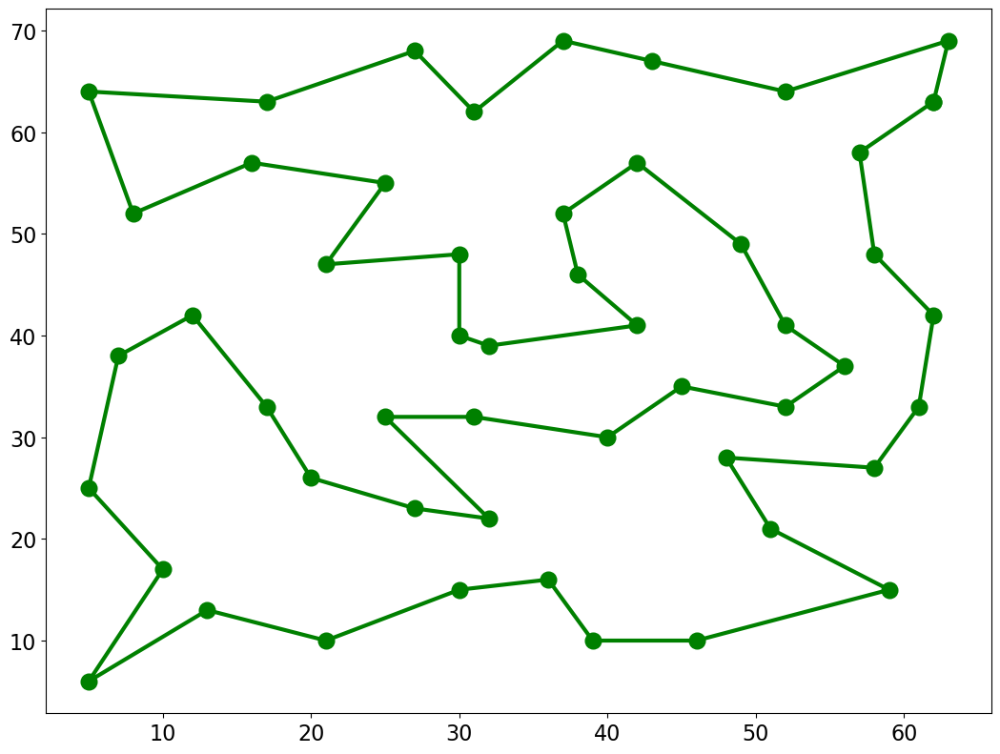

reading tour eil76
reading optimal tour eil76.opt.tour
reading done 538.0
1 relative error quick tour:  6.691449814126394 %
2 relative error quick tour:  10.408921933085502 %
3 relative error quick tour:  7.992565055762082 %
4 relative error quick tour:  5.762081784386617 %
5 relative error quick tour:  12.453531598513012 %
6 relative error quick tour:  9.107806691449815 %
7 relative error quick tour:  11.71003717472119 %
8 relative error quick tour:  9.293680297397769 %
9 relative error quick tour:  10.780669144981413 %
10 relative error quick tour:  7.992565055762082 %
relative error quick tour  5.762081784386617 %


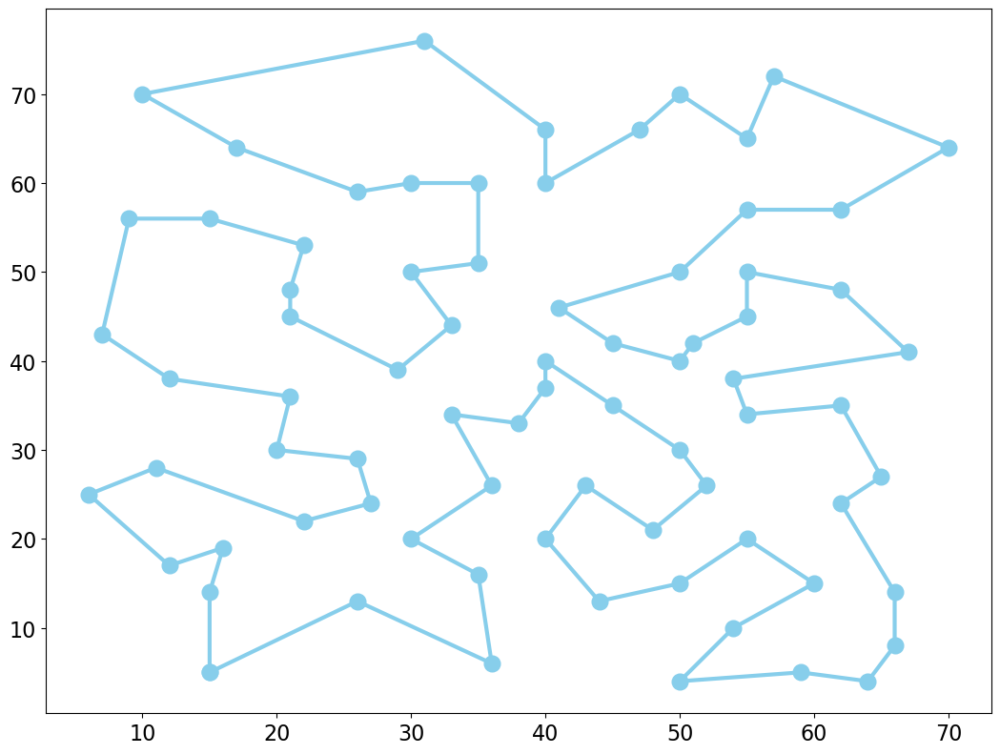

1 relative error closest neighbor:  31.04089219330855 %
2 relative error closest neighbor:  29.36802973977695 %
3 relative error closest neighbor:  17.100371747211895 %
4 relative error closest neighbor:  18.401486988847584 %
5 relative error closest neighbor:  32.899628252788105 %
6 relative error closest neighbor:  21.933085501858734 %
7 relative error closest neighbor:  28.810408921933085 %
8 relative error closest neighbor:  29.36802973977695 %
9 relative error closest neighbor:  25.092936802973977 %
10 relative error closest neighbor:  27.881040892193308 %
relative error closest-neighbor tour:  17.100371747211895 %


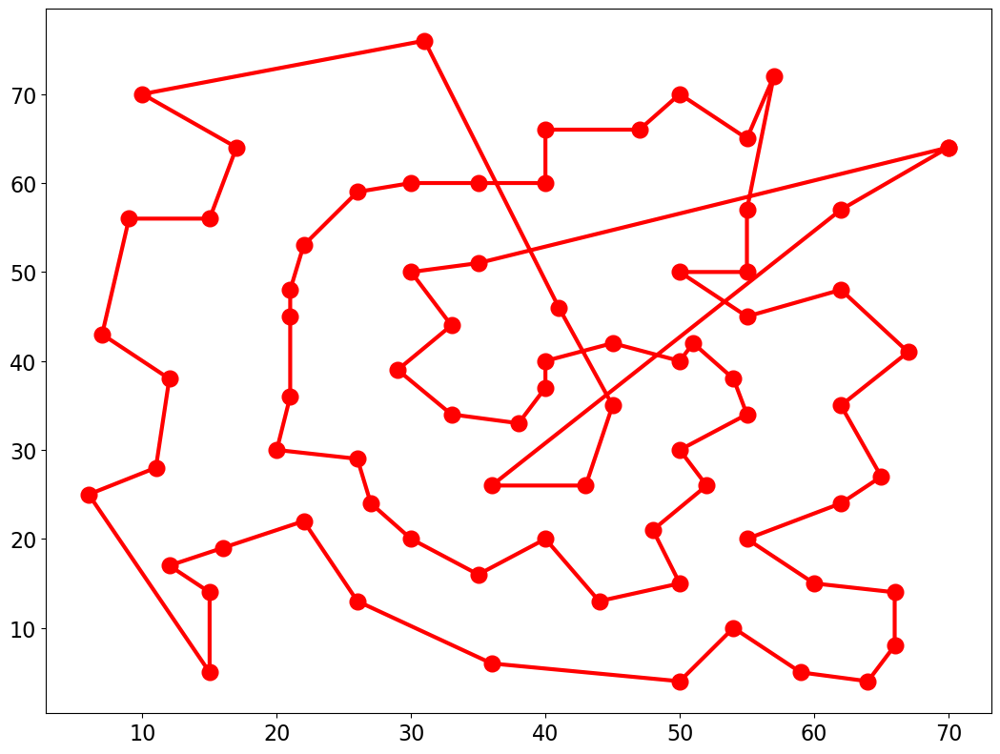

relative error pair-center tour:  10.037174721189592 %


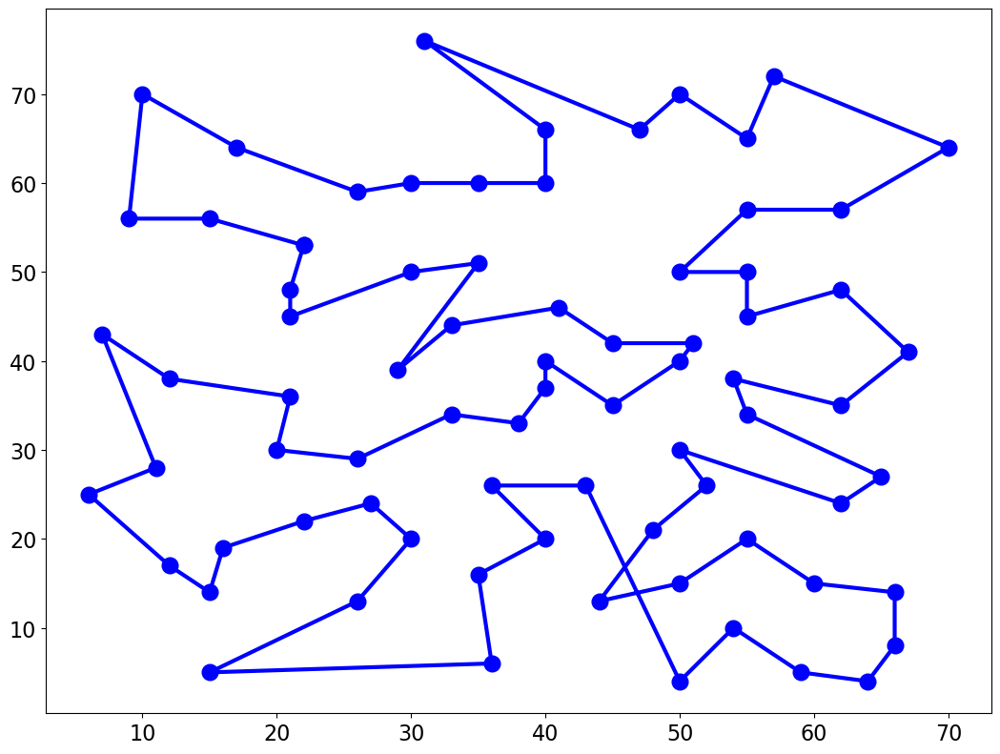

Minimum of objective function: 595.1459610665343
Mean of objective function: 676.8084124705597
Variance of objective function: 1343.1634912404645
relative error genetic algorithm:  9.851301115241636 %


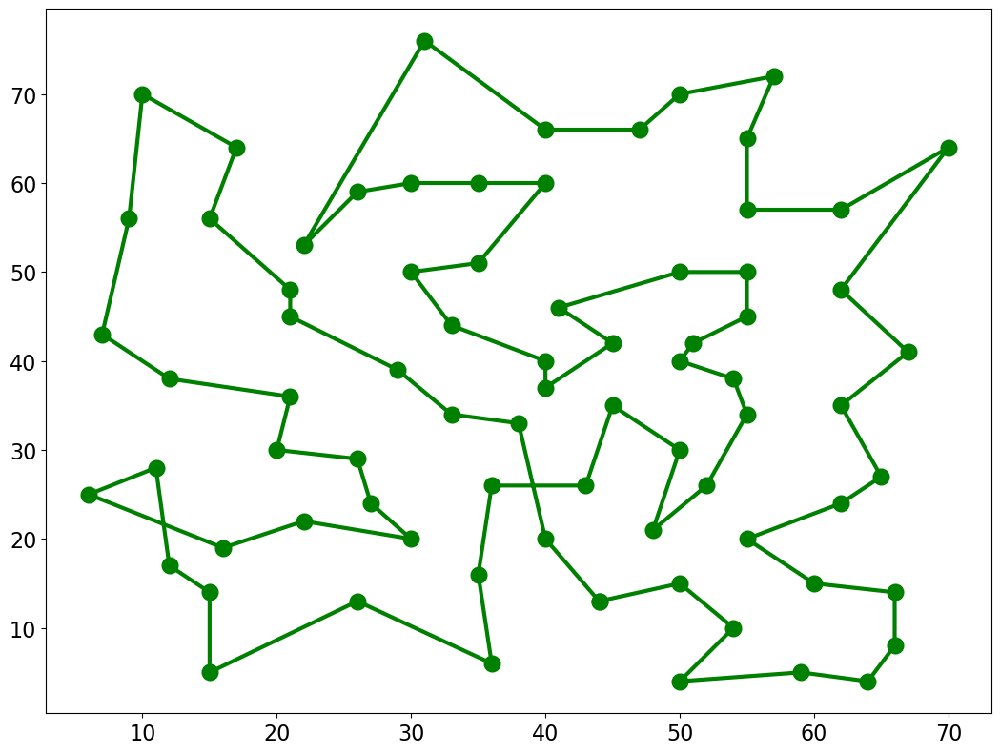

reading tour kroA100
reading optimal tour kroA100.opt.tour
reading done 21282.0
1 relative error quick tour:  11.314726059580867 %
2 relative error quick tour:  4.867963537261535 %
3 relative error quick tour:  10.013156658208816 %
4 relative error quick tour:  8.401466027628983 %
5 relative error quick tour:  5.840616483413213 %
6 relative error quick tour:  6.023869937035993 %
7 relative error quick tour:  7.3066441123954515 %
8 relative error quick tour:  3.124706324593553 %
9 relative error quick tour:  15.943050465181845 %
10 relative error quick tour:  7.837609247251198 %
relative error quick tour  3.124706324593553 %


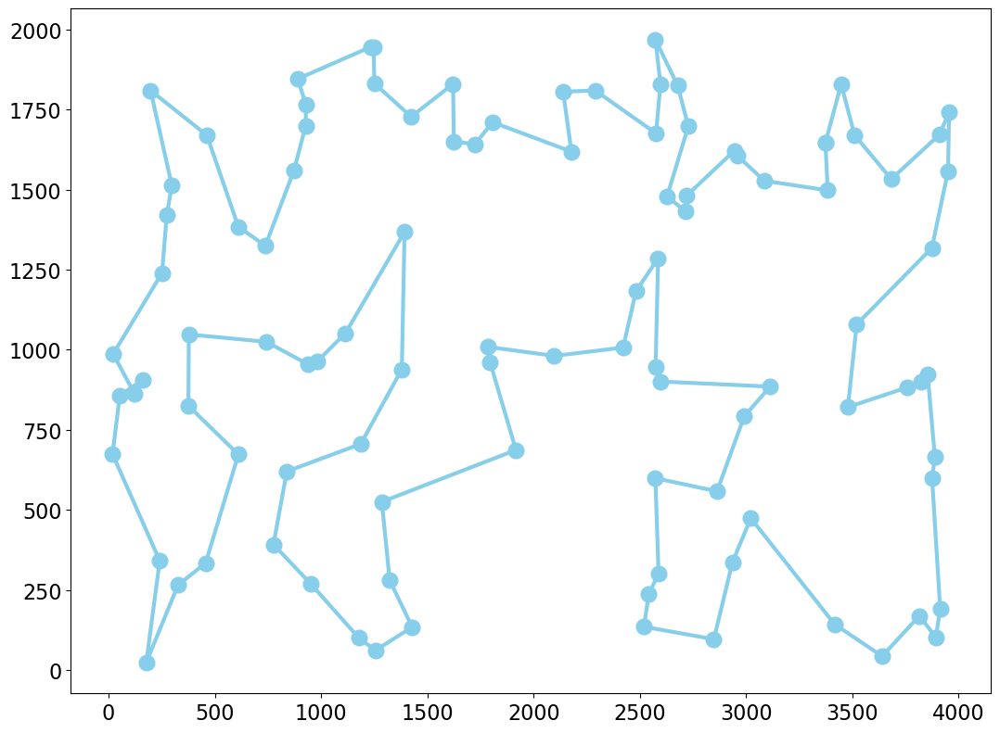

1 relative error closest neighbor:  33.934780565736304 %
2 relative error closest neighbor:  23.141622028004885 %
3 relative error closest neighbor:  24.41499859035805 %
4 relative error closest neighbor:  23.620900291326002 %
5 relative error closest neighbor:  27.873320176675126 %
6 relative error closest neighbor:  23.141622028004885 %
7 relative error closest neighbor:  25.918616671365474 %
8 relative error closest neighbor:  21.041255521097643 %
9 relative error closest neighbor:  33.20646555774833 %
10 relative error closest neighbor:  26.454280612724368 %
relative error closest-neighbor tour:  21.041255521097643 %


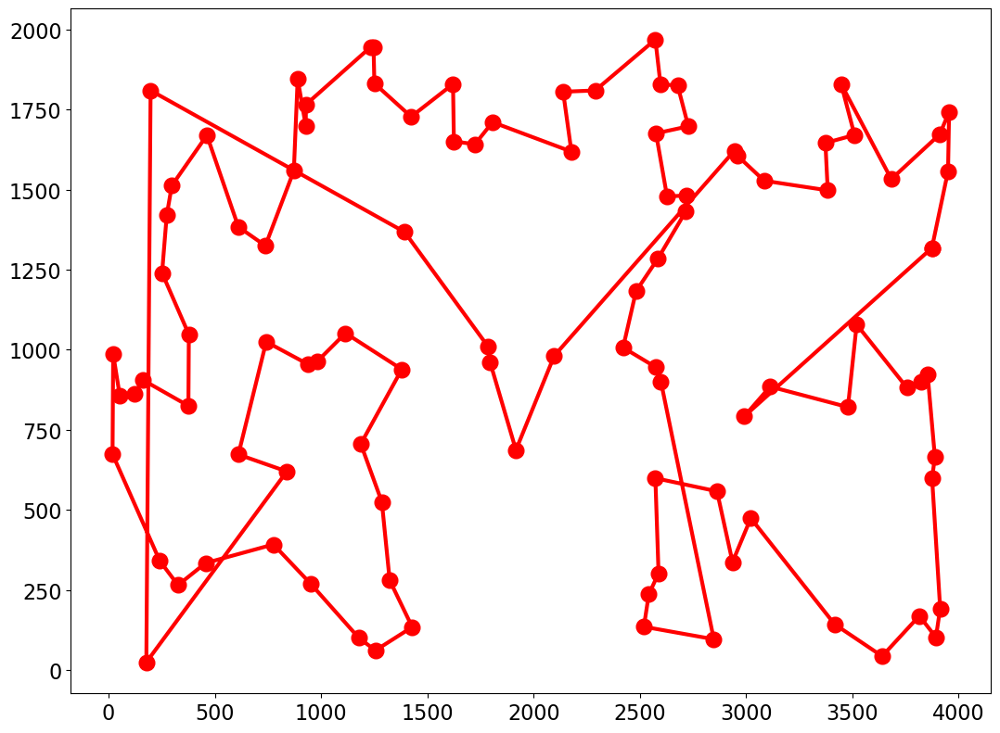

relative error pair-center tour:  12.738464430034771 %


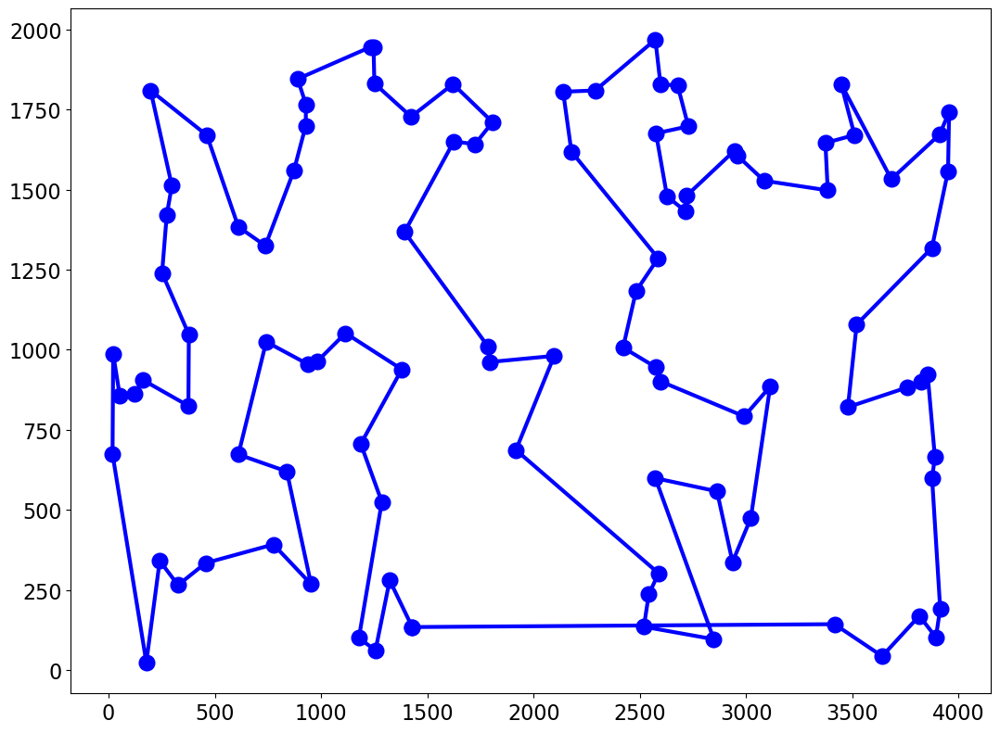

Minimum of objective function: 33043.03406333335
Mean of objective function: 37439.174662282094
Variance of objective function: 8738869.415586075
relative error genetic algorithm:  55.234470444507096 %


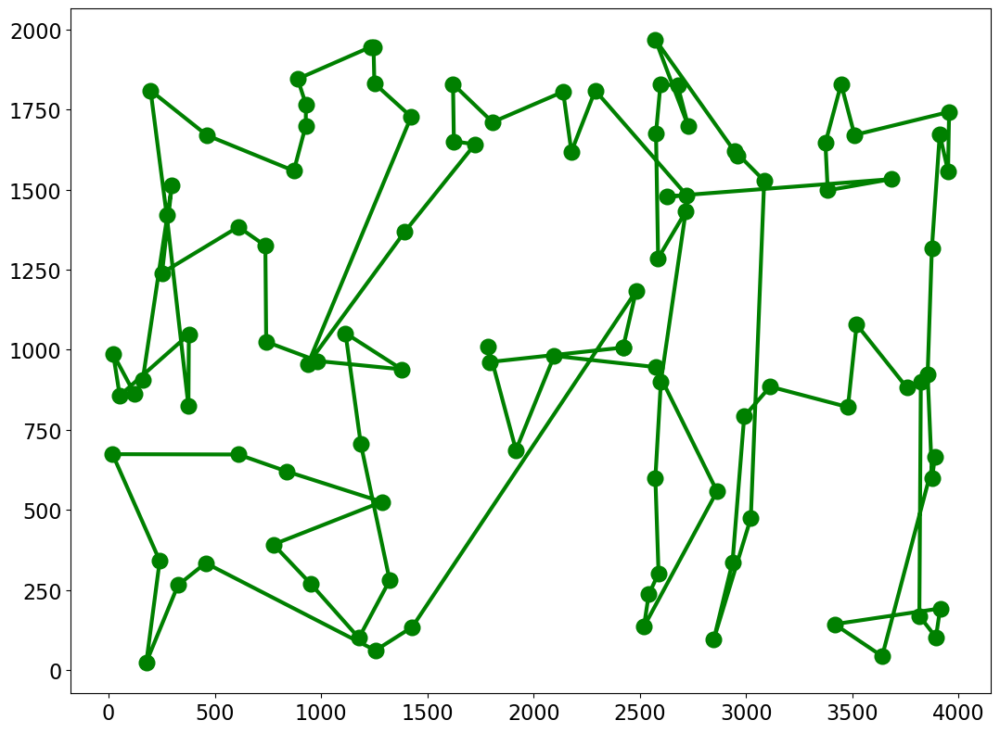

reading tour kroB100
reading optimal tour kroB100.pc.opt.tour
reading done 22141.0
strange best tour given 165563.0
1 relative error quick tour:  7.50191951583036 %
2 relative error quick tour:  7.0412357165439685 %
3 relative error quick tour:  6.716047152341809 %
4 relative error quick tour:  9.249808048416964 %
5 relative error quick tour:  7.6012826882254645 %
6 relative error quick tour:  5.659184318684793 %
7 relative error quick tour:  7.985185854297457 %
8 relative error quick tour:  8.500067747617543 %
9 relative error quick tour:  8.680728061063187 %
10 relative error quick tour:  10.34280294476311 %
relative error quick tour  5.659184318684793 %


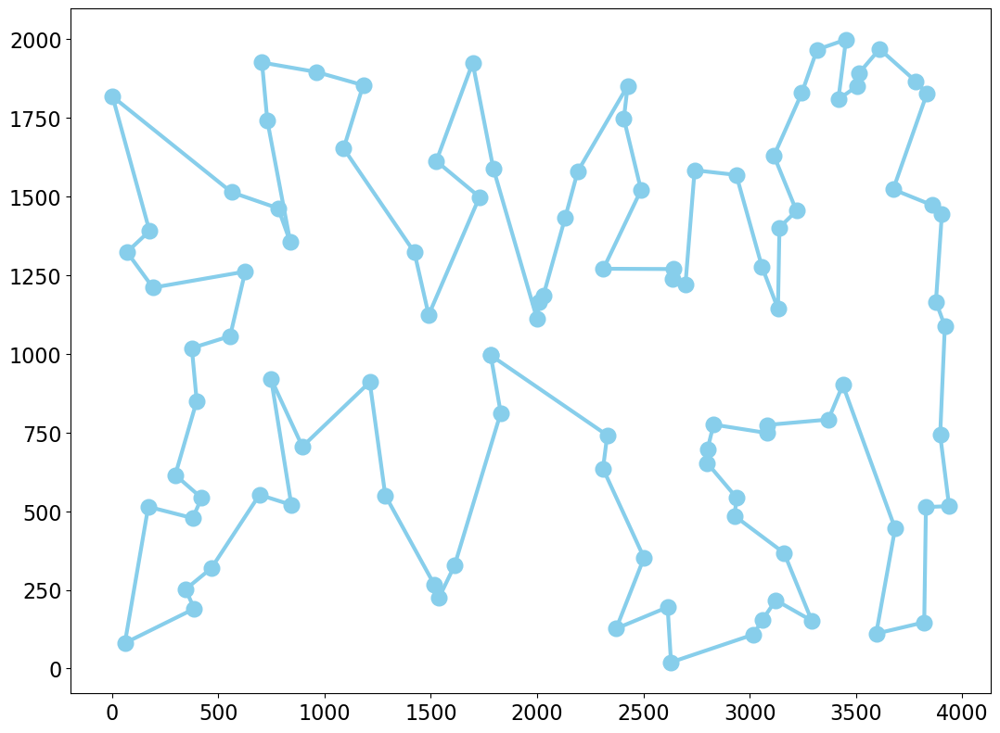

1 relative error closest neighbor:  33.52152115983921 %
2 relative error closest neighbor:  18.96029989612032 %
3 relative error closest neighbor:  24.172349939027143 %
4 relative error closest neighbor:  20.450747482046882 %
5 relative error closest neighbor:  23.671017569215483 %
6 relative error closest neighbor:  31.805248182105597 %
7 relative error closest neighbor:  32.11237071496319 %
8 relative error closest neighbor:  20.635924303328665 %
9 relative error closest neighbor:  26.13251433991238 %
10 relative error closest neighbor:  35.91075380515785 %
relative error closest-neighbor tour:  18.96029989612032 %


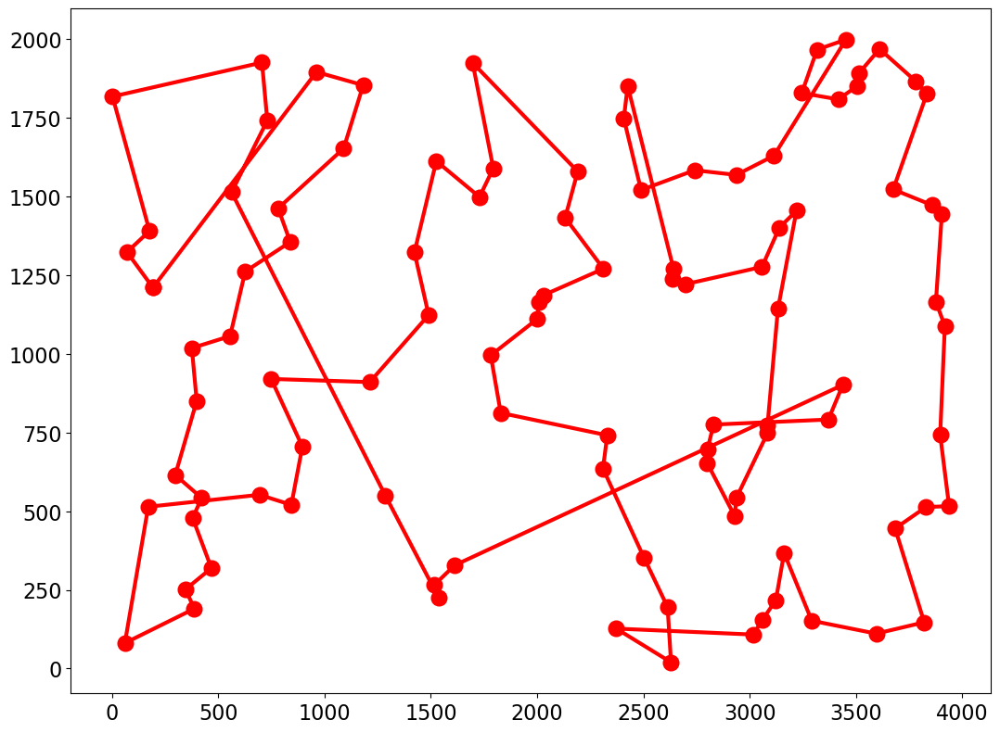

relative error pair-center tour:  12.090691477349713 %


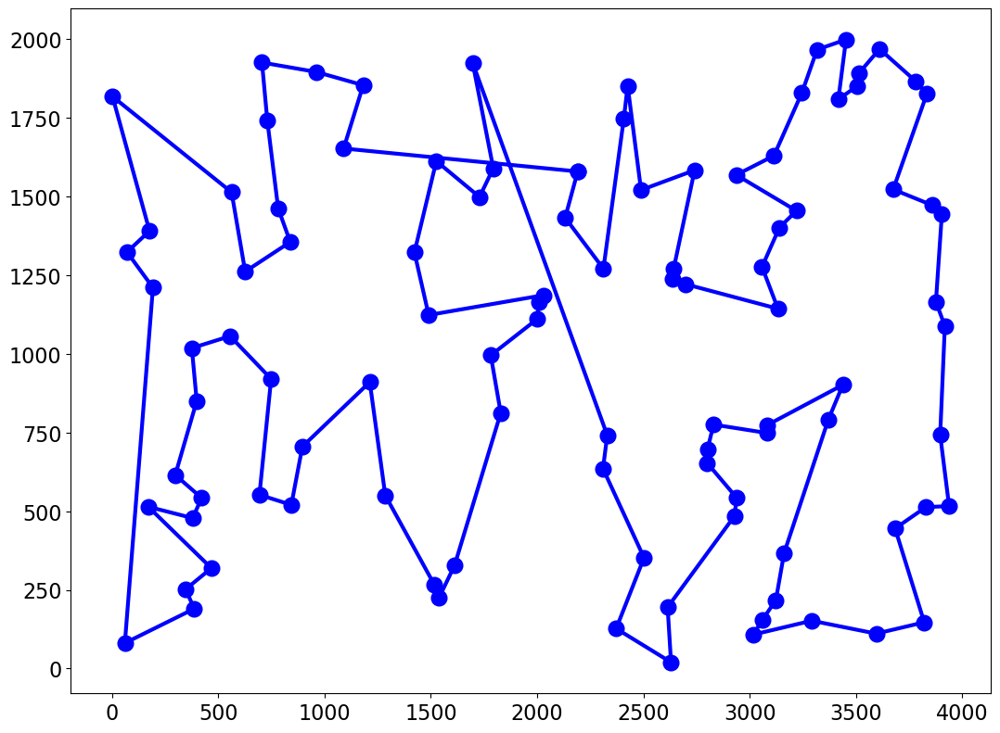

Minimum of objective function: 35327.2483113989
Mean of objective function: 40084.17016633393
Variance of objective function: 7751207.785955429
relative error genetic algorithm:  59.56822185086491 %


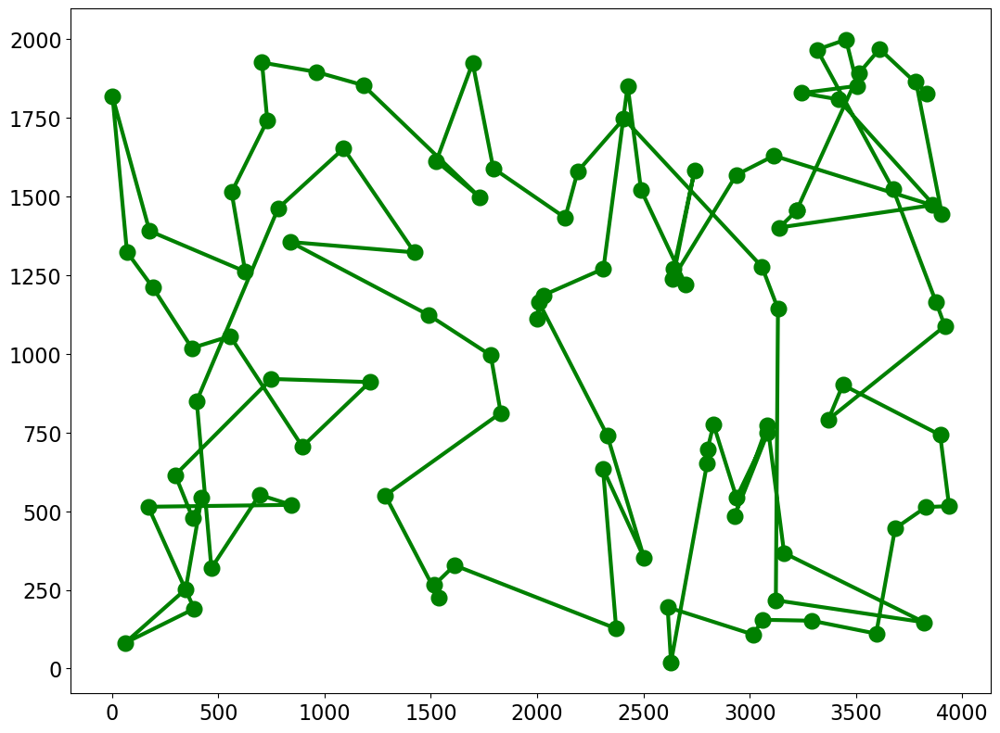

reading tour kroC100
reading optimal tour kroC100.opt.tour
reading done 20749.0
1 relative error quick tour:  9.50889199479493 %
2 relative error quick tour:  7.205166514048869 %
3 relative error quick tour:  5.344835895705817 %
4 relative error quick tour:  5.132777483252205 %
5 relative error quick tour:  13.446431153308593 %
6 relative error quick tour:  3.243529808665478 %
7 relative error quick tour:  8.554629138753675 %
8 relative error quick tour:  7.470239529615885 %
9 relative error quick tour:  7.7015759795652805 %
10 relative error quick tour:  10.583642585184828 %
relative error quick tour  3.243529808665478 %


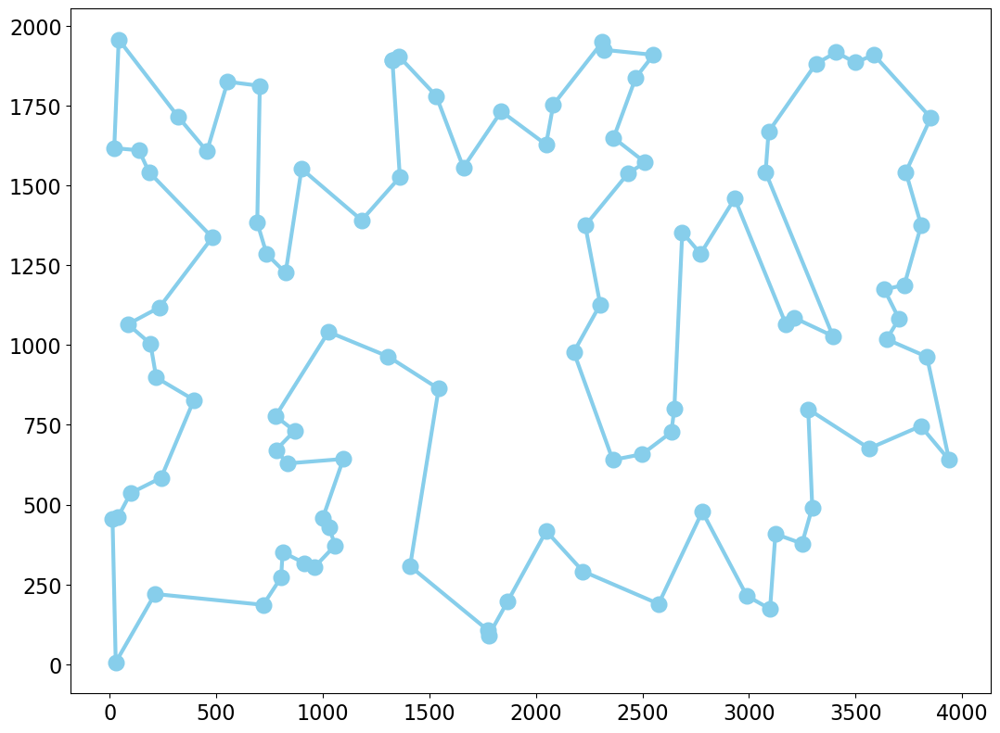

1 relative error closest neighbor:  26.892862306617186 %
2 relative error closest neighbor:  17.861101739842884 %
3 relative error closest neighbor:  27.625427731456938 %
4 relative error closest neighbor:  21.904670104583353 %
5 relative error closest neighbor:  28.247144440695937 %
6 relative error closest neighbor:  21.16246566099571 %
7 relative error closest neighbor:  39.79468890066991 %
8 relative error closest neighbor:  39.79468890066991 %
9 relative error closest neighbor:  16.95021446816714 %
10 relative error closest neighbor:  25.634970360017352 %
relative error closest-neighbor tour:  16.95021446816714 %


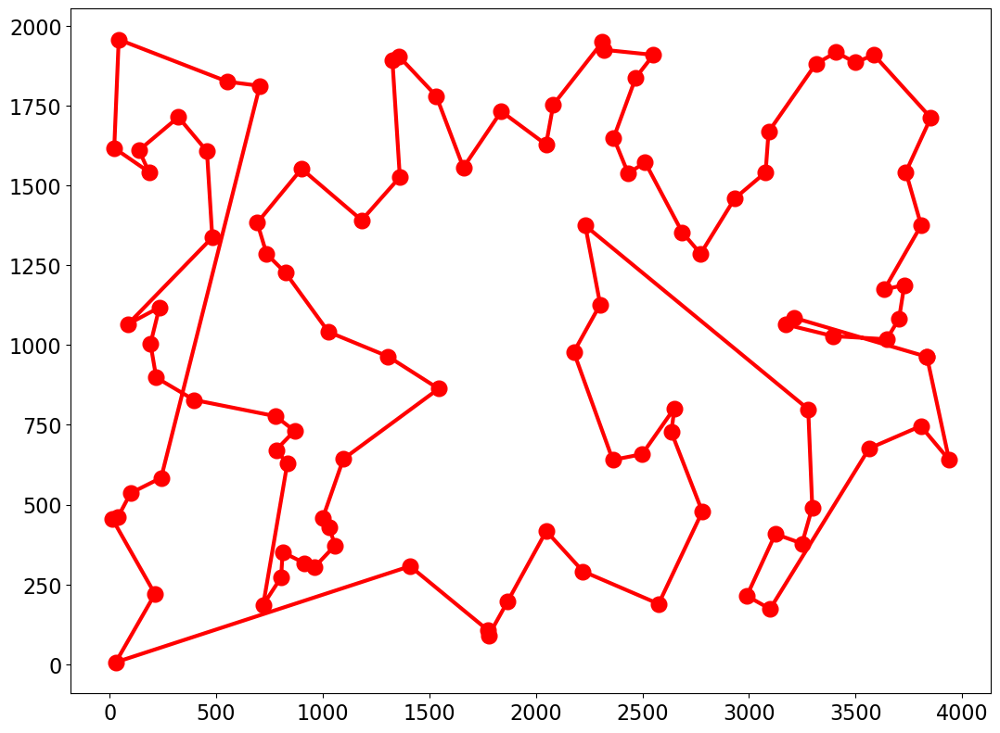

relative error pair-center tour:  3.711022217938214 %


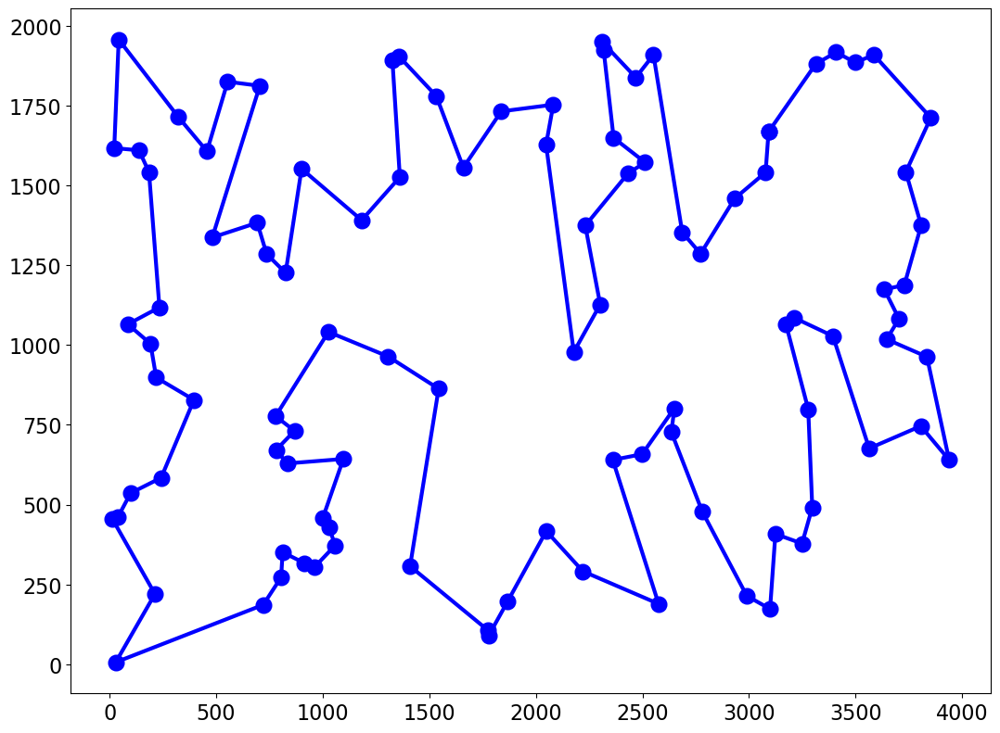

Minimum of objective function: 34124.60043504588
Mean of objective function: 37937.433415408406
Variance of objective function: 4039648.1142491987
relative error genetic algorithm:  64.45611836715022 %


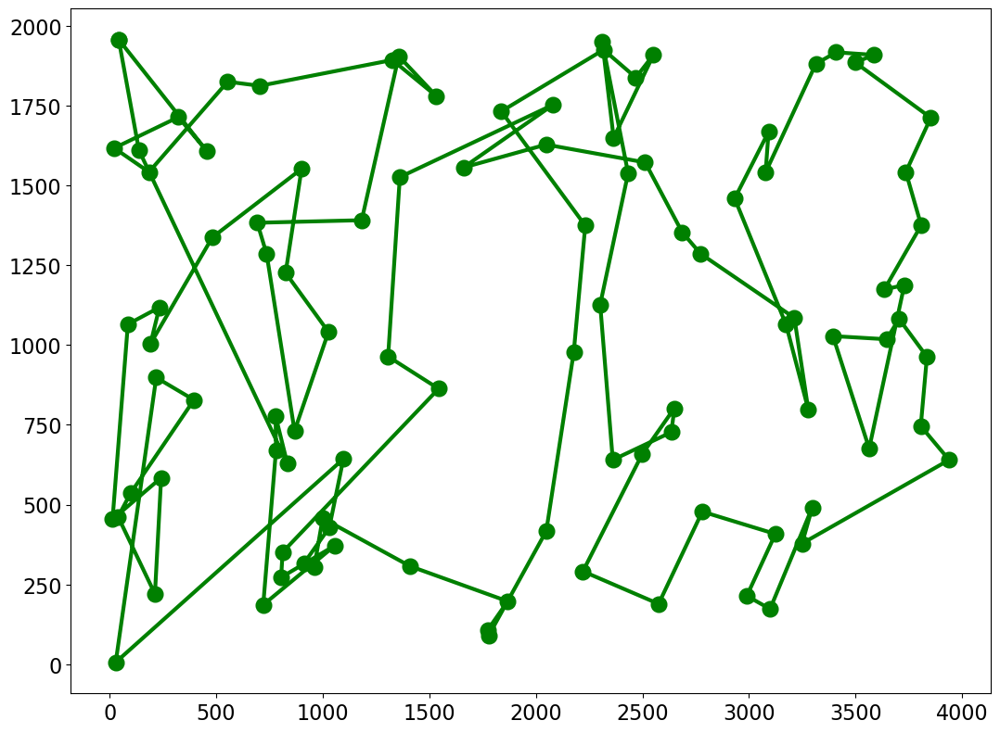

reading tour kroD100
reading optimal tour kroD100.opt.tour
reading done 21294.0
1 relative error quick tour:  3.287310979618672 %
2 relative error quick tour:  8.457781534704612 %
3 relative error quick tour:  8.608058608058608 %
4 relative error quick tour:  12.346200807739269 %
5 relative error quick tour:  7.598384521461445 %
6 relative error quick tour:  11.99398891706584 %
7 relative error quick tour:  12.402554710247017 %
8 relative error quick tour:  9.913590682821452 %
9 relative error quick tour:  6.898656898656899 %
10 relative error quick tour:  10.749506903353057 %
relative error quick tour  3.287310979618672 %


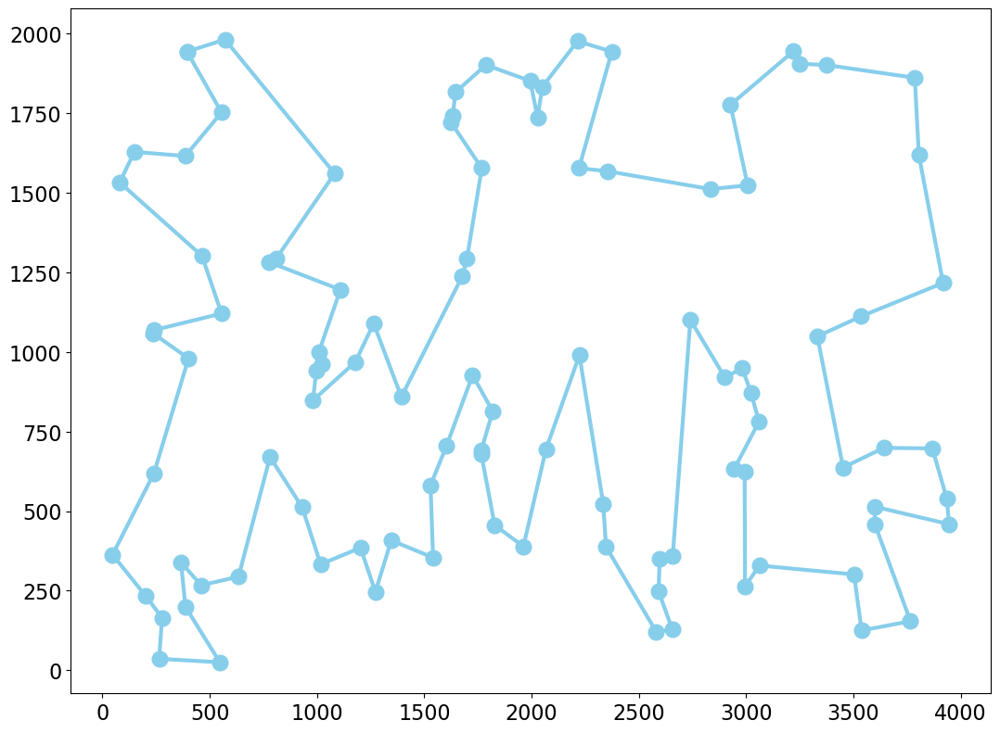

1 relative error closest neighbor:  31.088569550108012 %
2 relative error closest neighbor:  33.5493566262797 %
3 relative error closest neighbor:  27.557058326289095 %
4 relative error closest neighbor:  33.253498638114024 %
5 relative error closest neighbor:  26.547384239691933 %
6 relative error closest neighbor:  20.76171691556307 %
7 relative error closest neighbor:  31.778904855827932 %
8 relative error closest neighbor:  27.228327228327228 %
9 relative error closest neighbor:  38.5883347421809 %
10 relative error closest neighbor:  37.137221752606365 %
relative error closest-neighbor tour:  20.76171691556307 %


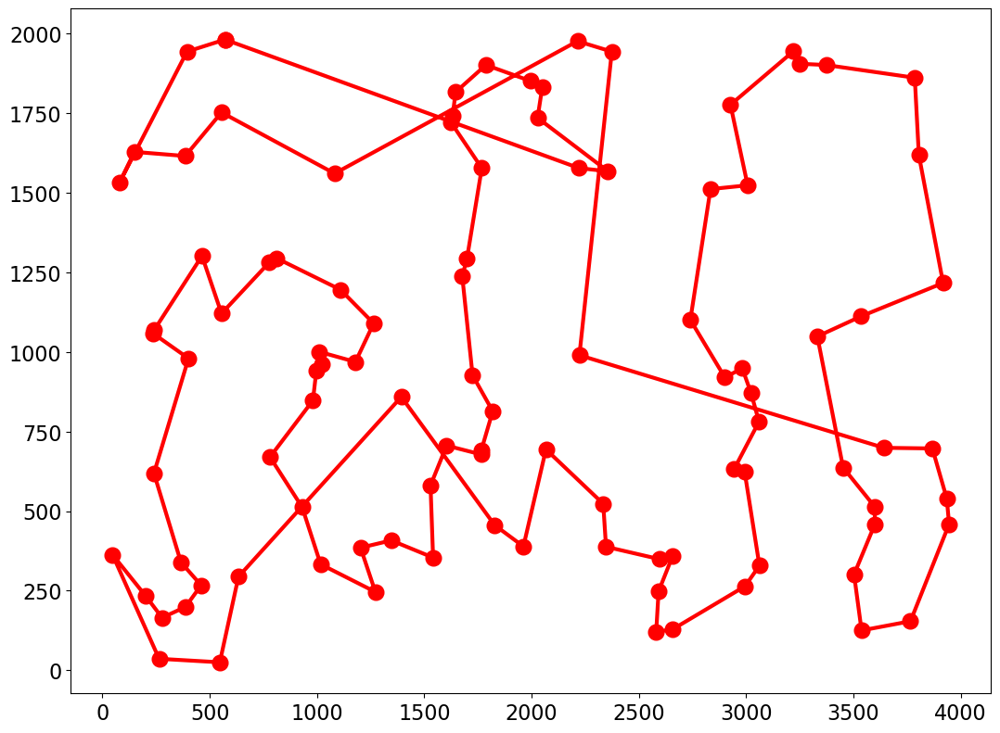

relative error pair-center tour:  12.548135625058702 %


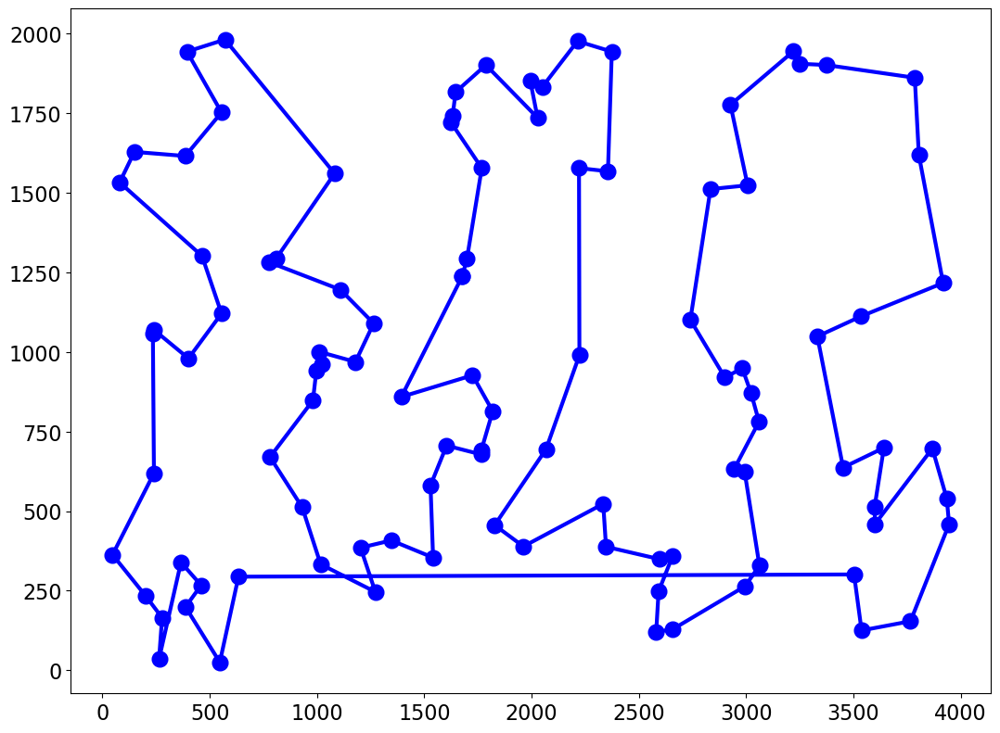

Minimum of objective function: 32839.24870533604
Mean of objective function: 38413.86237296599
Variance of objective function: 10779868.451554853
relative error genetic algorithm:  54.24063116370809 %


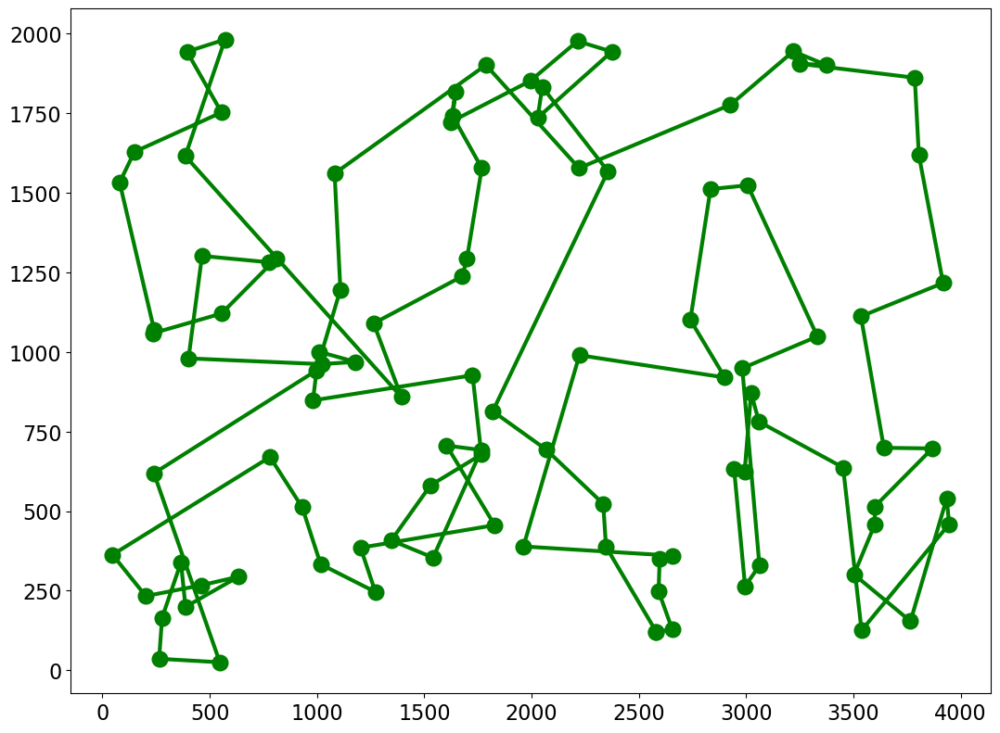

reading tour pr76
optimal tour not available
reading done 108159.0
1 relative error quick tour:  3.8119805101748354 %
2 relative error quick tour:  6.474727022254274 %
3 relative error quick tour:  4.944572342569735 %
4 relative error quick tour:  10.298726874323911 %
5 relative error quick tour:  6.41370574801912 %
6 relative error quick tour:  7.366932016753114 %
7 relative error quick tour:  8.205512255105909 %
8 relative error quick tour:  3.374661378156233 %
9 relative error quick tour:  11.286162039220038 %
10 relative error quick tour:  13.314657125158332 %
relative error quick tour  3.374661378156233 %


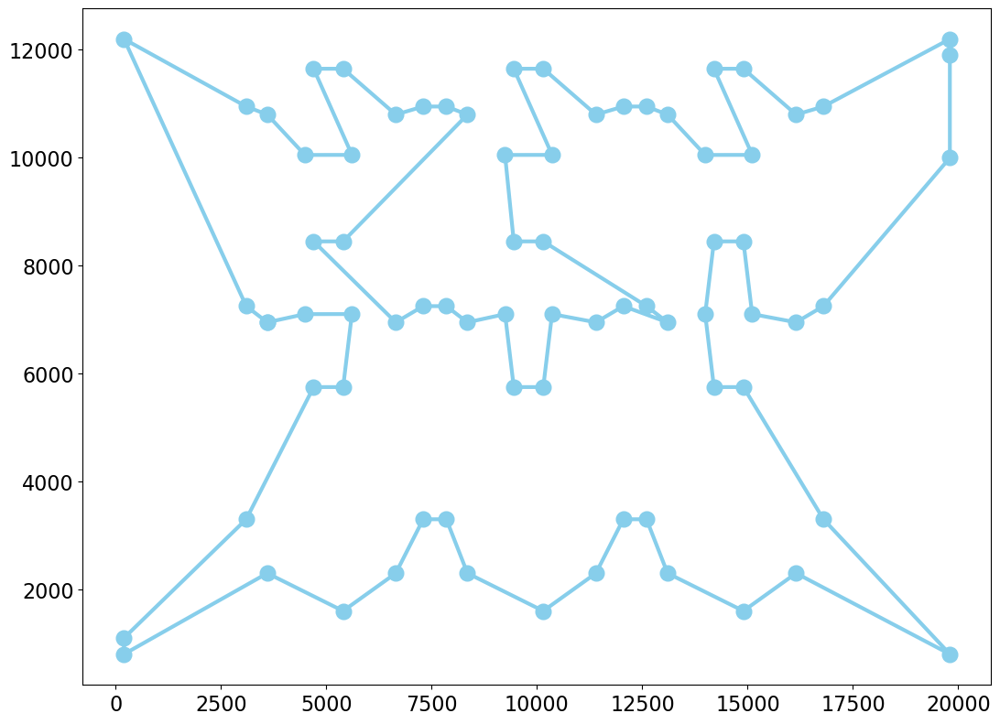

1 relative error closest neighbor:  42.83878364260025 %
2 relative error closest neighbor:  30.456087796669717 %
3 relative error closest neighbor:  36.61276454109228 %
4 relative error closest neighbor:  30.9072754001054 %
5 relative error closest neighbor:  39.87185532410618 %
6 relative error closest neighbor:  21.044943093038952 %
7 relative error closest neighbor:  36.742203607651696 %
8 relative error closest neighbor:  31.852180585989146 %
9 relative error closest neighbor:  39.42436597971505 %
10 relative error closest neighbor:  39.15161937517914 %
relative error closest-neighbor tour:  21.044943093038952 %


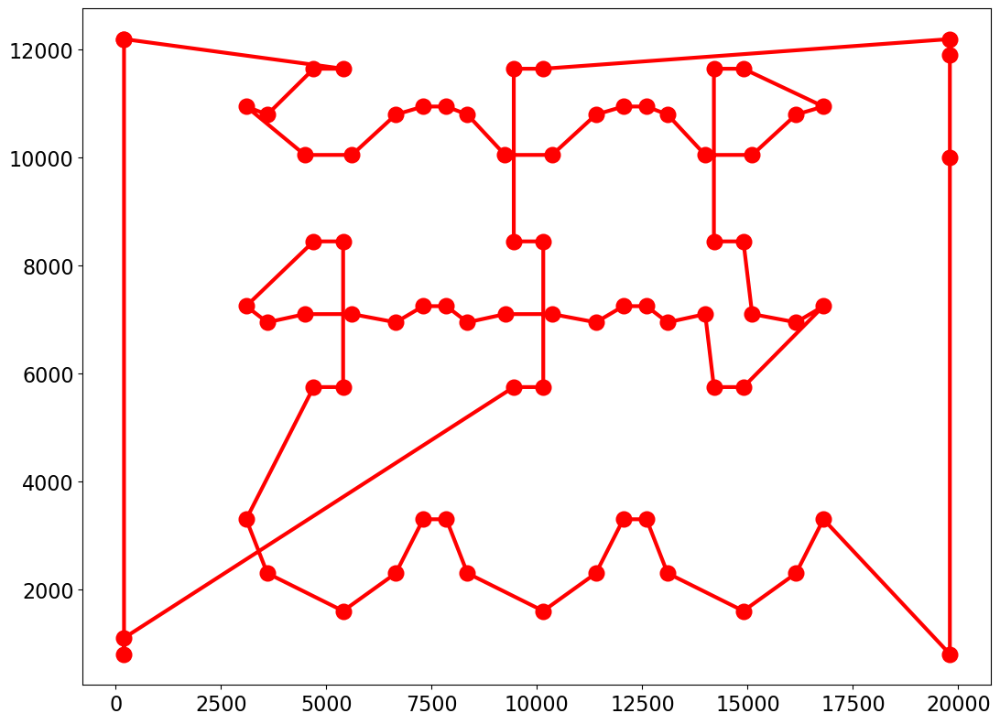

relative error pair-center tour:  13.423755766972697 %


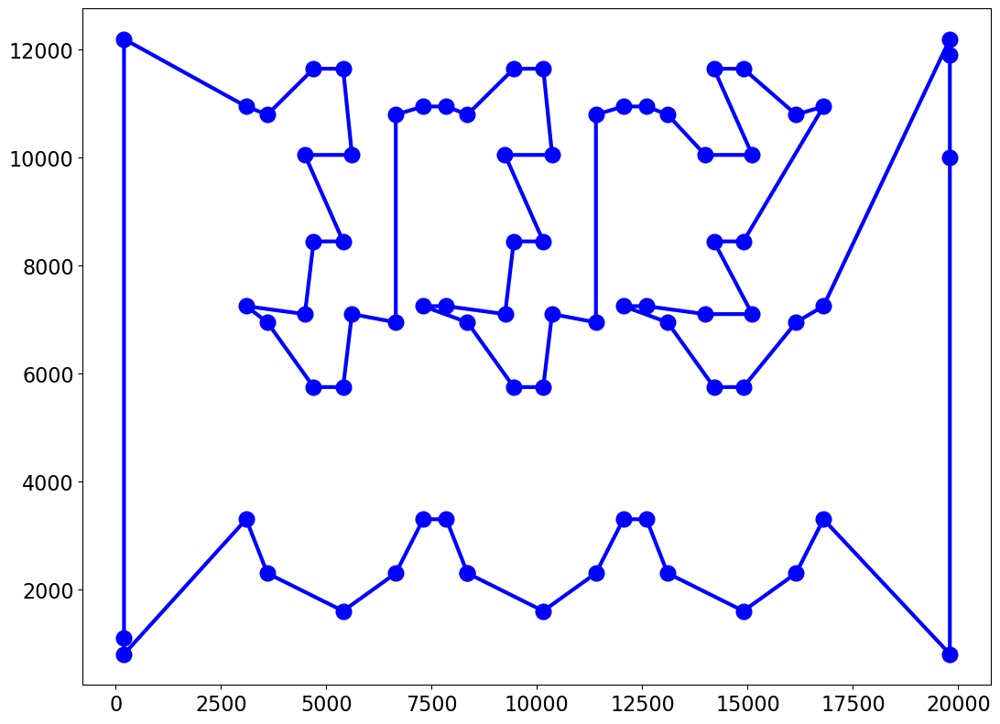

Minimum of objective function: 125215.71359901856
Mean of objective function: 141816.81496158658
Variance of objective function: 152123267.64615825
relative error genetic algorithm:  15.768452001220426 %


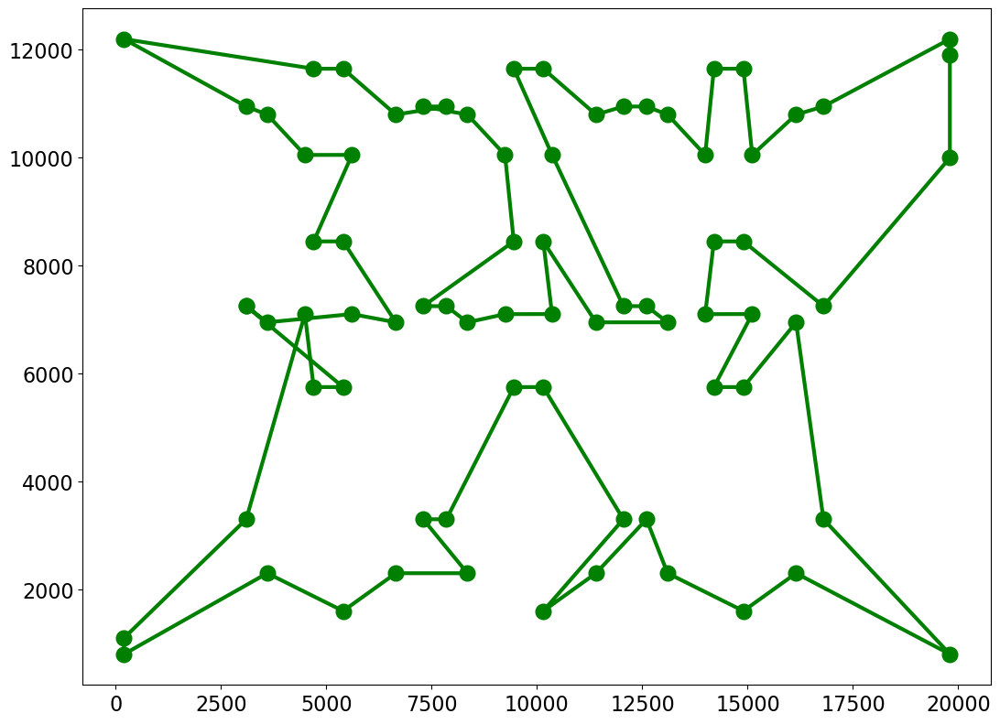

reading tour rat195
reading done 2323.0
1 relative error quick tour:  13.301764959104606 %
2 relative error quick tour:  15.755488592337494 %
3 relative error quick tour:  13.689195006457167 %
4 relative error quick tour:  13.560051657339647 %
5 relative error quick tour:  11.020232458028412 %
6 relative error quick tour:  15.238915195867413 %
7 relative error quick tour:  13.990529487731381 %
8 relative error quick tour:  13.689195006457167 %
9 relative error quick tour:  18.03702109341369 %
10 relative error quick tour:  11.235471373224279 %
relative error quick tour  11.020232458028412 %


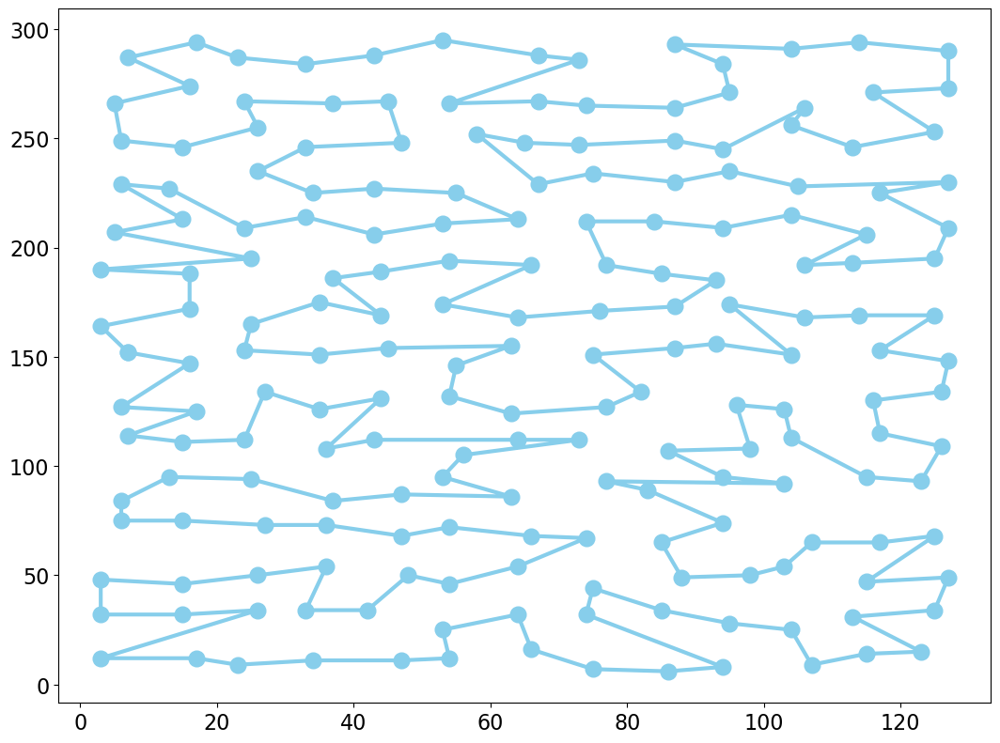

1 relative error closest neighbor:  22.12656048213517 %
2 relative error closest neighbor:  19.974171330176496 %
3 relative error closest neighbor:  25.398191993112356 %
4 relative error closest neighbor:  20.01721911321567 %
5 relative error closest neighbor:  11.579853637537667 %
6 relative error closest neighbor:  24.23590185105467 %
7 relative error closest neighbor:  14.507102884201464 %
8 relative error closest neighbor:  11.192423590185106 %
9 relative error closest neighbor:  21.65303486870426 %
10 relative error closest neighbor:  19.28540680154972 %
relative error closest-neighbor tour:  11.192423590185106 %


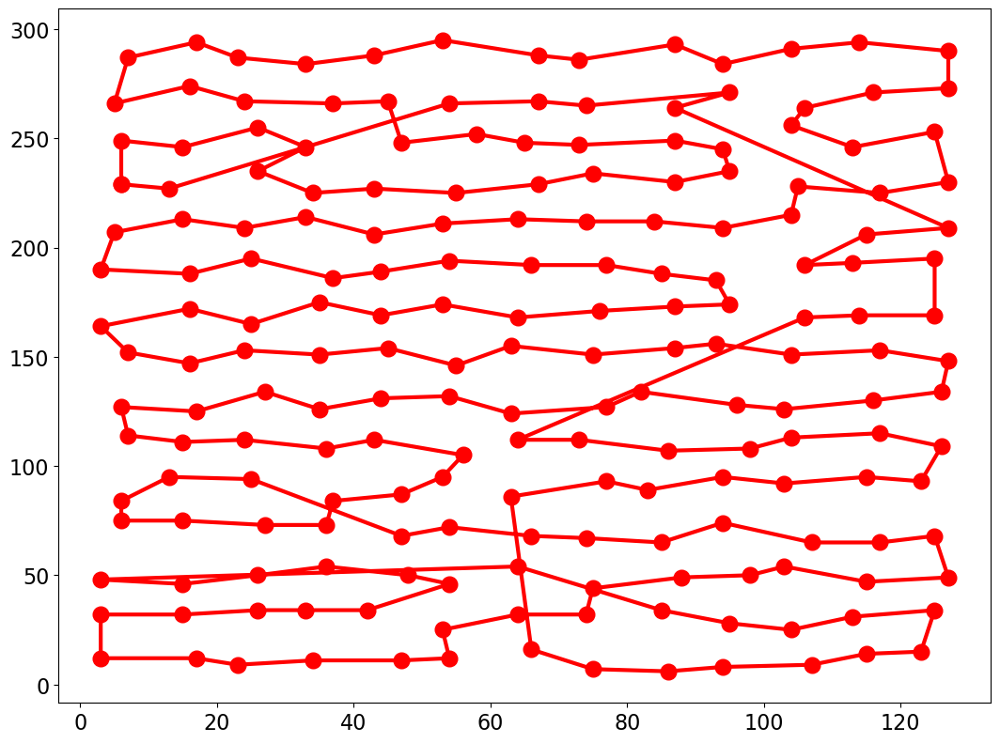

relative error pair-center tour:  12.397761515281964 %


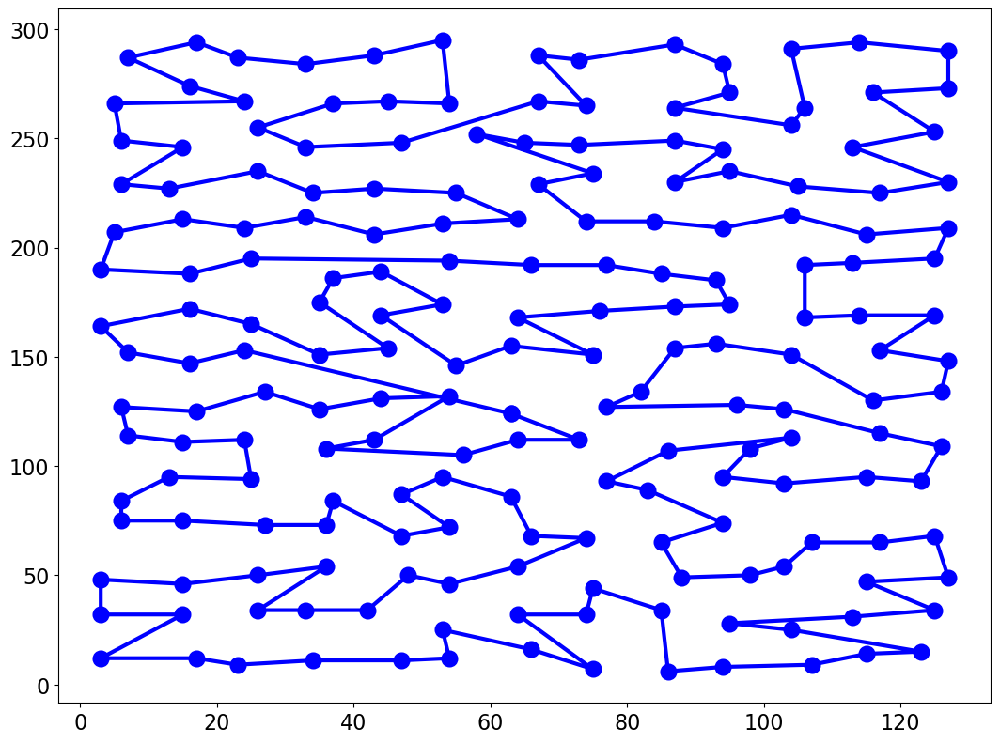

Minimum of objective function: 7661.182721692799
Mean of objective function: 8178.768905520013
Variance of objective function: 86324.10697007188
relative error genetic algorithm:  229.83211364614723 %


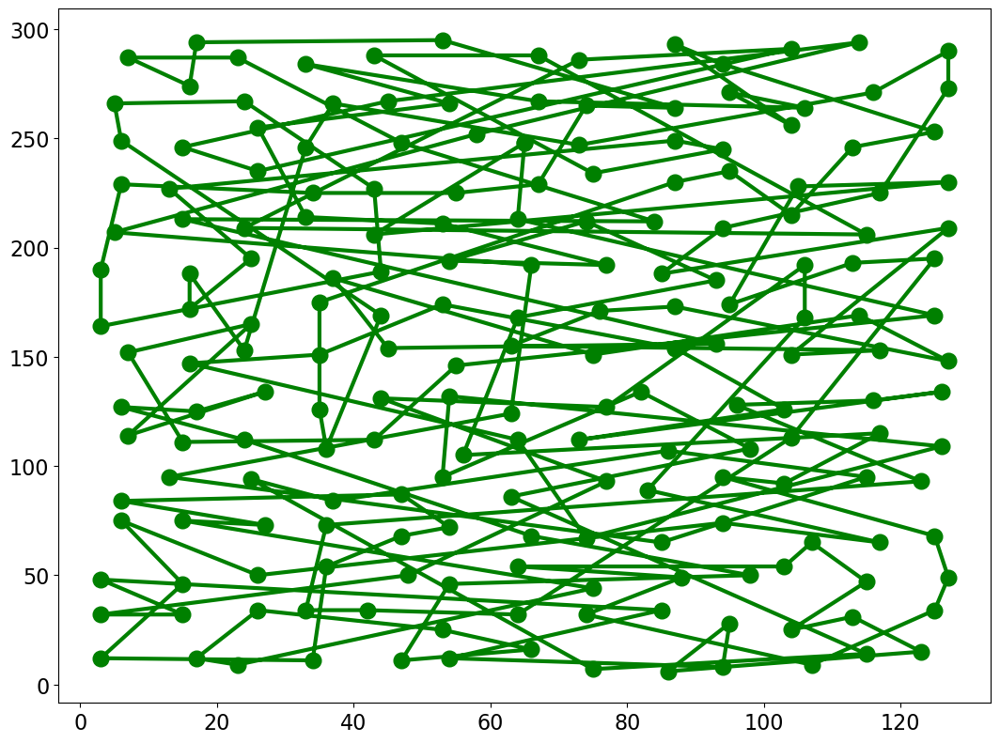

reading tour rat99
optimal tour not available
reading done 1211.0
1 relative error quick tour:  8.175061932287365 %
2 relative error quick tour:  9.49628406275805 %
3 relative error quick tour:  16.35012386457473 %
4 relative error quick tour:  7.844756399669694 %
5 relative error quick tour:  10.817506193228736 %
6 relative error quick tour:  8.175061932287365 %
7 relative error quick tour:  10.6523534269199 %
8 relative error quick tour:  10.32204789430223 %
9 relative error quick tour:  14.037985136251033 %
10 relative error quick tour:  15.441783649876136 %
relative error quick tour  7.844756399669694 %


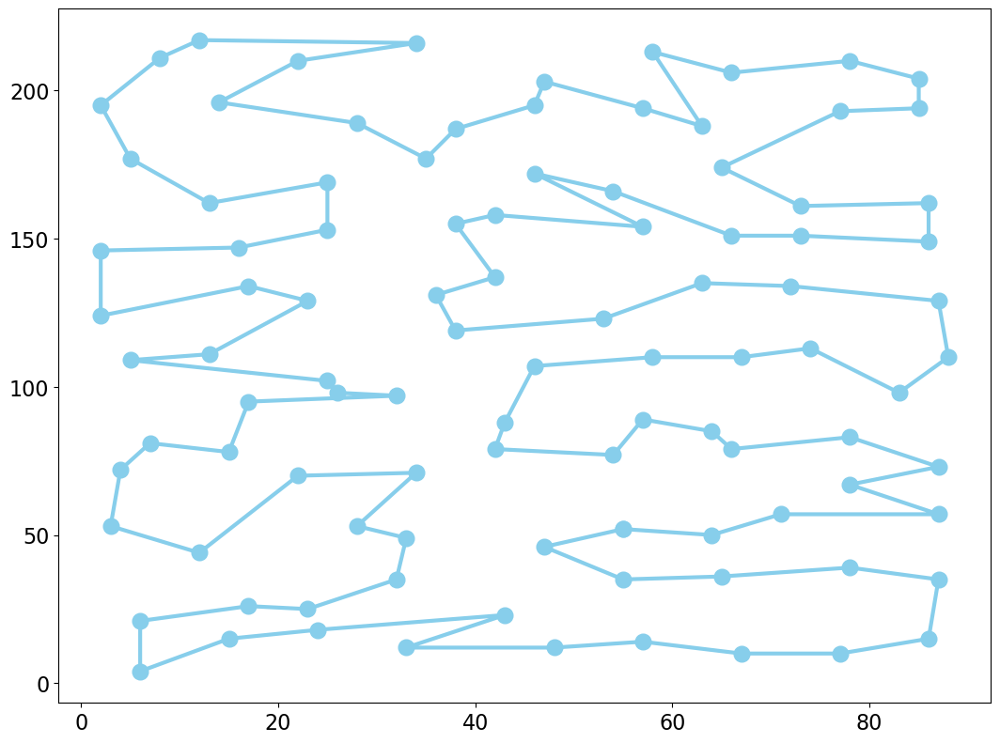

1 relative error closest neighbor:  19.48802642444261 %
2 relative error closest neighbor:  24.194880264244425 %
3 relative error closest neighbor:  21.469859620148636 %
4 relative error closest neighbor:  21.469859620148636 %
5 relative error closest neighbor:  17.671345995045417 %
6 relative error closest neighbor:  19.983484723369116 %
7 relative error closest neighbor:  29.149463253509495 %
8 relative error closest neighbor:  19.157720891824937 %
9 relative error closest neighbor:  18.74483897605285 %
10 relative error closest neighbor:  20.066061106523534 %
relative error closest-neighbor tour:  17.671345995045417 %


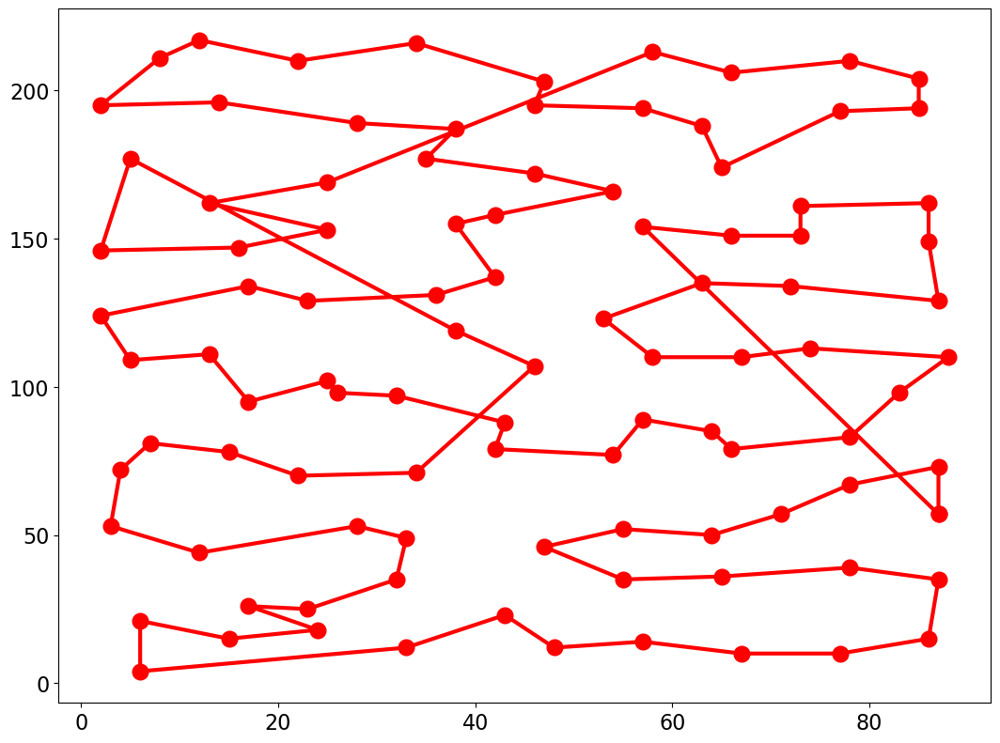

relative error pair-center tour:  21.800165152766308 %


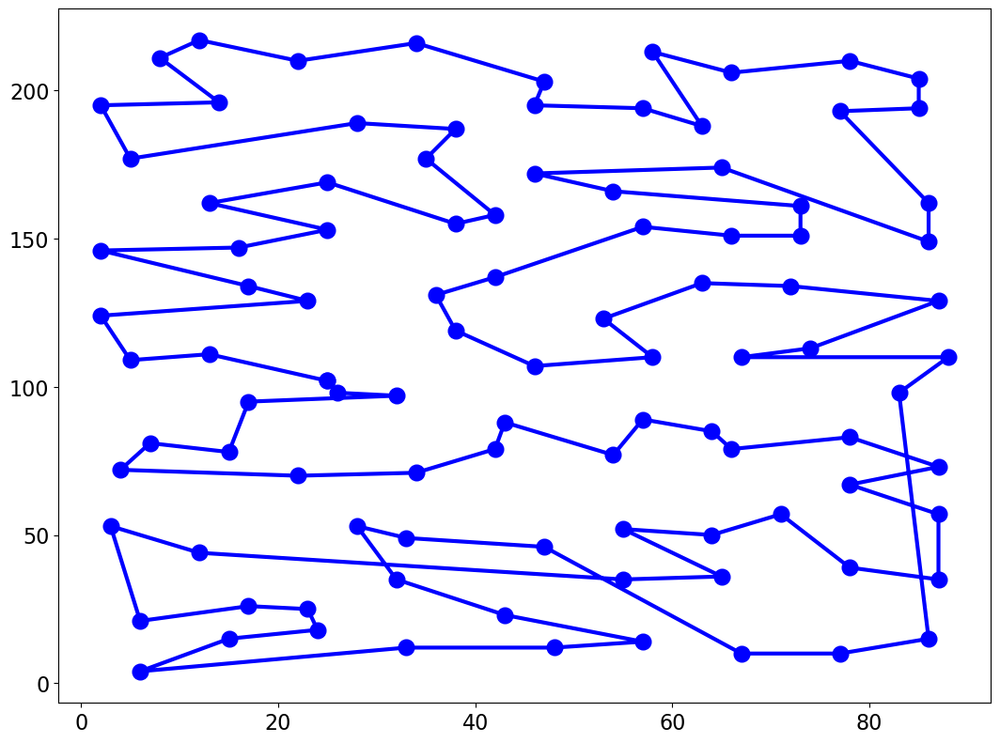

Minimum of objective function: 1857.1851675164505
Mean of objective function: 2148.165632080503
Variance of objective function: 25959.4749828696
relative error genetic algorithm:  52.60115606936416 %


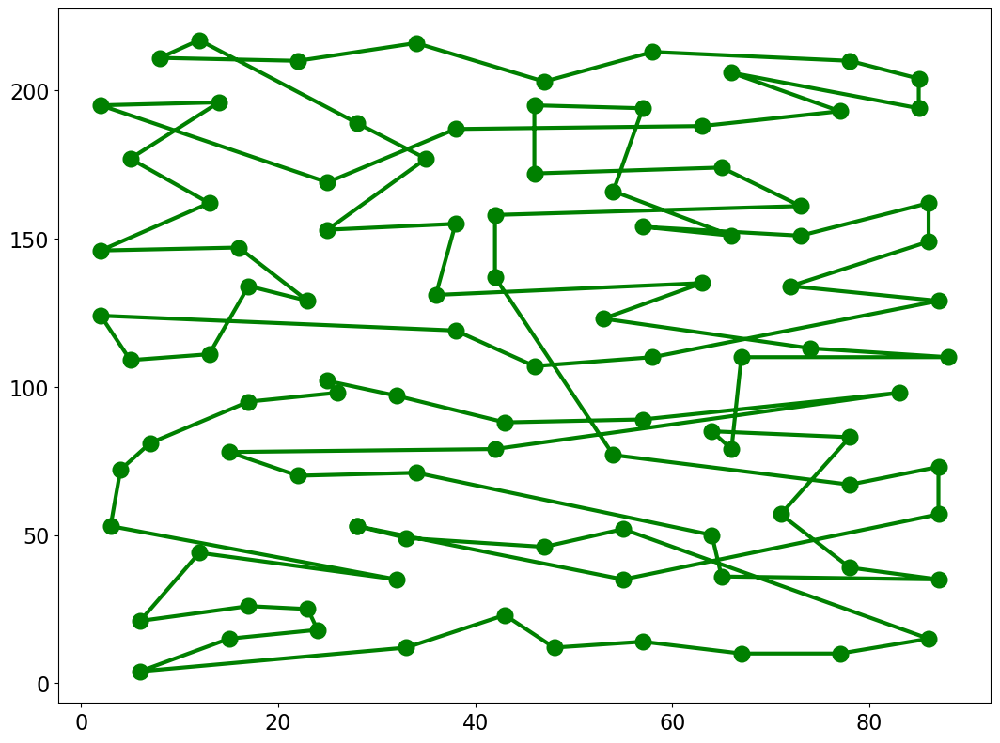

reading tour rd100
reading optimal tour rd100.pc.opt.tour
reading done 7910.0
strange best tour given 51218.0
1 relative error quick tour:  8.34386852085967 %
2 relative error quick tour:  10.417193426042983 %
3 relative error quick tour:  10.632111251580278 %
4 relative error quick tour:  12.414664981036662 %
5 relative error quick tour:  7.939317319848294 %
6 relative error quick tour:  6.498103666245259 %
7 relative error quick tour:  7.496839443742099 %
8 relative error quick tour:  11.90897597977244 %
9 relative error quick tour:  6.257901390644753 %
10 relative error quick tour:  9.254108723135271 %
relative error quick tour  6.257901390644753 %


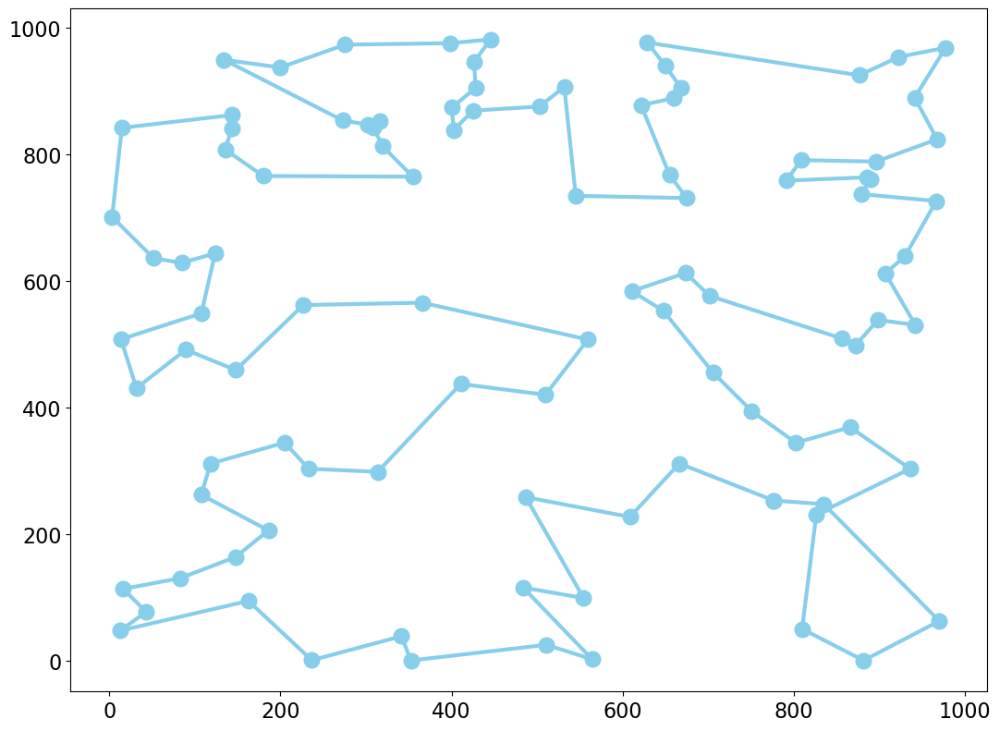

1 relative error closest neighbor:  24.52591656131479 %
2 relative error closest neighbor:  35.75221238938053 %
3 relative error closest neighbor:  24.664981036662454 %
4 relative error closest neighbor:  34.50063211125158 %
5 relative error closest neighbor:  26.991150442477878 %
6 relative error closest neighbor:  25.06953223767383 %
7 relative error closest neighbor:  22.718078381795195 %
8 relative error closest neighbor:  31.833122629582807 %
9 relative error closest neighbor:  25.06953223767383 %
10 relative error closest neighbor:  26.080910240202275 %
relative error closest-neighbor tour:  22.718078381795195 %


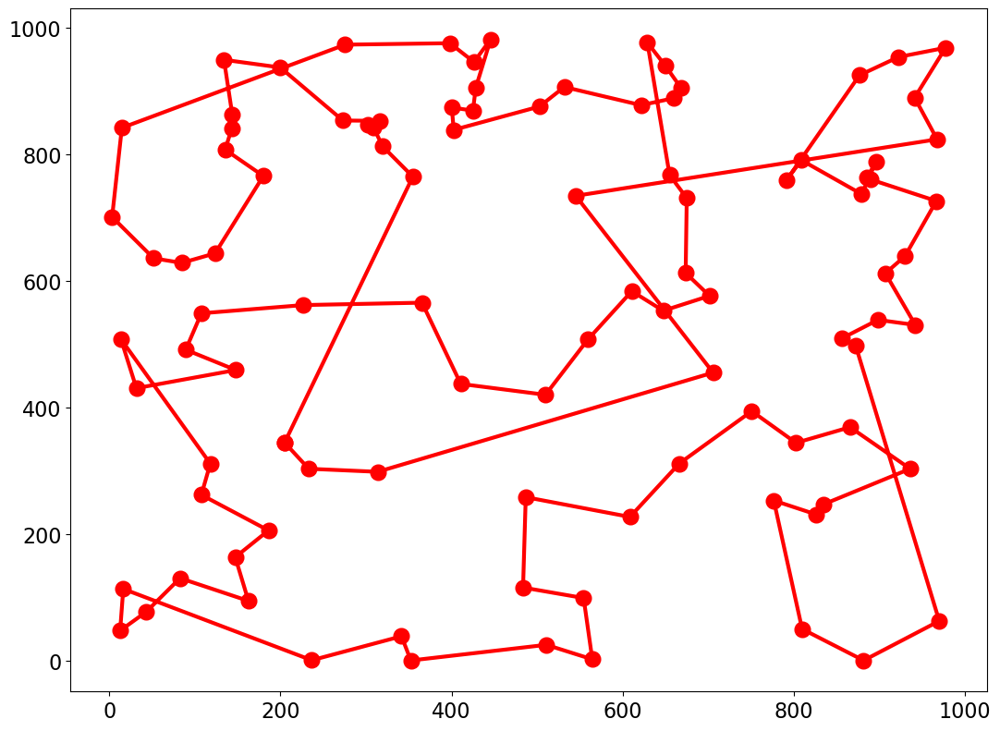

relative error pair-center tour:  11.959544879898862 %


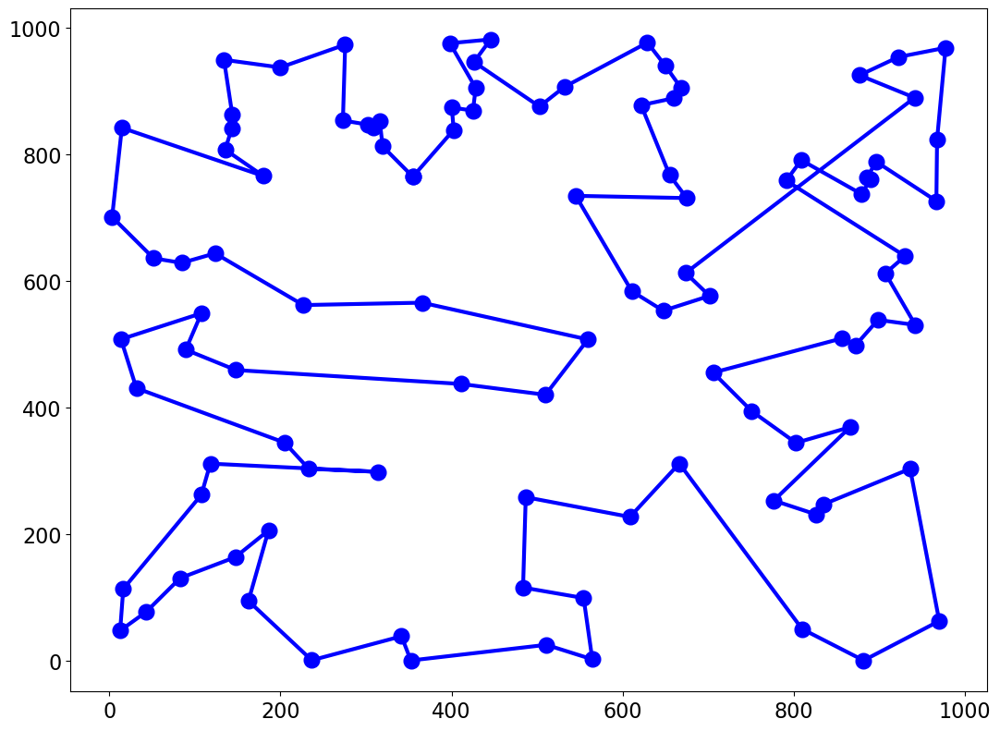

Minimum of objective function: 12626.533939273037
Mean of objective function: 14172.93173858684
Variance of objective function: 1273508.4604820015
relative error genetic algorithm:  59.63337547408344 %


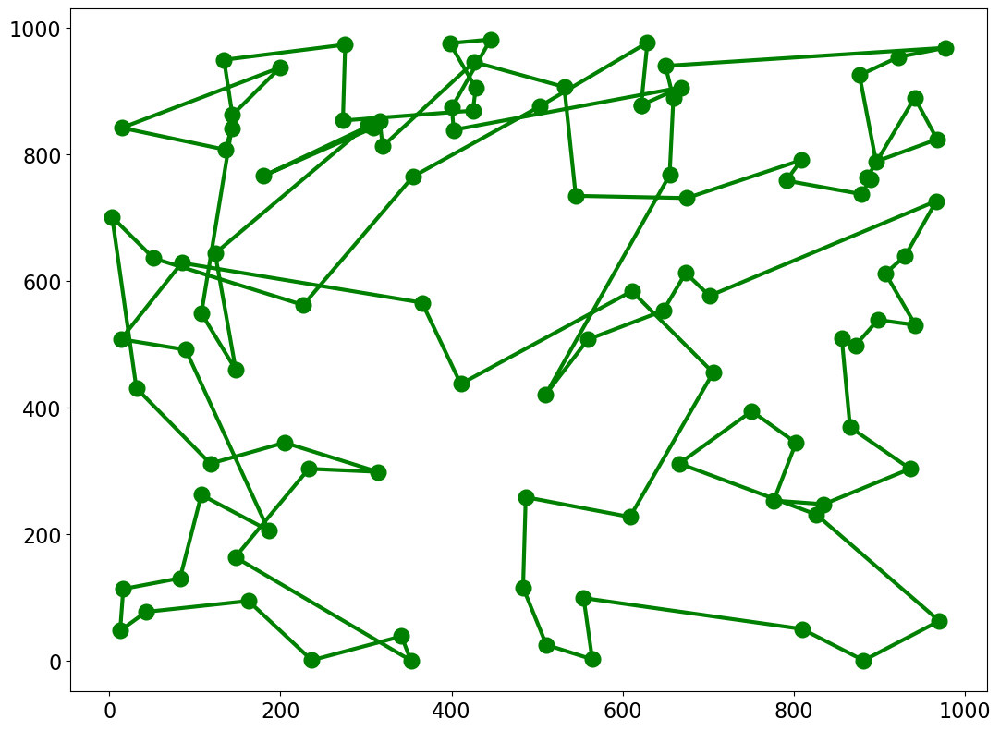

reading tour st70
reading optimal tour st70.opt.tour
reading done 675.0
1 relative error quick tour:  11.25925925925926 %
2 relative error quick tour:  5.185185185185185 %
3 relative error quick tour:  10.37037037037037 %
4 relative error quick tour:  5.037037037037037 %
5 relative error quick tour:  6.222222222222222 %
6 relative error quick tour:  5.777777777777778 %
7 relative error quick tour:  7.111111111111111 %
8 relative error quick tour:  7.703703703703703 %
9 relative error quick tour:  5.185185185185185 %
10 relative error quick tour:  8.296296296296296 %
relative error quick tour  5.037037037037037 %


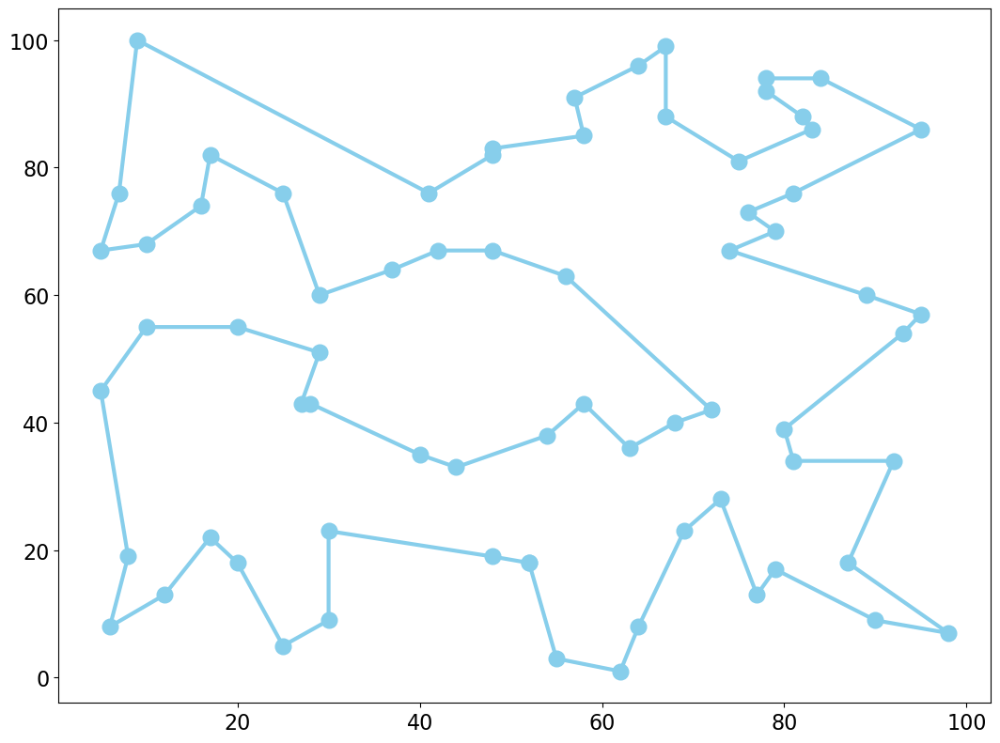

1 relative error closest neighbor:  22.962962962962962 %
2 relative error closest neighbor:  23.25925925925926 %
3 relative error closest neighbor:  21.77777777777778 %
4 relative error closest neighbor:  21.77777777777778 %
5 relative error closest neighbor:  18.37037037037037 %
6 relative error closest neighbor:  24.296296296296298 %
7 relative error closest neighbor:  18.814814814814813 %
8 relative error closest neighbor:  22.814814814814813 %
9 relative error closest neighbor:  29.333333333333332 %
10 relative error closest neighbor:  18.814814814814813 %
relative error closest-neighbor tour:  18.37037037037037 %


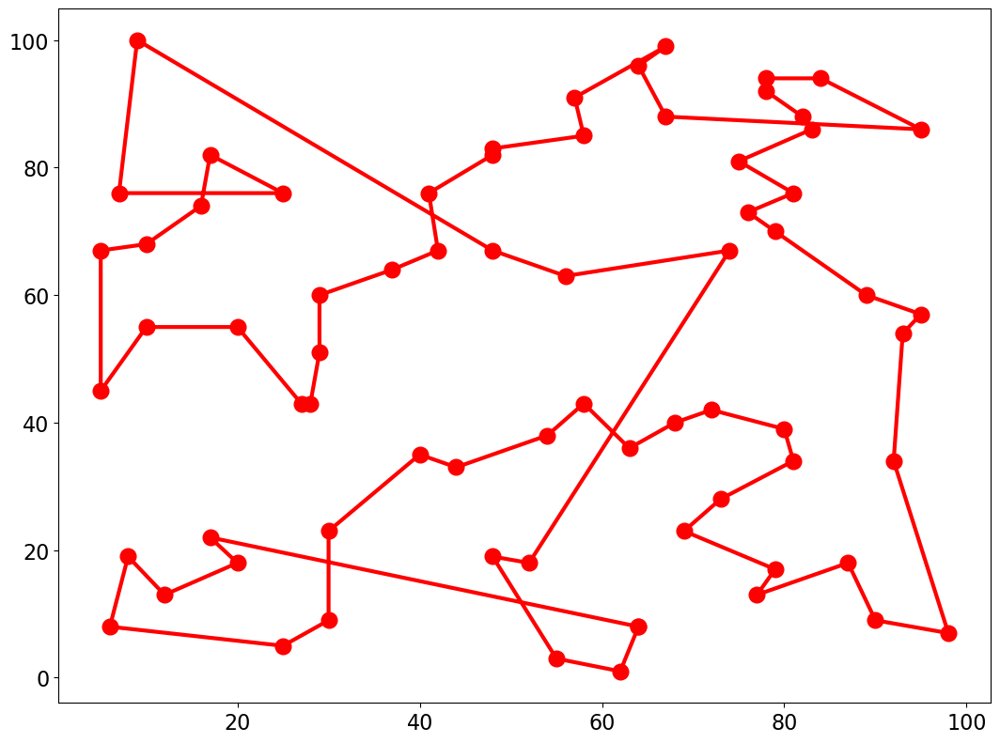

relative error pair-center tour:  7.555555555555555 %


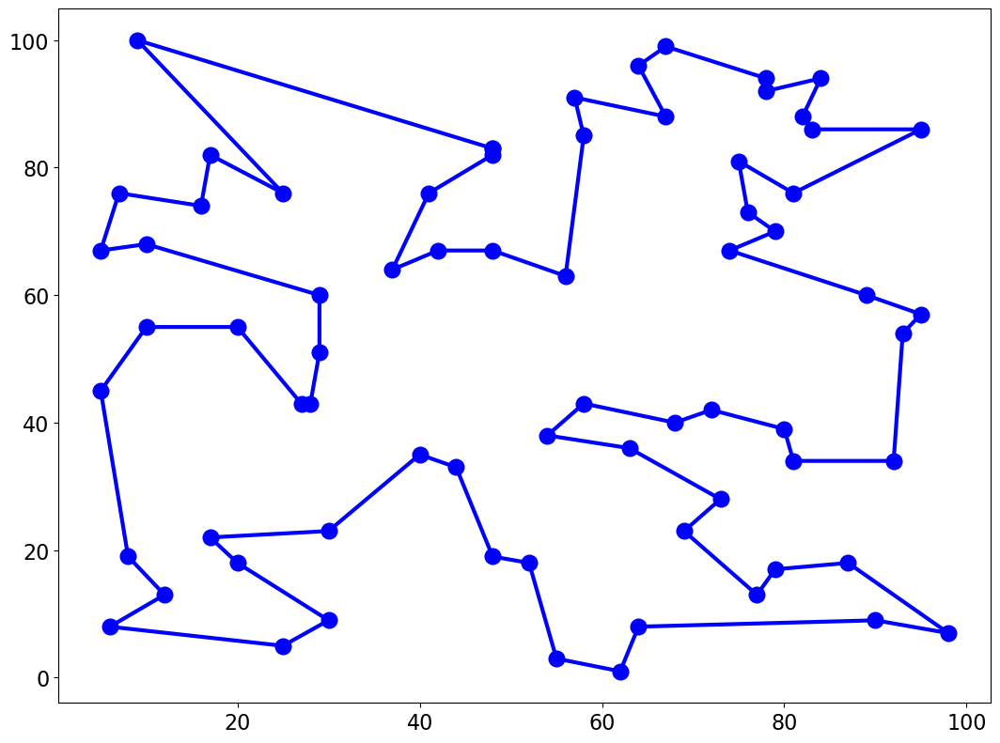

Minimum of objective function: 712.1140258091478
Mean of objective function: 787.3682054368621
Variance of objective function: 2237.292765871861
relative error genetic algorithm:  4.888888888888889 %


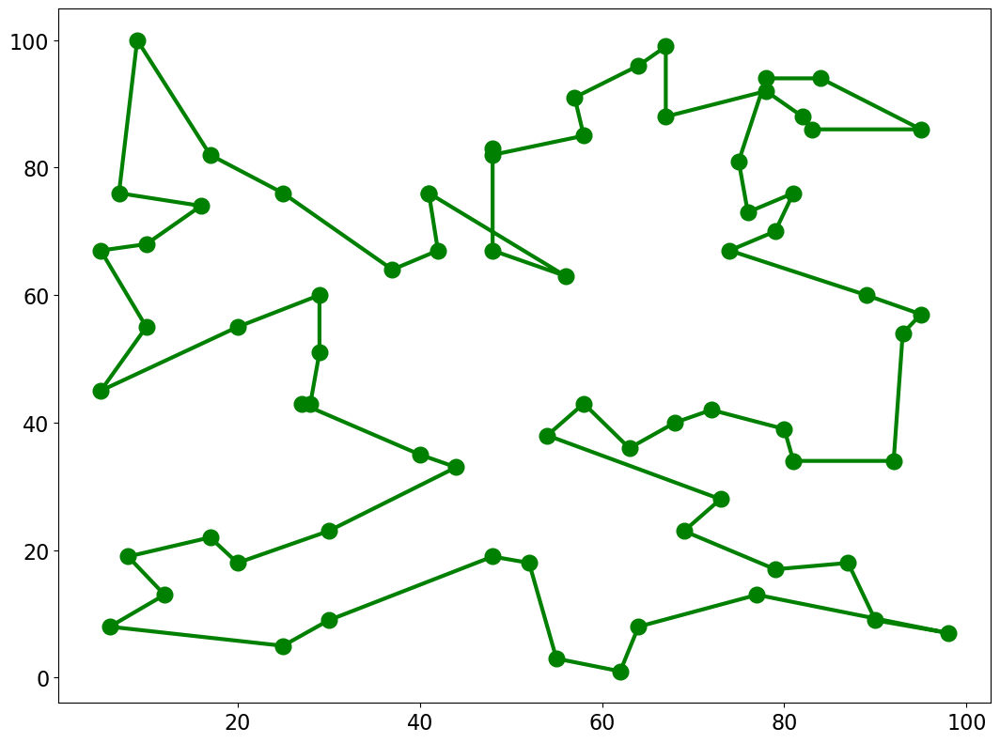

reading tour wi29
reading optimal tour wi29.pc.opt.tour
reading done 27603.0
1 relative error quick tour:  3.5358475528022315 %
2 relative error quick tour:  3.1482085280585443 %
3 relative error quick tour:  5.738506684056081 %
4 relative error quick tour:  0.5325508096945984 %
5 relative error quick tour:  5.220447052856573 %
6 relative error quick tour:  0.5325508096945984 %
7 relative error quick tour:  9.151179219650038 %
8 relative error quick tour:  2.130203238778394 %
9 relative error quick tour:  2.039633373184074 %
10 relative error quick tour:  9.201898344382856 %
relative error quick tour  0.5325508096945984 %


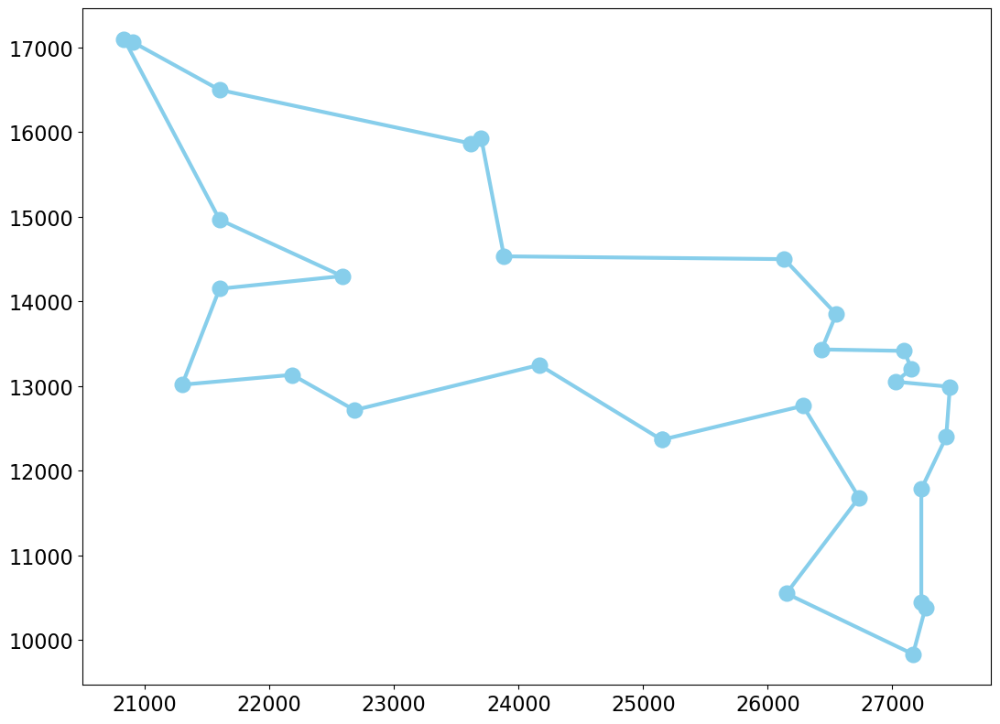

1 relative error closest neighbor:  33.99630474948375 %
2 relative error closest neighbor:  20.44705285657356 %
3 relative error closest neighbor:  20.736876426475384 %
4 relative error closest neighbor:  22.457703872767453 %
5 relative error closest neighbor:  24.65674020939753 %
6 relative error closest neighbor:  18.878382784479946 %
7 relative error closest neighbor:  19.037785747925952 %
8 relative error closest neighbor:  34.88026663768431 %
9 relative error closest neighbor:  33.99630474948375 %
10 relative error closest neighbor:  22.88519363837264 %
relative error closest-neighbor tour:  18.878382784479946 %


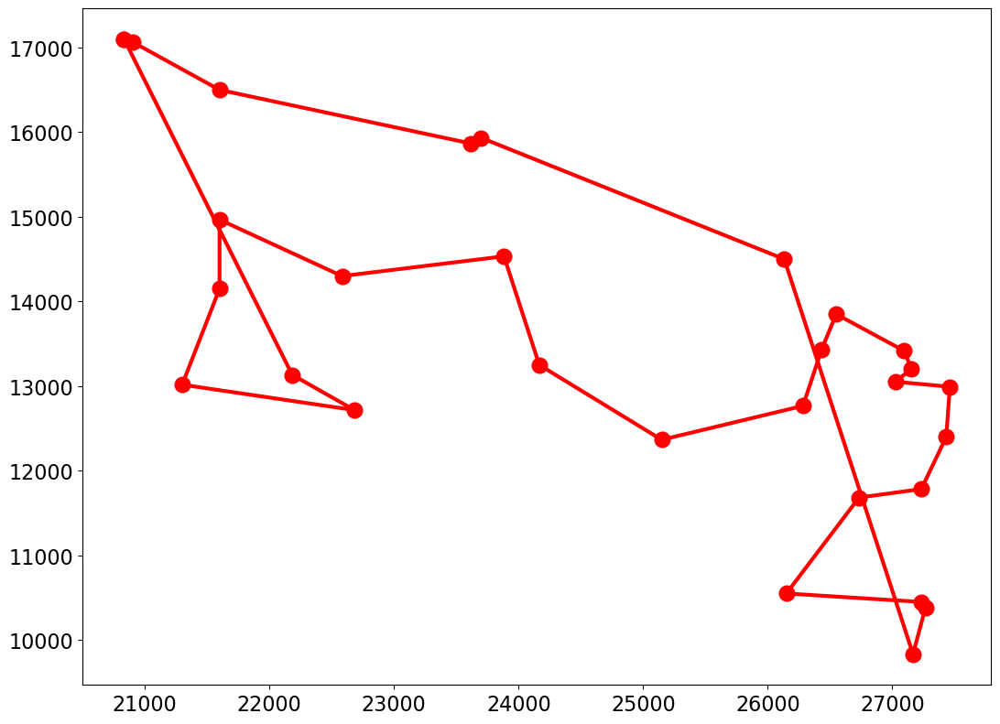

relative error pair-center tour:  23.247473100749918 %


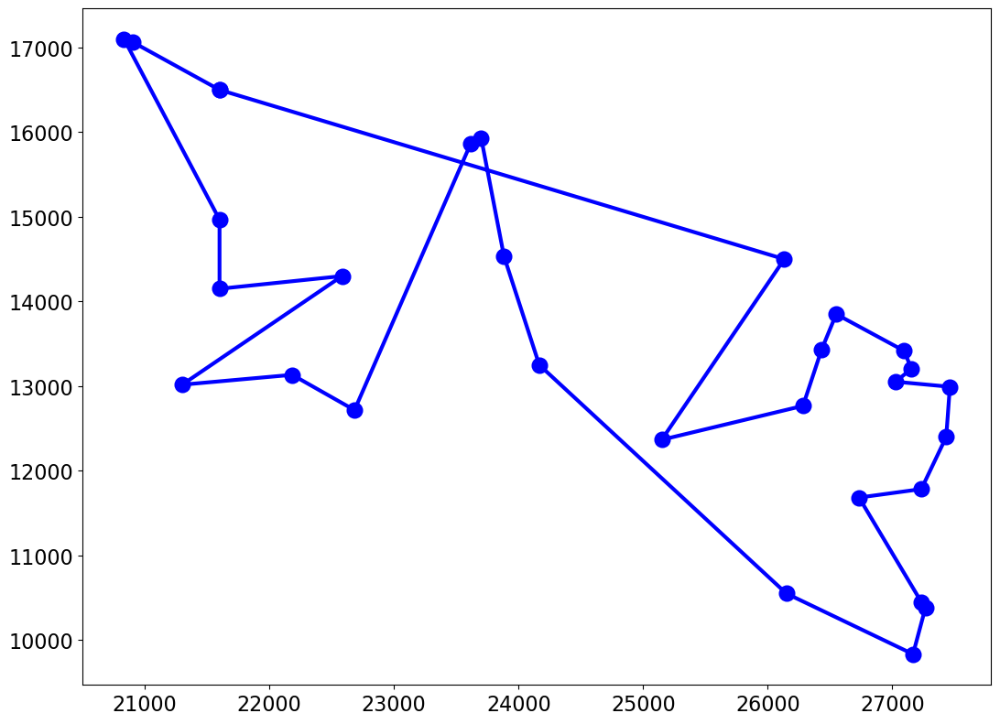

Minimum of objective function: 27601.173774493753
Mean of objective function: 27964.50931982557
Variance of objective function: 158369.23011974394
relative error genetic algorithm:  0.0 %


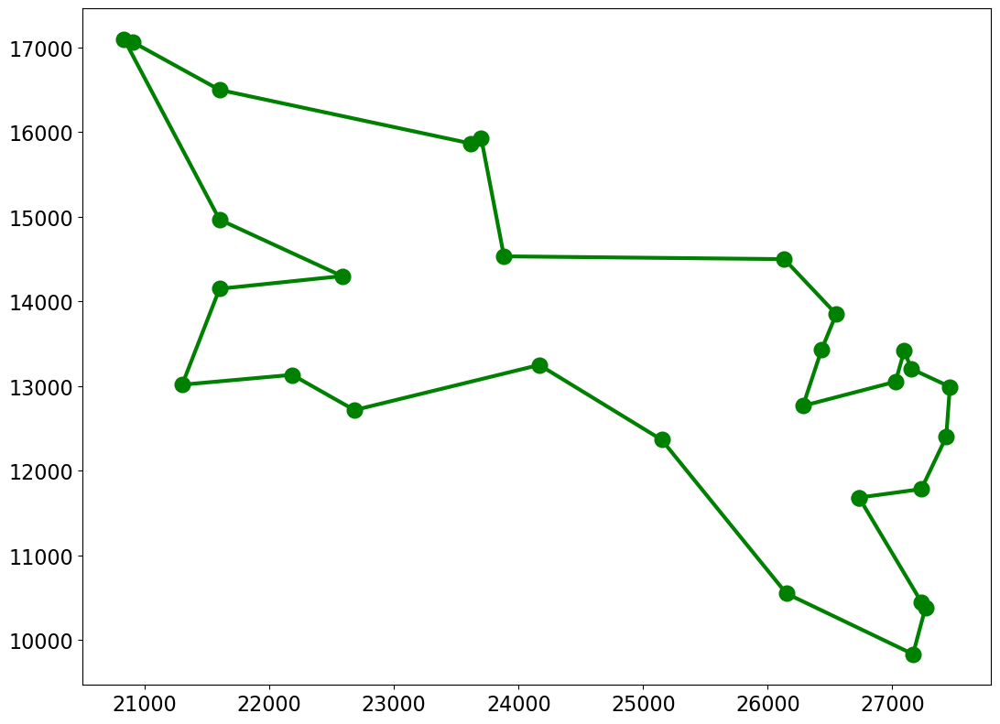

In [28]:
# Get tour filenames
tour_filenames = [ os.path.splitext(filename)[0] for filename in os.listdir(TOURS_PATH) if filename.endswith(".tsp") ]

# Set params to test (GA)
params = best_params

for filename in tour_filenames:
  theCities,bestLength,bestTour=ReadTsp(TOURS_PATH+"/"+filename)
  if bestTour != [] and bestLength!=TourLength(bestTour):
    print("strange best tour given",TourLength(bestTour))

  # Quick tour
  bestT,error=QuickTour(theCities,rounds,bestLength)
  print("relative error quick tour ",error,"%")
  PlotTour(bestT,"skyblue",show=True,fn=filename+"_QuickTour.png")

  # Closest neighbor tour
  bestT,error=ClosestNeighborTour(theCities,rounds,bestLength)
  print("relative error closest-neighbor tour: ",error,"%")
  PlotTour(bestT,"red",show=True,fn=filename+"_ClosestNeighbor.png")

  # Pair center tour
  bestT,error=PairCenterTour(theCities,bestLength)
  print("relative error pair-center tour: ",error,"%")
  PlotTour(bestT,"blue",show=True,fn=filename+"_PairCenter.png")

  # Monte Carlo genetic algorithm tour
  bestT,error=MonteCarloGATour(rounds,theCities,bestLength,params)
  print("relative error genetic algorithm: ",error,"%")
  PlotTour(bestT,"green",show=True,fn=filename+"_GeneticAlgorithm.png")

As we can see in the plots above, using the selected parameter set the genetic algorithm achieved to outperform the other heuristics obtaining a lower relative error with many tours (berlin52, block40, dj38, eil51, st70, wi29). However some of them still overpassed by the other heuristics (eil76, kroA100, kroB100, kroC100, kroD100, pr76, rat195, rat99, rd100).

It is interesting to see how the genetic algorithm using the selected parameter set obtains the best results when the number of cities in the tour is low (under 70). As we previously mention, finding the best parameters heavily depends on the problem, so in this case we could try to find another set of parameters to use when the number of cities is higher.

Another point worth to mention is that using this parameter set the genetic algorithm takes a lot of time to find the optimal tour (around 5 mins per tour) because of the high values of size_pop and max_iter.

In summary, genetic algorithms are more versatile and robust in finding near-optimal solutions for TSP instances with large solution spaces, while heuristics offer simpler and faster approaches, albeit with potentially lower quality solutions, especially for more complex TSP instances.

**Another experiment**

With experimental purposes let's see if we can find another set of parameters to deal with the tours composed of a high number of cities. We will test the same parameter set as before using the tour `rat195.tsp`.

In [10]:
filename='rat195'

# Define the parameter grid for GA
ga_param_grid = {
    'size_pop': [20, 50, 100, 500],
    'max_iter': [1000],
    'prob_mut': [0.0001, 0.001, 0.01, 0.1, 1],
}

# Perform grid search for GA
best_params = None
best_error = float('inf')

theCities,bestLength,bestTour=ReadTsp(TOURS_PATH+"/"+filename)
if bestTour != [] and bestLength!=TourLength(bestTour):
  print("strange best tour given",TourLength(bestTour))

for size_pop in ga_param_grid['size_pop']:
    for max_iter in ga_param_grid['max_iter']:
        for prob_mut in ga_param_grid['prob_mut']:
            params = {'size_pop': size_pop, 'max_iter': max_iter, 'prob_mut': prob_mut}
            print("Testing params",params)
            bestT,error=MonteCarloGATour(rounds,theCities,bestLength,params)
            print("Relative error genetic algorithm: ",error,"%")
            
            if error < best_error:
                best_error = error
                best_params = params

            print()

print("Best Parameters:", best_params)
print("Best Error Value:", best_error)

reading tour rat195
reading done 2323.0
Testing params {'size_pop': 20, 'max_iter': 1000, 'prob_mut': 0.0001}
Minimum of objective function: 17718.384831314463
Mean of objective function: 18644.978598298614
Variance of objective function: 522206.9576140555
Relative error genetic algorithm:  662.50538097288 %

Testing params {'size_pop': 20, 'max_iter': 1000, 'prob_mut': 0.001}
Minimum of objective function: 16354.746593171607
Mean of objective function: 17403.007927042578
Variance of objective function: 231129.66257386282
Relative error genetic algorithm:  603.960396039604 %

Testing params {'size_pop': 20, 'max_iter': 1000, 'prob_mut': 0.01}
Minimum of objective function: 11709.373830021183
Mean of objective function: 12526.415117753932
Variance of objective function: 262615.7692453196
Relative error genetic algorithm:  404.0895393887215 %

Testing params {'size_pop': 20, 'max_iter': 1000, 'prob_mut': 0.1}
Minimum of objective function: 6914.07151266153
Mean of objective function: 727

As we can see, we obtain a set of parameters which provide a best error value of 30.99, much lower than the previous 229.83 with the previous set of parameters for the tour `rat195.tsp`. Let's test again to find the optimal tours.

reading tour berlin52
reading done 7542.0
1 relative error quick tour:  15.43357199681782 %
2 relative error quick tour:  13.11323256430655 %
3 relative error quick tour:  10.5674887297799 %
4 relative error quick tour:  14.293290904269425 %
5 relative error quick tour:  14.770617873243172 %
6 relative error quick tour:  5.369928400954654 %
7 relative error quick tour:  14.744099708300185 %
8 relative error quick tour:  11.349774595597985 %
9 relative error quick tour:  10.779634049323787 %
10 relative error quick tour:  7.84937682312384 %
relative error quick tour  5.369928400954654 %


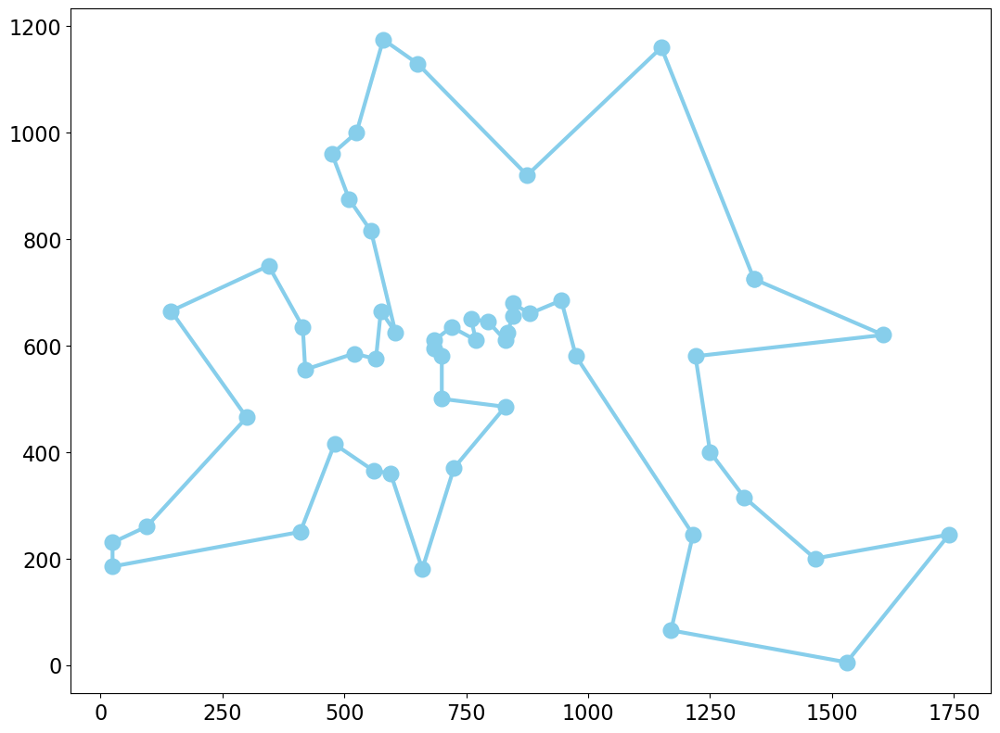

1 relative error closest neighbor:  29.474940334128878 %
2 relative error closest neighbor:  23.362503314770617 %
3 relative error closest neighbor:  22.65977194378149 %
4 relative error closest neighbor:  32.723415539644655 %
5 relative error closest neighbor:  19.265446831079288 %
6 relative error closest neighbor:  23.534871386900026 %
7 relative error closest neighbor:  33.82391938477857 %
8 relative error closest neighbor:  19.265446831079288 %
9 relative error closest neighbor:  20.96260938743039 %
10 relative error closest neighbor:  23.534871386900026 %
relative error closest-neighbor tour:  19.265446831079288 %


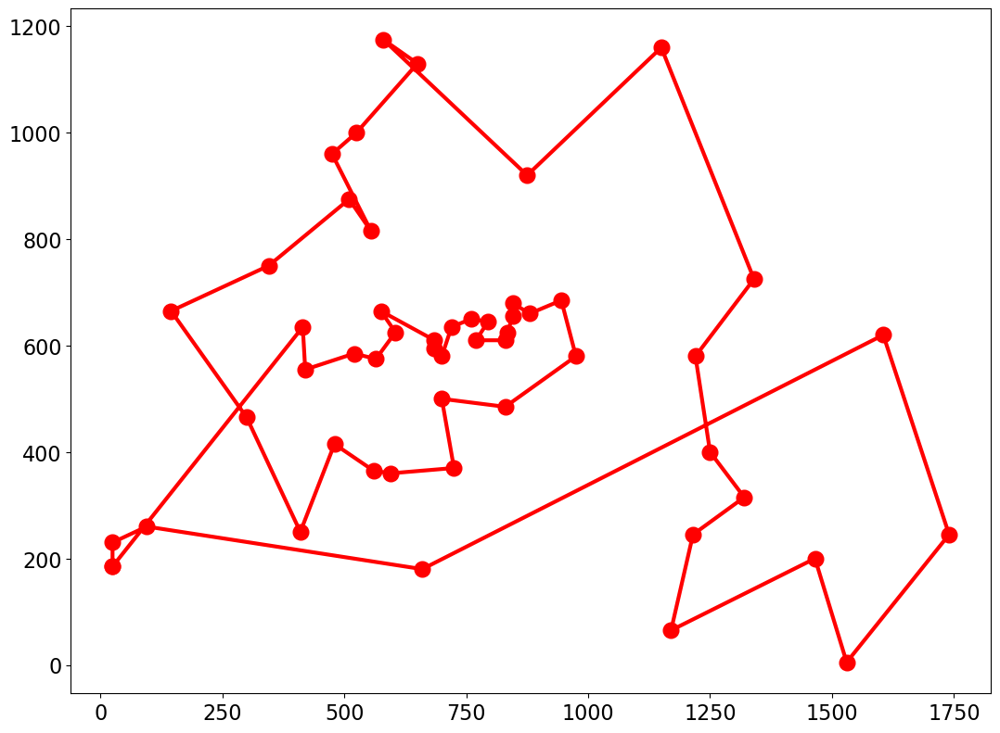

relative error pair-center tour:  7.265977194378149 %


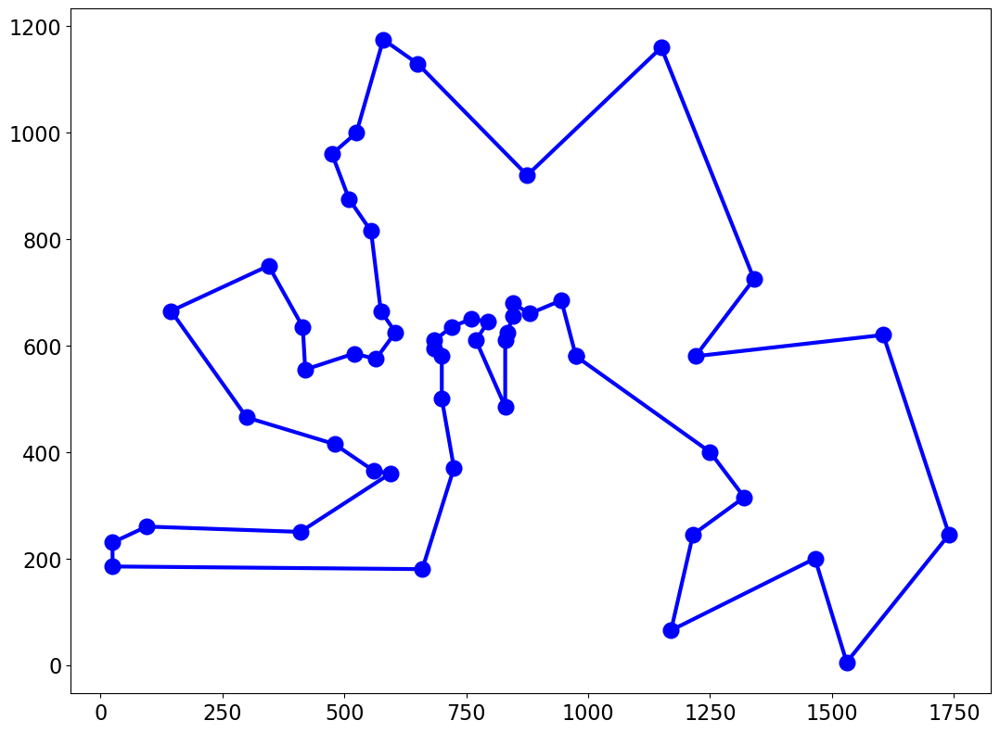

Minimum of objective function: 8060.149485093293
Mean of objective function: 8260.001958217917
Variance of objective function: 48689.43254369488
relative error genetic algorithm:  6.86820472023336 %


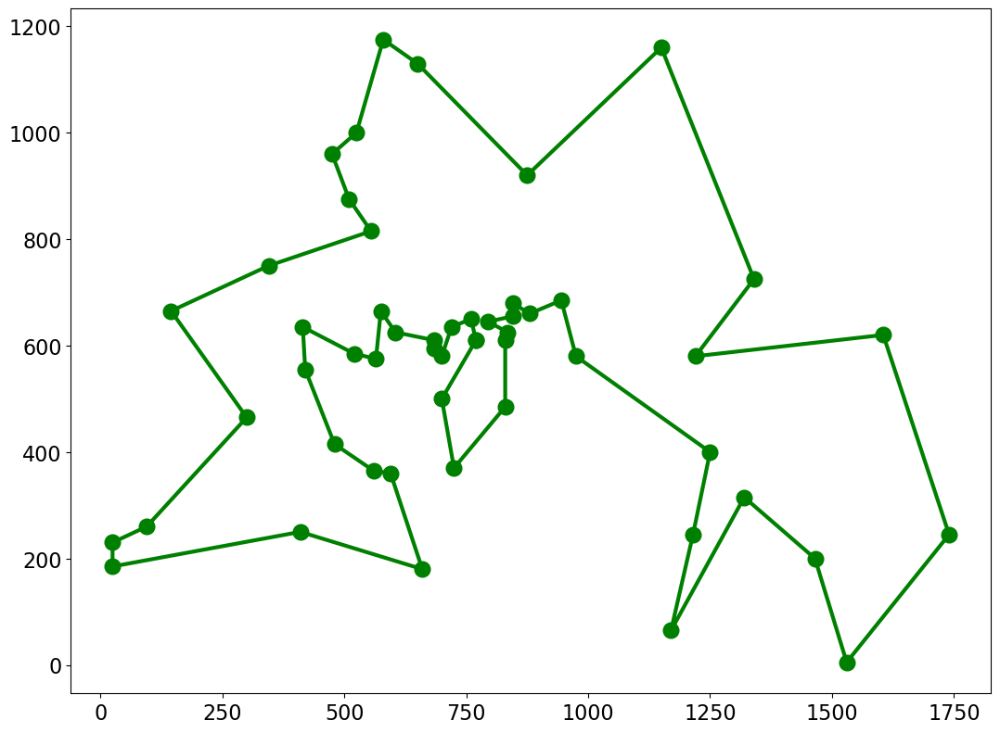

reading tour block40
reading optimal tour bestTour.opt.tour
reading done 400.0
1 relative error quick tour:  4.0 %
2 relative error quick tour:  8.0 %
3 relative error quick tour:  8.0 %
4 relative error quick tour:  6.0 %
5 relative error quick tour:  4.0 %
6 relative error quick tour:  8.0 %
7 relative error quick tour:  4.0 %
8 relative error quick tour:  6.0 %
9 relative error quick tour:  8.0 %
10 relative error quick tour:  6.0 %
relative error quick tour  4.0 %


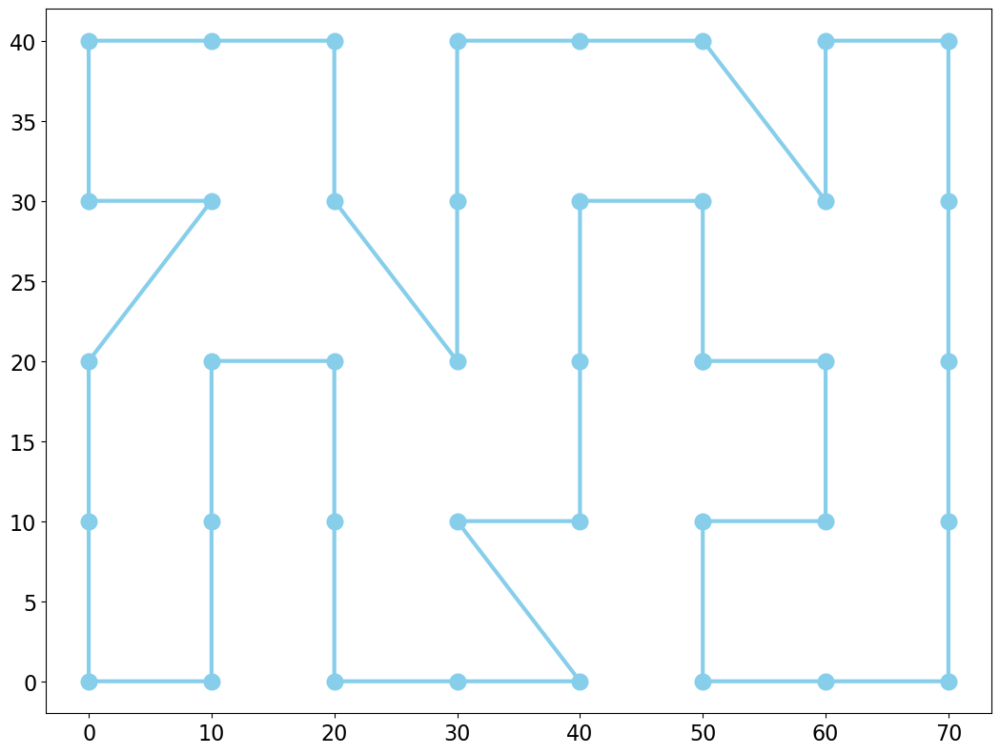

1 relative error closest neighbor:  19.25 %
2 relative error closest neighbor:  11.0 %
3 relative error closest neighbor:  13.0 %
4 relative error closest neighbor:  20.75 %
5 relative error closest neighbor:  27.75 %
6 relative error closest neighbor:  20.5 %
7 relative error closest neighbor:  13.0 %
8 relative error closest neighbor:  22.5 %
9 relative error closest neighbor:  26.25 %
10 relative error closest neighbor:  31.5 %
relative error closest-neighbor tour:  11.0 %


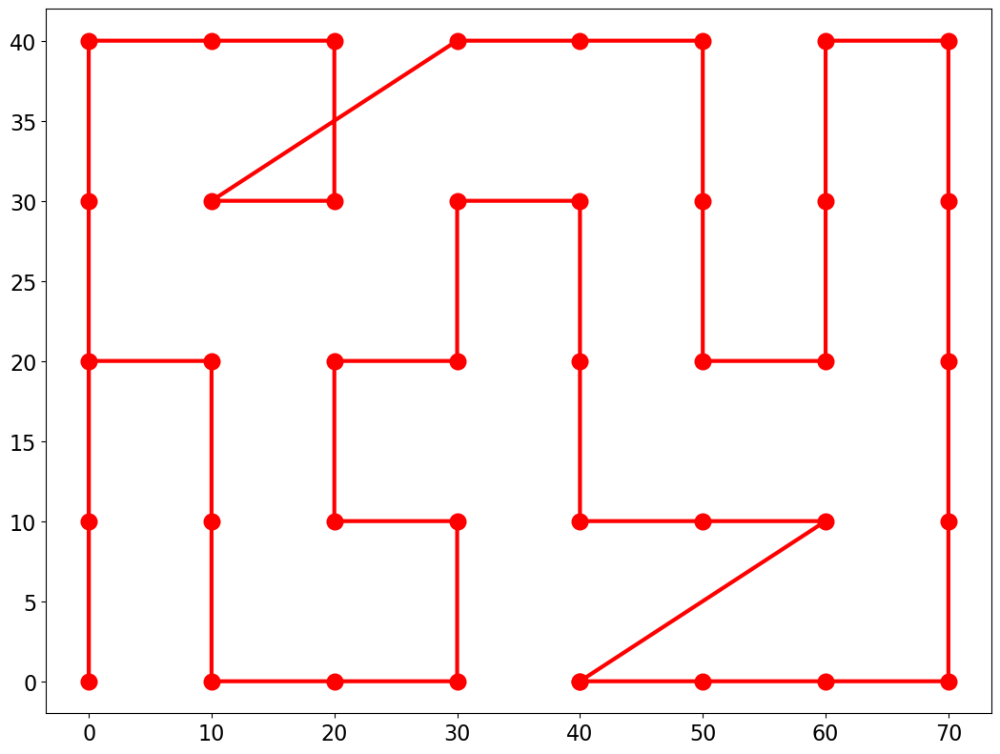

relative error pair-center tour:  8.0 %


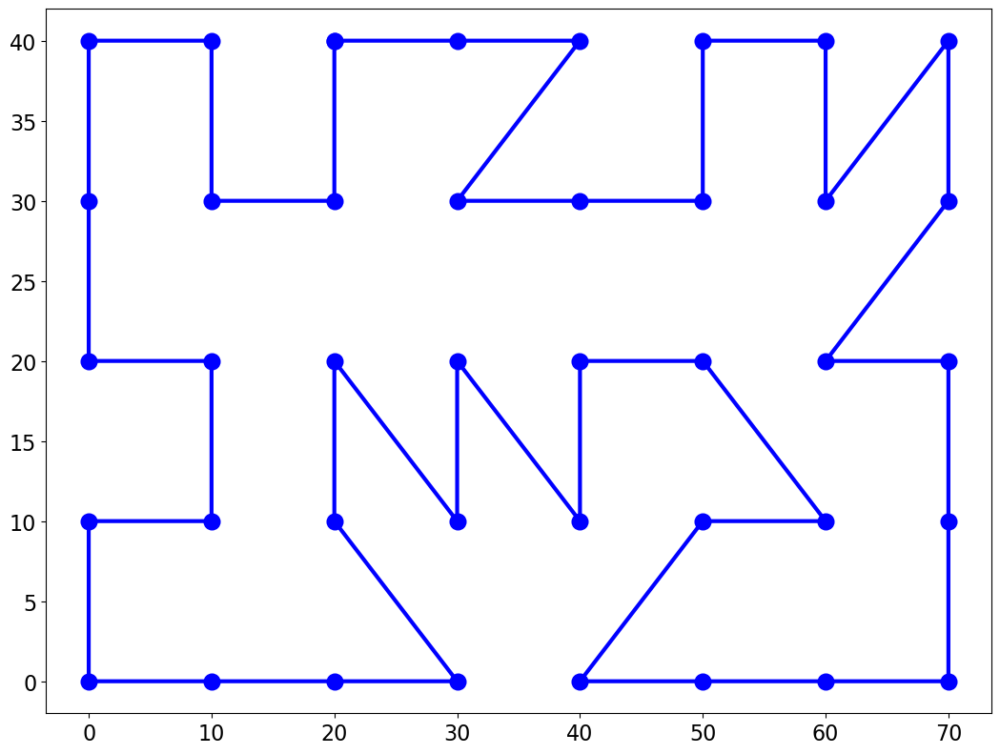

Minimum of objective function: 408.2842712474619
Mean of objective function: 417.39696961967
Variance of objective function: 47.35411357005155
relative error genetic algorithm:  2.0 %


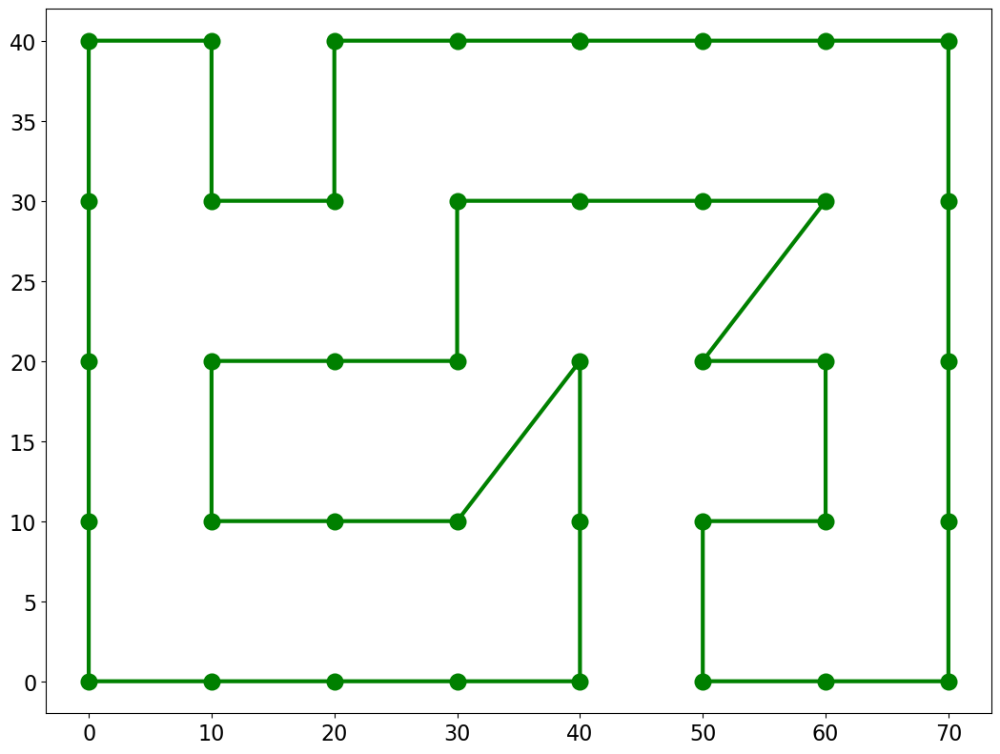

reading tour dj38
reading optimal tour dj38.pc.opt.tour
reading done 6656.0
1 relative error quick tour:  10.486778846153847 %
2 relative error quick tour:  8.89423076923077 %
3 relative error quick tour:  7.9326923076923075 %
4 relative error quick tour:  15.459735576923077 %
5 relative error quick tour:  10.426682692307692 %
6 relative error quick tour:  10.366586538461538 %
7 relative error quick tour:  13.266225961538462 %
8 relative error quick tour:  6.295072115384615 %
9 relative error quick tour:  8.0078125 %
10 relative error quick tour:  5.513822115384615 %
relative error quick tour  5.513822115384615 %


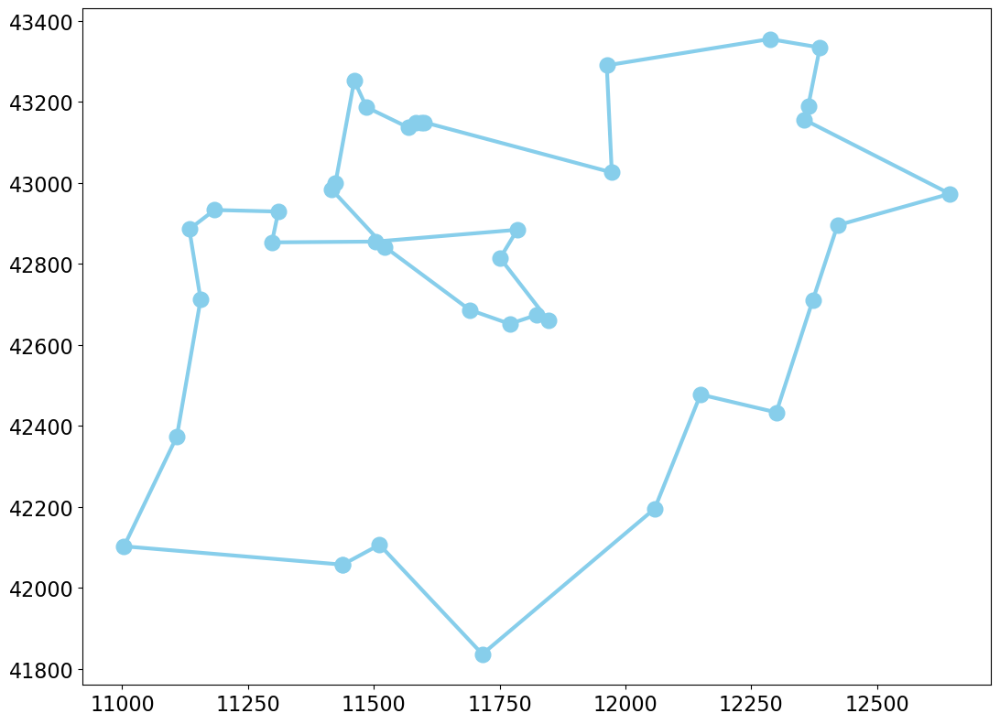

1 relative error closest neighbor:  5.228365384615385 %
2 relative error closest neighbor:  17.157451923076923 %
3 relative error closest neighbor:  4.582331730769231 %
4 relative error closest neighbor:  2.644230769230769 %
5 relative error closest neighbor:  24.744591346153847 %
6 relative error closest neighbor:  19.260817307692307 %
7 relative error closest neighbor:  11.538461538461538 %
8 relative error closest neighbor:  26.487379807692307 %
9 relative error closest neighbor:  22.611177884615383 %
10 relative error closest neighbor:  1.6676682692307692 %
relative error closest-neighbor tour:  1.6676682692307692 %


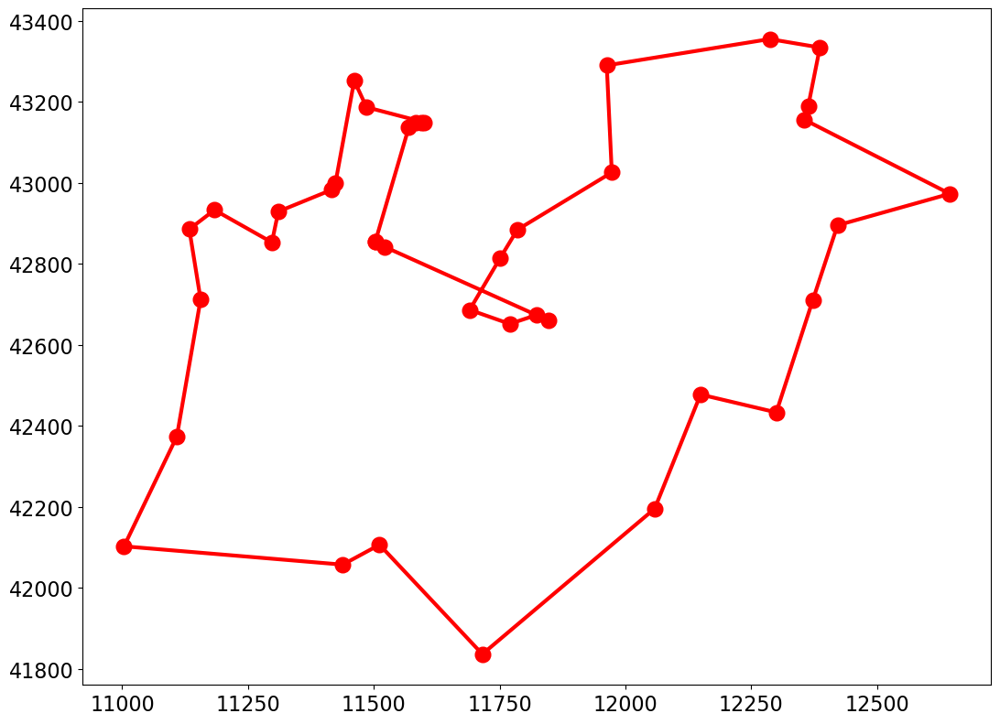

relative error pair-center tour:  3.2001201923076925 %


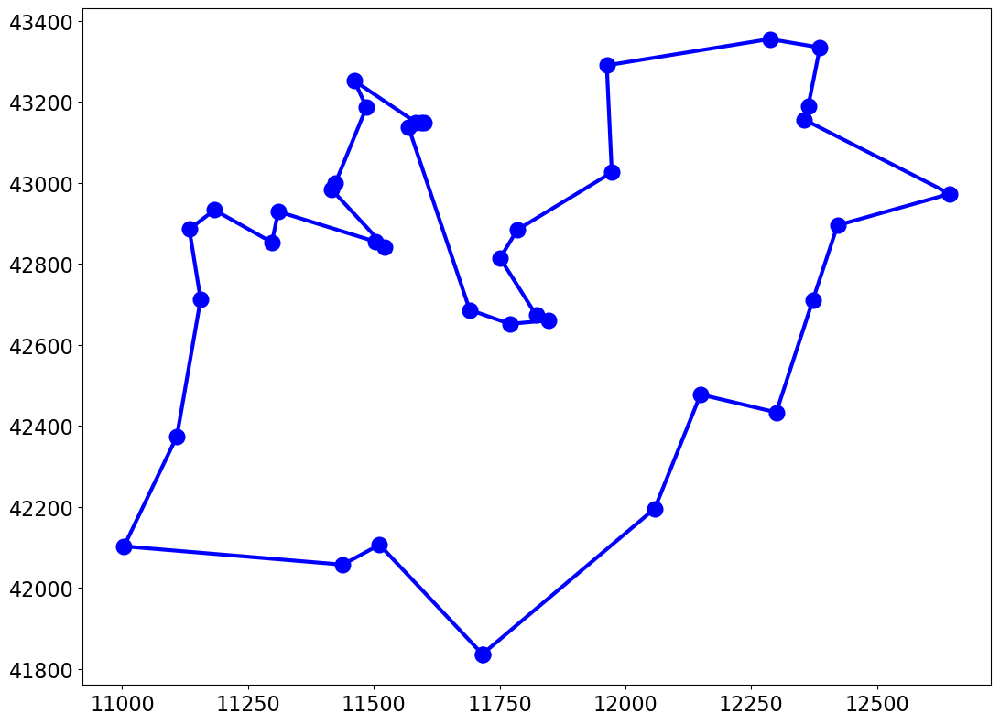

Minimum of objective function: 6664.113570564627
Mean of objective function: 7042.877580335851
Variance of objective function: 47830.2852274788
relative error genetic algorithm:  0.06009615384615385 %


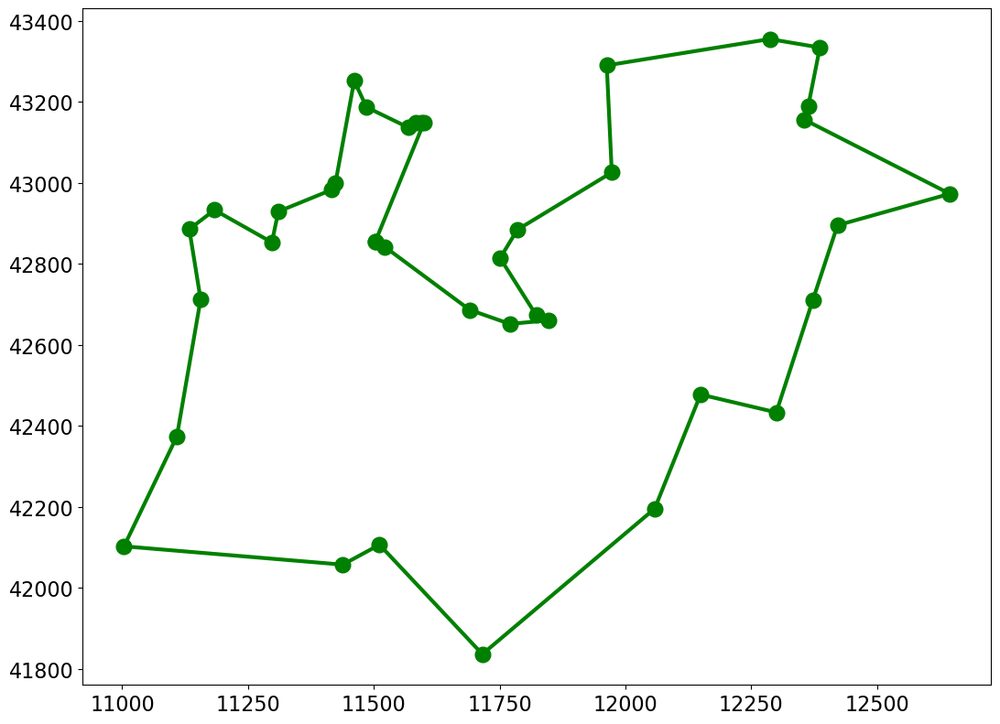

reading tour eil51
reading optimal tour eil51.opt.tour
reading done 426.0
1 relative error quick tour:  4.460093896713615 %
2 relative error quick tour:  3.755868544600939 %
3 relative error quick tour:  5.164319248826291 %
4 relative error quick tour:  6.338028169014085 %
5 relative error quick tour:  9.859154929577464 %
6 relative error quick tour:  6.103286384976526 %
7 relative error quick tour:  4.460093896713615 %
8 relative error quick tour:  4.460093896713615 %
9 relative error quick tour:  5.633802816901408 %
10 relative error quick tour:  6.807511737089202 %
relative error quick tour  3.755868544600939 %


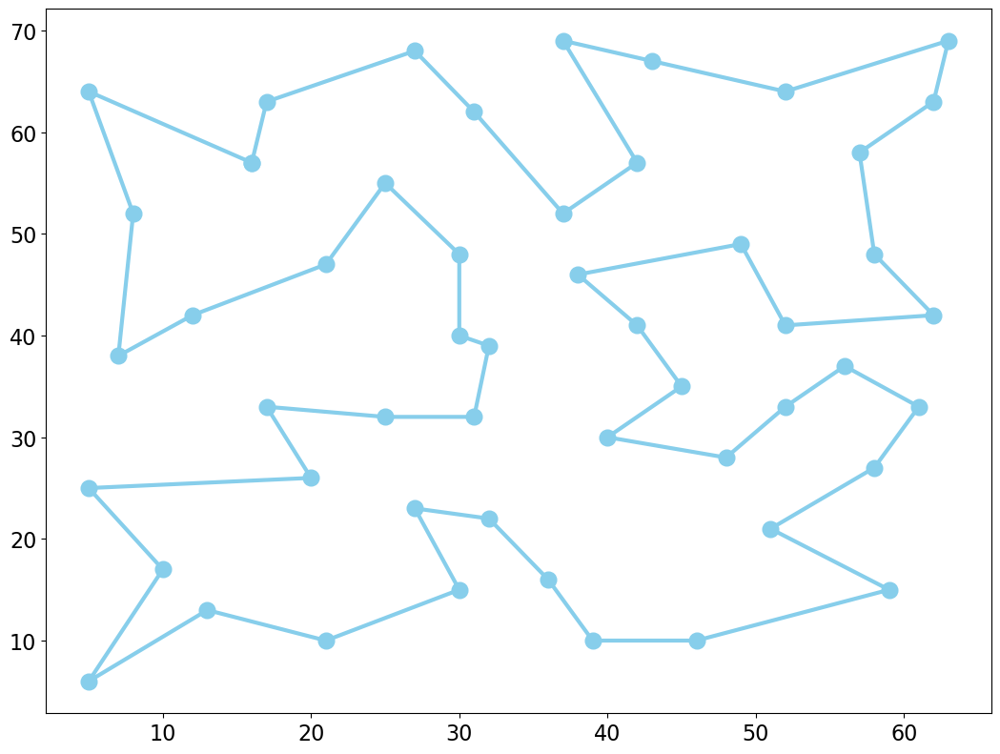

1 relative error closest neighbor:  29.107981220657276 %
2 relative error closest neighbor:  19.248826291079812 %
3 relative error closest neighbor:  34.27230046948357 %
4 relative error closest neighbor:  45.539906103286384 %
5 relative error closest neighbor:  43.89671361502347 %
6 relative error closest neighbor:  43.89671361502347 %
7 relative error closest neighbor:  25.35211267605634 %
8 relative error closest neighbor:  40.610328638497656 %
9 relative error closest neighbor:  38.732394366197184 %
10 relative error closest neighbor:  25.11737089201878 %
relative error closest-neighbor tour:  19.248826291079812 %


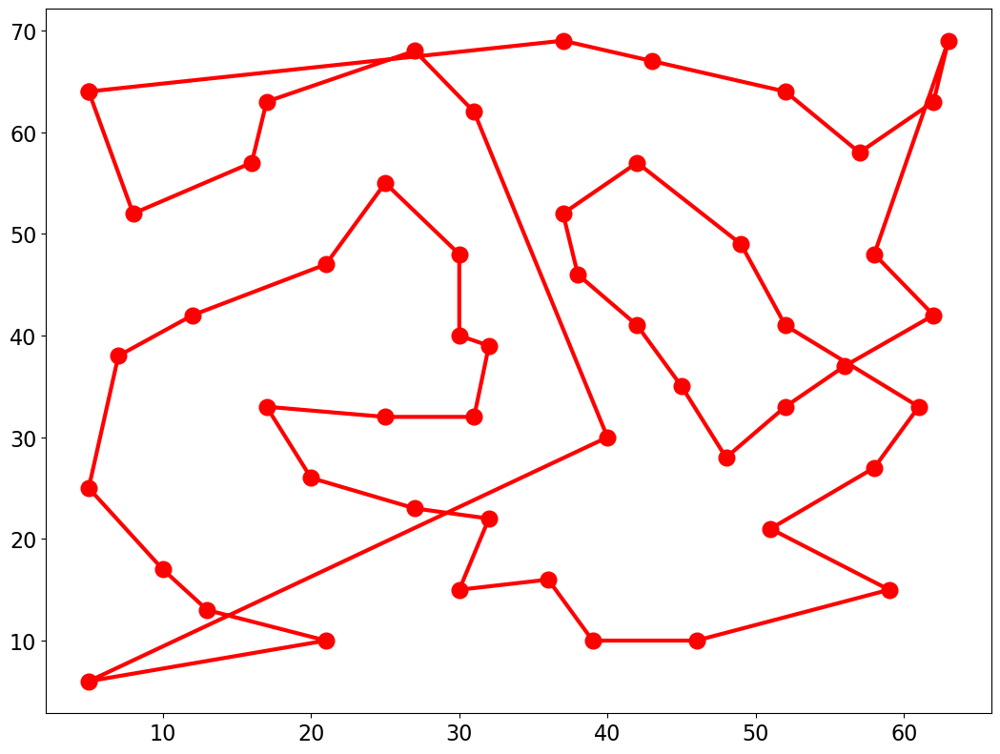

relative error pair-center tour:  14.788732394366198 %


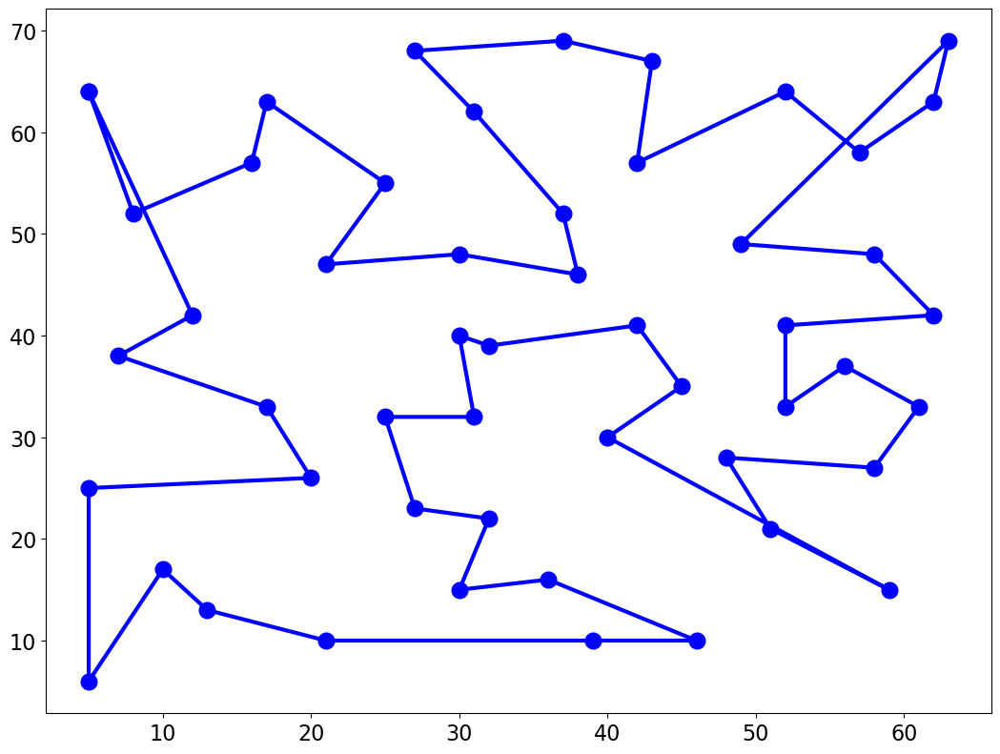

Minimum of objective function: 435.8616719504729
Mean of objective function: 449.702406563913
Variance of objective function: 63.74118433743091
relative error genetic algorithm:  1.6431924882629108 %


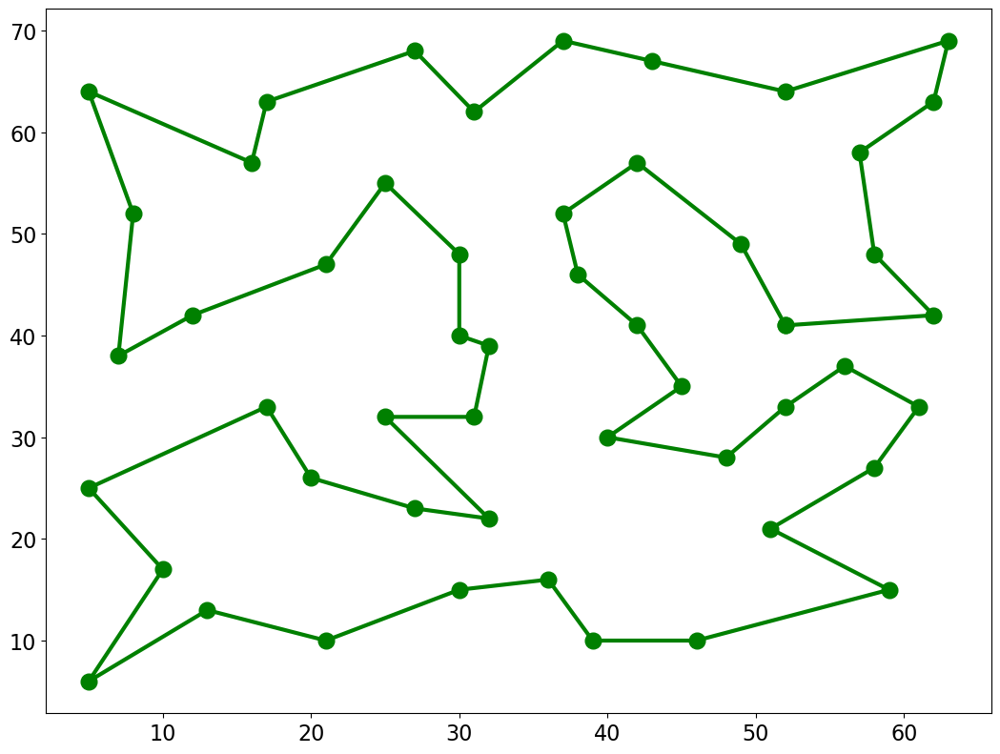

reading tour eil76
reading optimal tour eil76.opt.tour
reading done 538.0
1 relative error quick tour:  9.851301115241636 %
2 relative error quick tour:  8.550185873605948 %
3 relative error quick tour:  5.762081784386617 %
4 relative error quick tour:  9.293680297397769 %
5 relative error quick tour:  11.338289962825279 %
6 relative error quick tour:  10.594795539033457 %
7 relative error quick tour:  5.5762081784386615 %
8 relative error quick tour:  9.66542750929368 %
9 relative error quick tour:  9.66542750929368 %
10 relative error quick tour:  9.479553903345725 %
relative error quick tour  5.5762081784386615 %


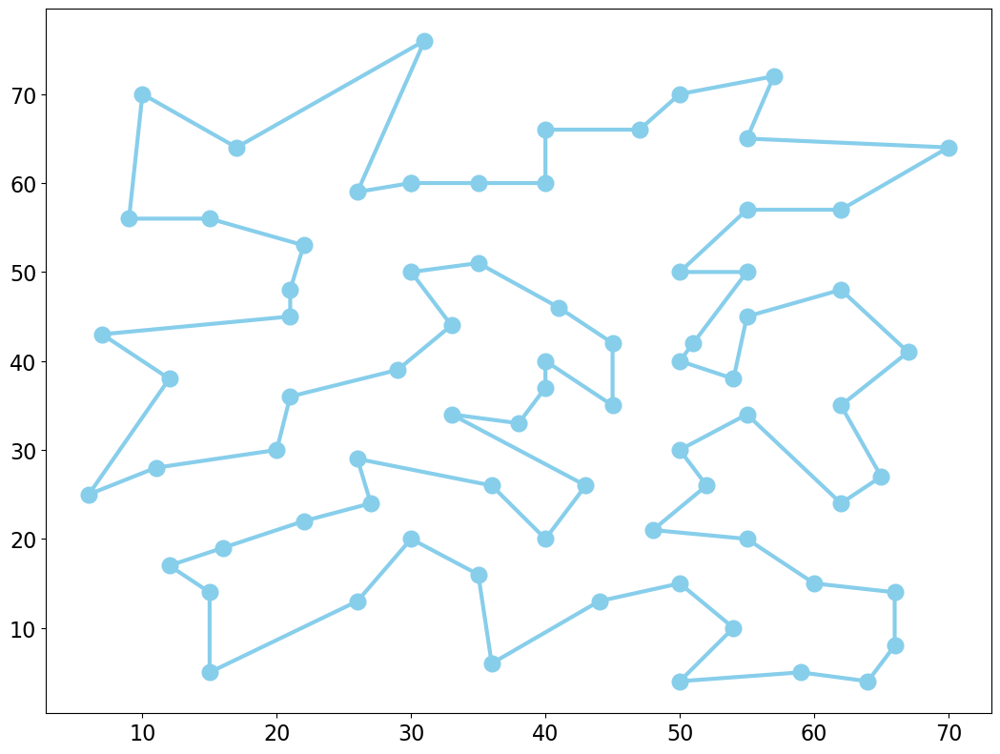

1 relative error closest neighbor:  17.843866171003718 %
2 relative error closest neighbor:  29.36802973977695 %
3 relative error closest neighbor:  29.925650557620816 %
4 relative error closest neighbor:  16.728624535315983 %
5 relative error closest neighbor:  18.401486988847584 %
6 relative error closest neighbor:  24.349442379182157 %
7 relative error closest neighbor:  20.44609665427509 %
8 relative error closest neighbor:  29.36802973977695 %
9 relative error closest neighbor:  32.71375464684015 %
10 relative error closest neighbor:  19.33085501858736 %
relative error closest-neighbor tour:  16.728624535315983 %


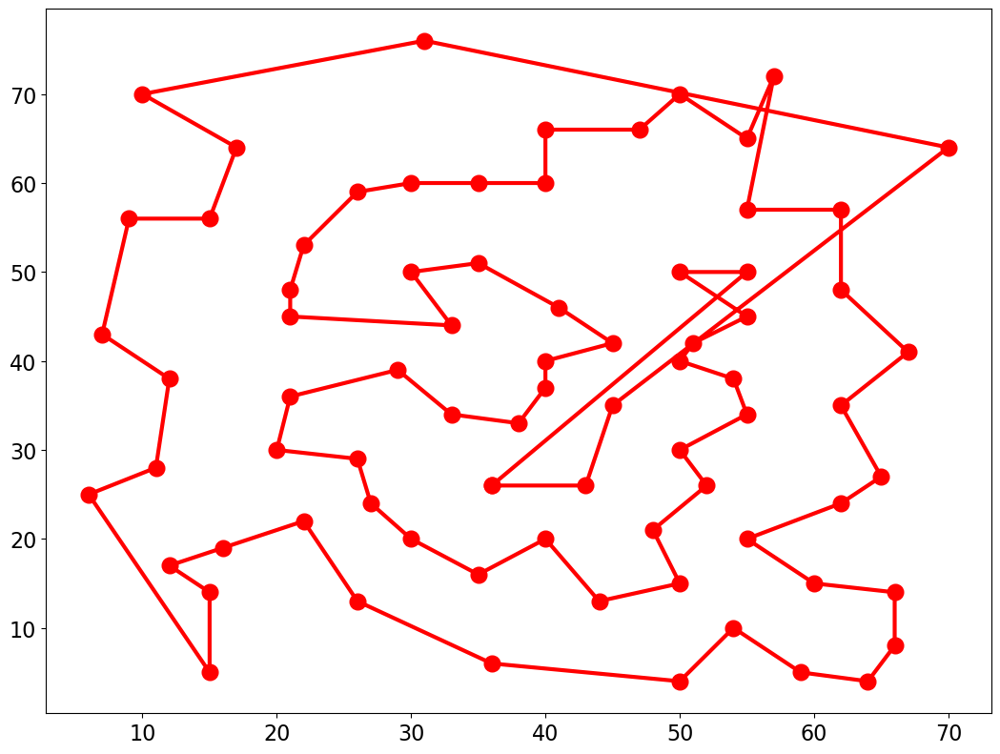

relative error pair-center tour:  8.736059479553903 %


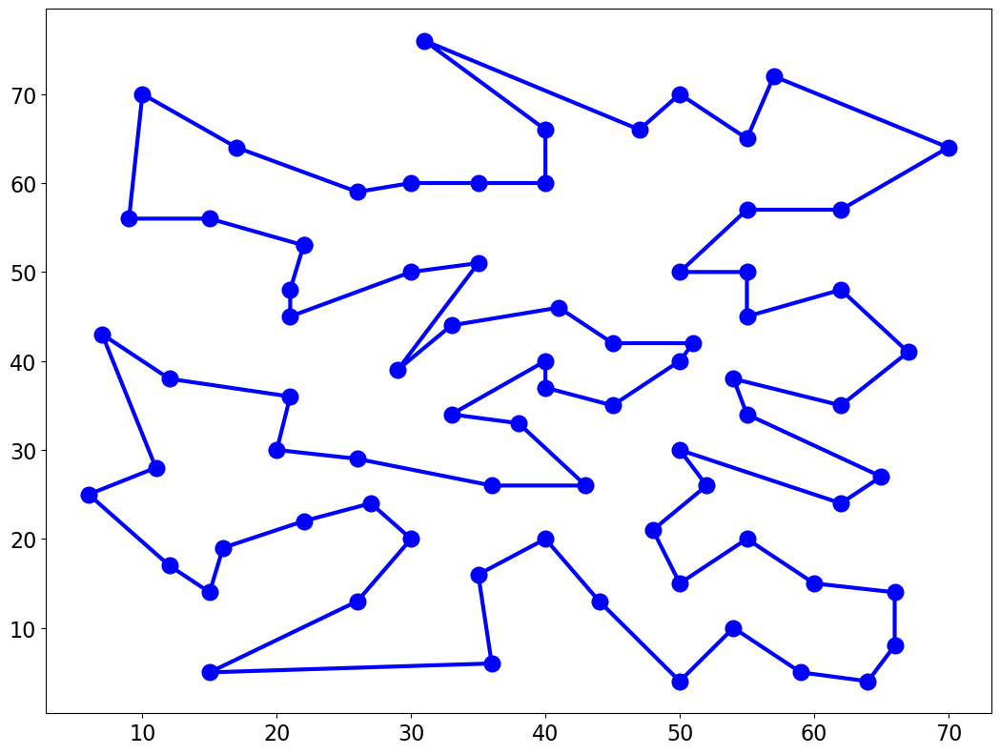

Minimum of objective function: 568.3493528649171
Mean of objective function: 594.3340961878741
Variance of objective function: 236.3147965318836
relative error genetic algorithm:  4.83271375464684 %


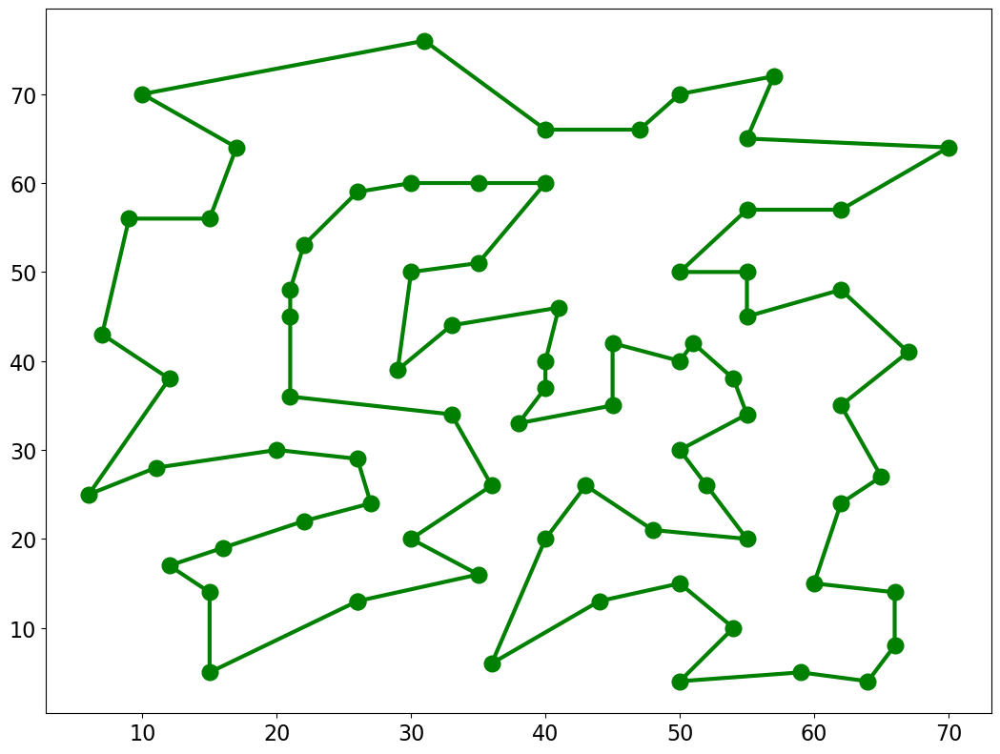

reading tour kroA100
reading optimal tour kroA100.opt.tour
reading done 21282.0
1 relative error quick tour:  6.644112395451556 %
2 relative error quick tour:  4.153744948783009 %
3 relative error quick tour:  5.897002161450992 %
4 relative error quick tour:  9.86749365661122 %
5 relative error quick tour:  8.641105159289541 %
6 relative error quick tour:  5.817122450897472 %
7 relative error quick tour:  5.591579738746359 %
8 relative error quick tour:  4.1678413682924536 %
9 relative error quick tour:  9.980265012686777 %
10 relative error quick tour:  7.41471666196786 %
relative error quick tour  4.153744948783009 %


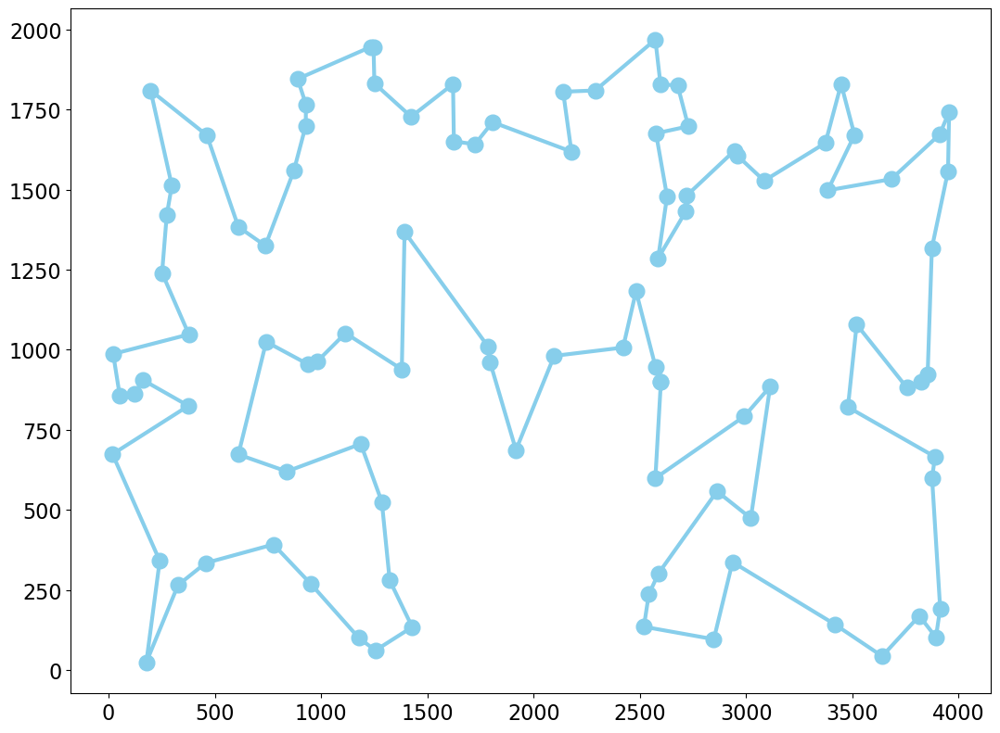

1 relative error closest neighbor:  23.141622028004885 %
2 relative error closest neighbor:  23.83704539047082 %
3 relative error closest neighbor:  31.641762992199983 %
4 relative error closest neighbor:  23.404755192181184 %
5 relative error closest neighbor:  25.843435767315103 %
6 relative error closest neighbor:  31.167183535382012 %
7 relative error closest neighbor:  23.52222535475989 %
8 relative error closest neighbor:  20.510290386241895 %
9 relative error closest neighbor:  31.641762992199983 %
10 relative error closest neighbor:  23.385959966168592 %
relative error closest-neighbor tour:  20.510290386241895 %


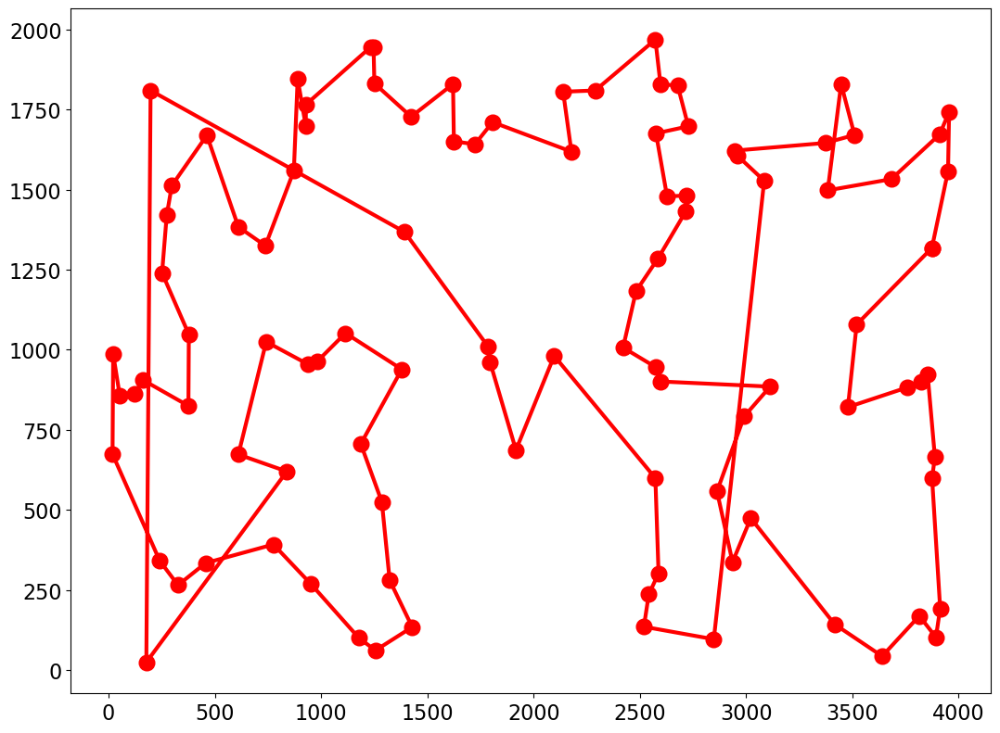

relative error pair-center tour:  12.738464430034771 %


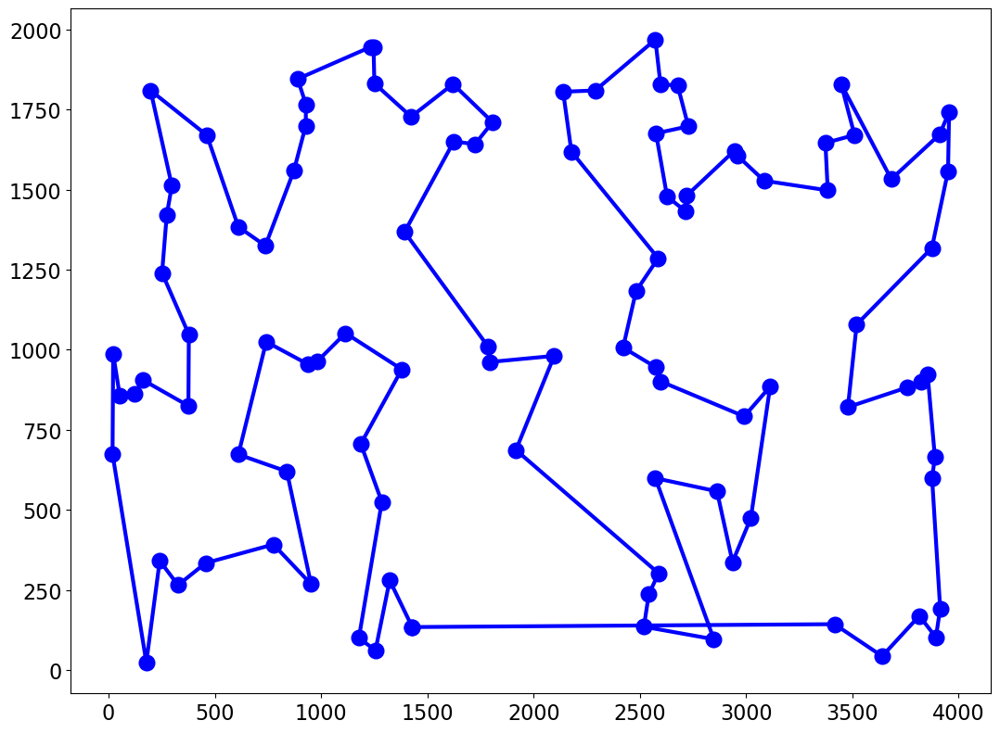

Minimum of objective function: 22341.472317611715
Mean of objective function: 23389.06657046829
Variance of objective function: 339183.1544764462
relative error genetic algorithm:  4.966638473827648 %


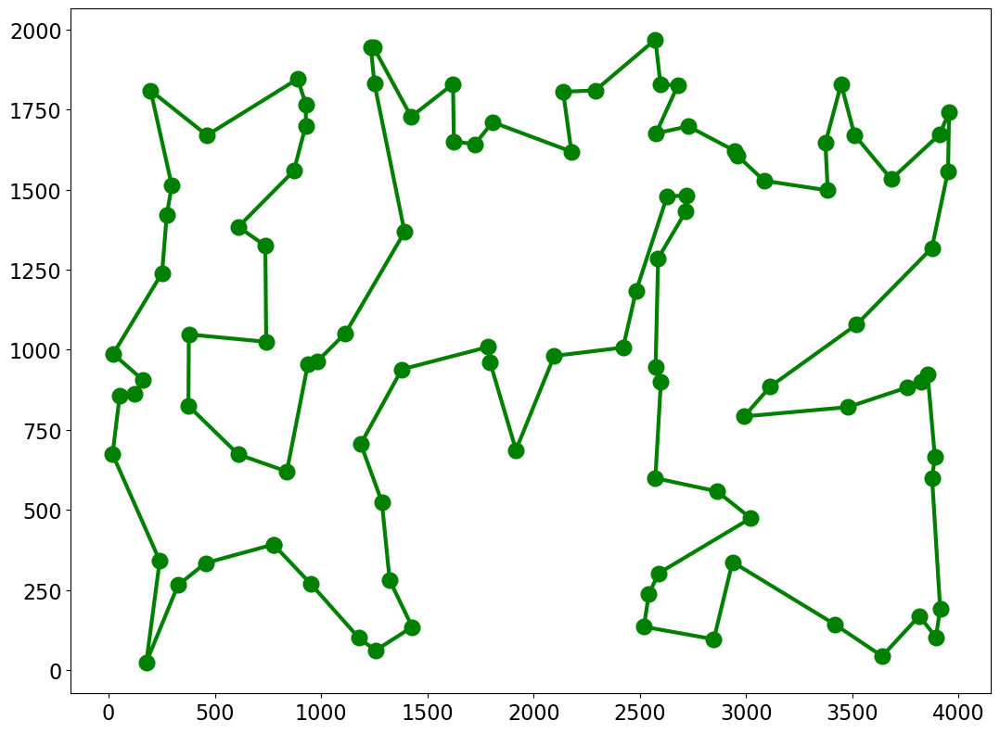

reading tour kroB100
reading optimal tour kroB100.pc.opt.tour
reading done 22141.0
strange best tour given 165563.0
1 relative error quick tour:  4.602321485027777 %
2 relative error quick tour:  8.20649473826837 %
3 relative error quick tour:  7.4793369766496545 %
4 relative error quick tour:  9.805338512262319 %
5 relative error quick tour:  11.697755295605438 %
6 relative error quick tour:  8.048416964003433 %
7 relative error quick tour:  10.415067070141367 %
8 relative error quick tour:  11.259654035499752 %
9 relative error quick tour:  4.796531321981844 %
10 relative error quick tour:  7.813558556524096 %
relative error quick tour  4.602321485027777 %


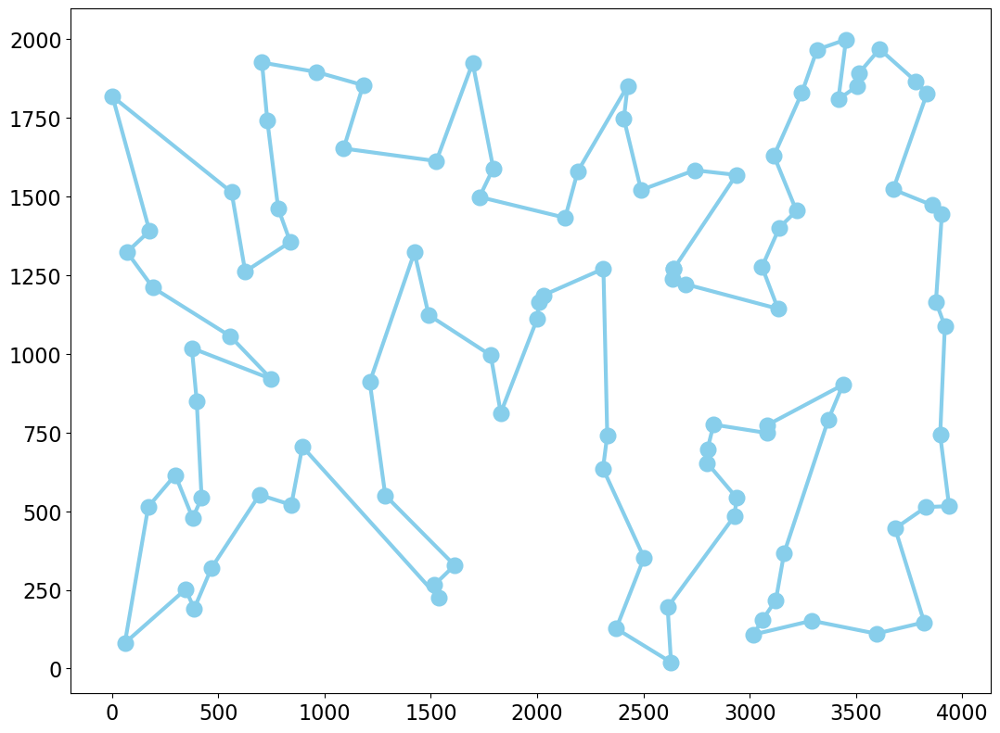

1 relative error closest neighbor:  24.172349939027143 %
2 relative error closest neighbor:  33.52152115983921 %
3 relative error closest neighbor:  24.64206675398582 %
4 relative error closest neighbor:  25.400840070457523 %
5 relative error closest neighbor:  27.11711304819114 %
6 relative error closest neighbor:  24.375592791653492 %
7 relative error closest neighbor:  29.673456483446998 %
8 relative error closest neighbor:  20.450747482046882 %
9 relative error closest neighbor:  29.086310464748657 %
10 relative error closest neighbor:  25.897655932433043 %
relative error closest-neighbor tour:  20.450747482046882 %


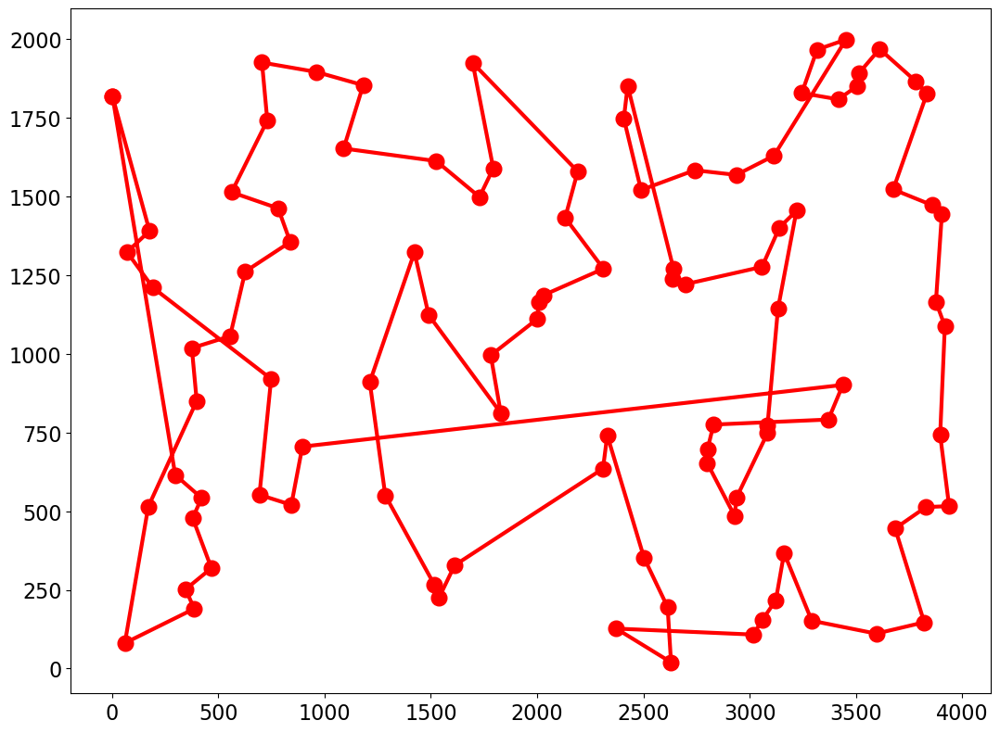

relative error pair-center tour:  12.090691477349713 %


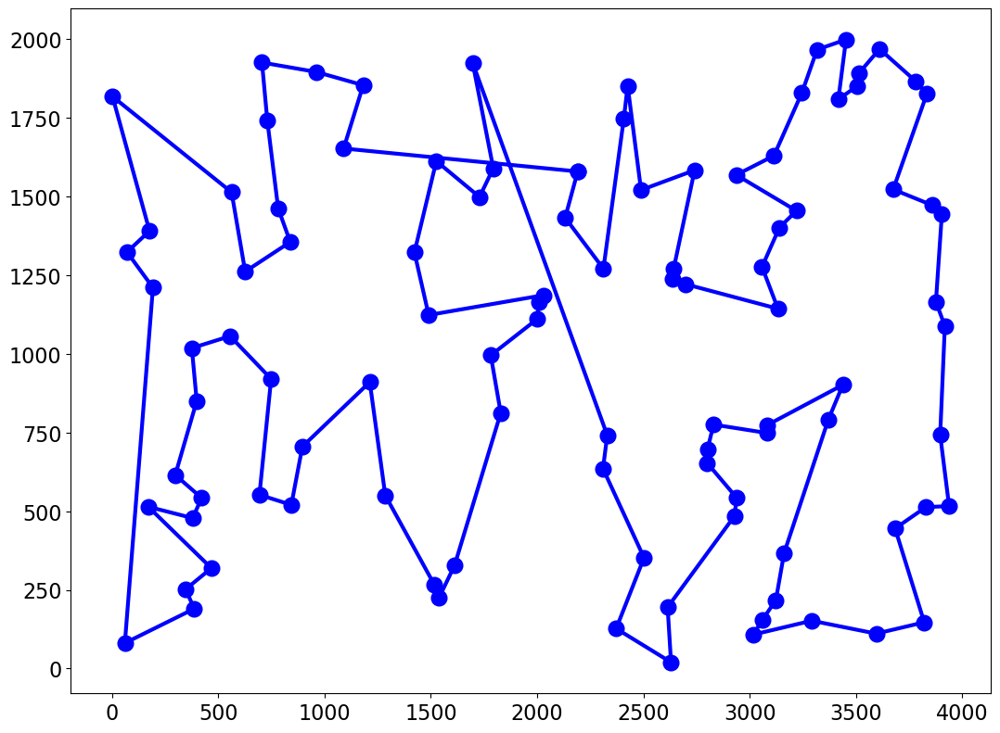

Minimum of objective function: 22755.160519802772
Mean of objective function: 23865.907992634093
Variance of objective function: 333124.5527650054
relative error genetic algorithm:  2.7776523192267737 %


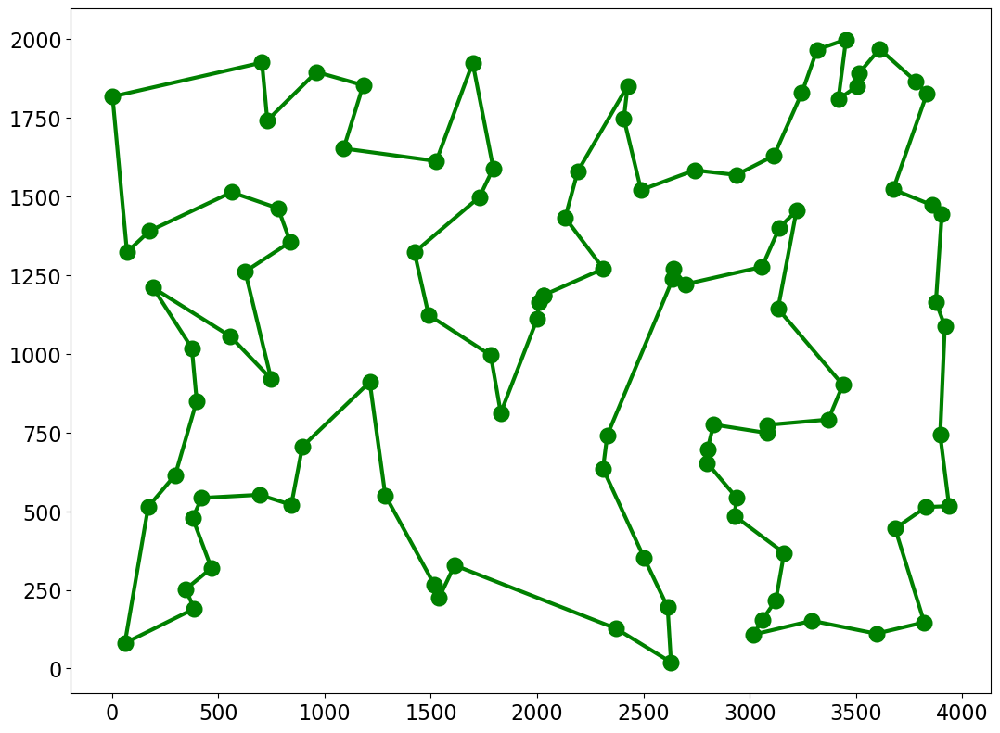

reading tour kroC100
reading optimal tour kroC100.opt.tour
reading done 20749.0
1 relative error quick tour:  10.212540363391007 %
2 relative error quick tour:  7.957009976384404 %
3 relative error quick tour:  9.528170032290713 %
4 relative error quick tour:  9.730589425996433 %
5 relative error quick tour:  10.053496554050797 %
6 relative error quick tour:  9.923369800954262 %
7 relative error quick tour:  5.889440454961685 %
8 relative error quick tour:  7.359390814015133 %
9 relative error quick tour:  10.125789194659983 %
10 relative error quick tour:  7.417224926502482 %
relative error quick tour  5.889440454961685 %


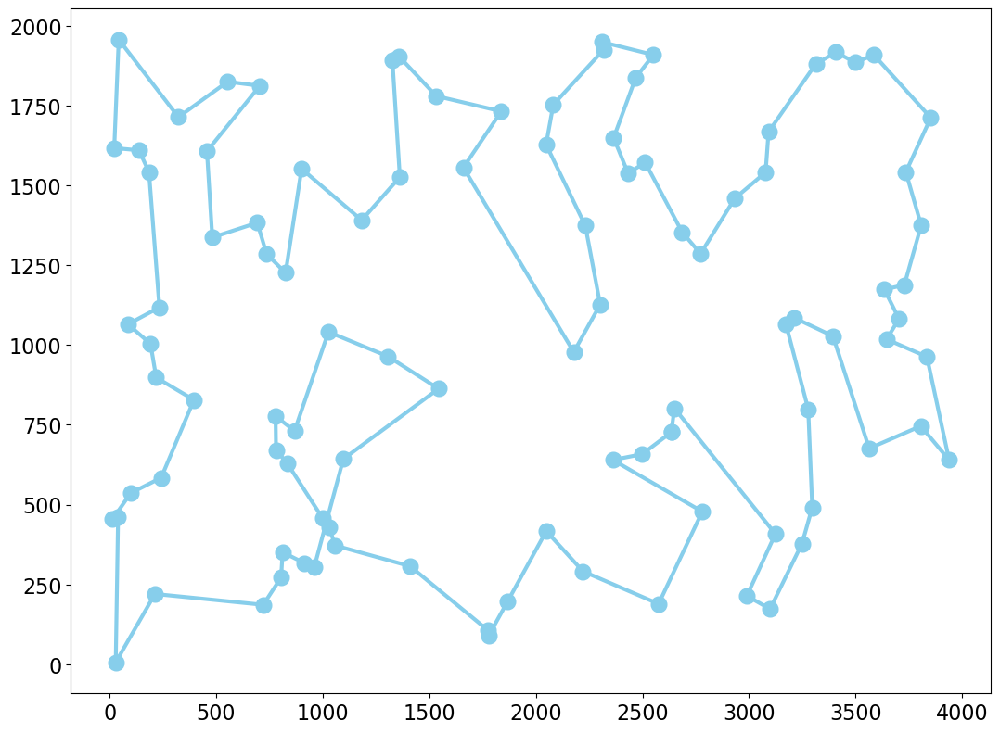

1 relative error closest neighbor:  16.95021446816714 %
2 relative error closest neighbor:  25.919321413080148 %
3 relative error closest neighbor:  37.327100101209695 %
4 relative error closest neighbor:  26.516940575449418 %
5 relative error closest neighbor:  33.04255626777194 %
6 relative error closest neighbor:  21.68297267338185 %
7 relative error closest neighbor:  22.015518820184106 %
8 relative error closest neighbor:  33.04255626777194 %
9 relative error closest neighbor:  27.98207142512892 %
10 relative error closest neighbor:  22.352884476360305 %
relative error closest-neighbor tour:  16.95021446816714 %


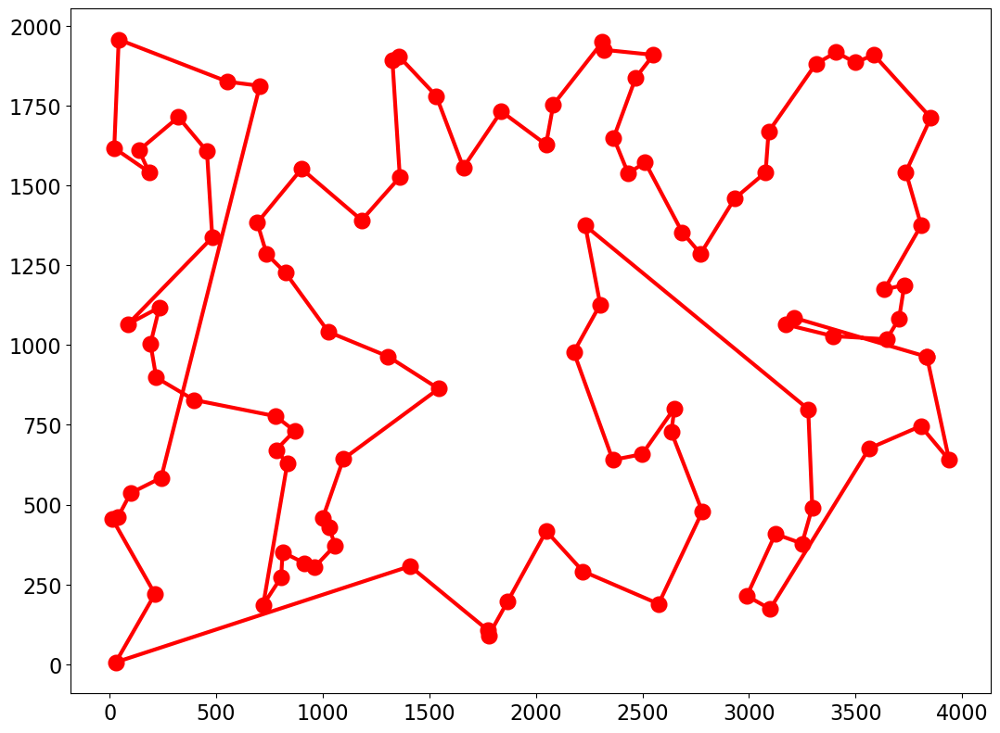

relative error pair-center tour:  3.711022217938214 %


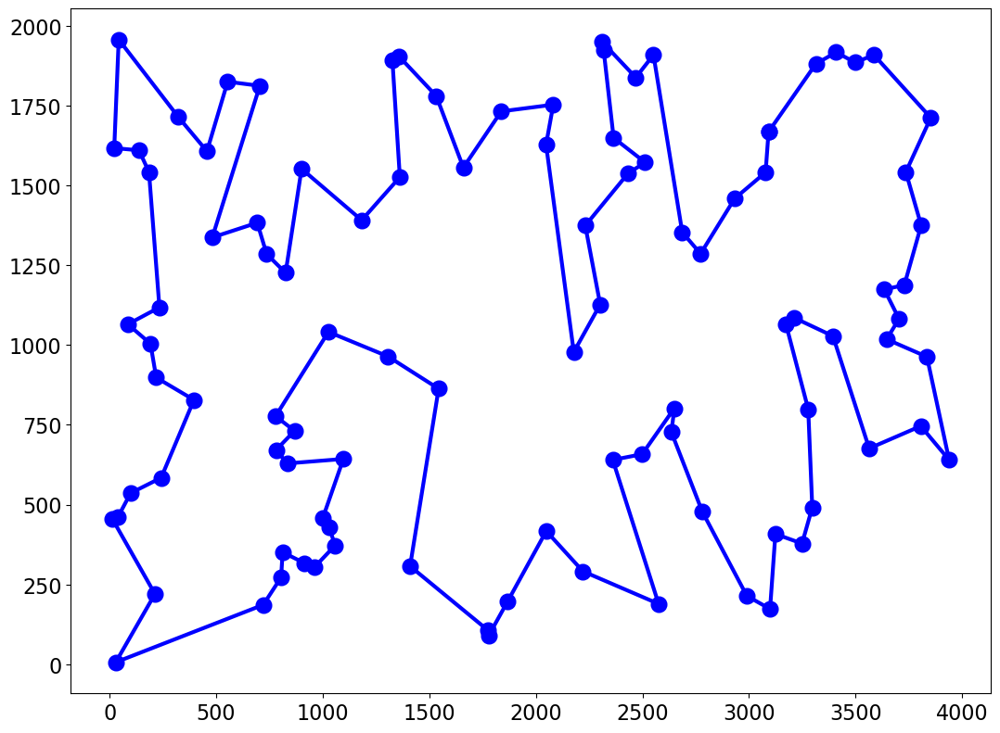

Minimum of objective function: 21348.14268555988
Mean of objective function: 22676.57853552748
Variance of objective function: 523790.4642871026
relative error genetic algorithm:  2.8917056243674395 %


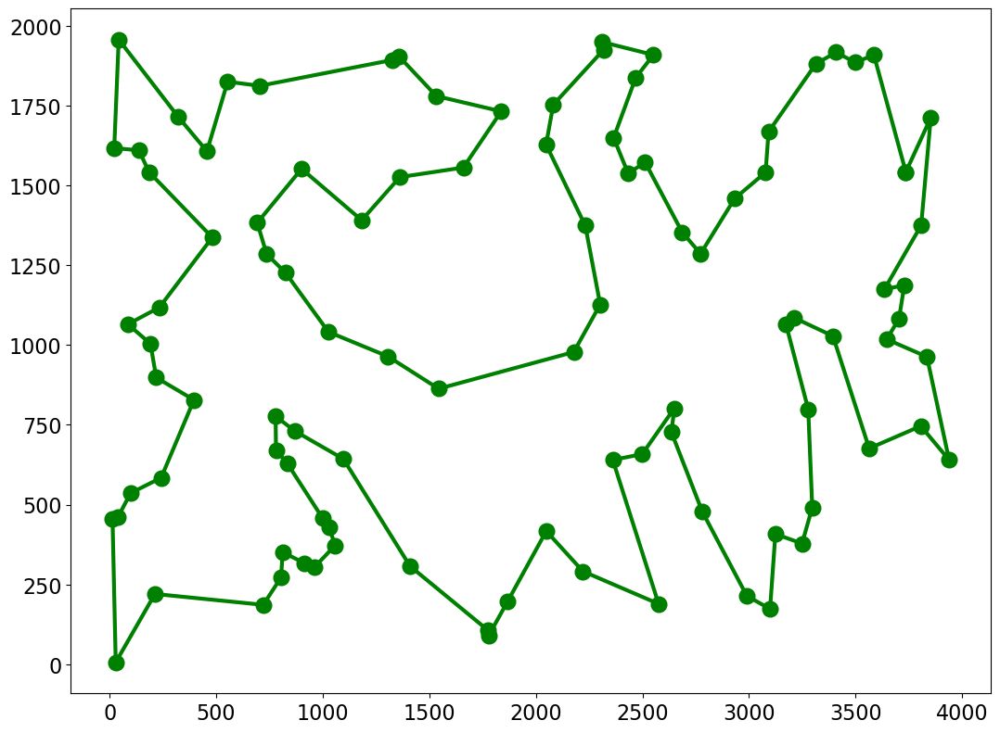

reading tour kroD100
reading optimal tour kroD100.opt.tour
reading done 21294.0
1 relative error quick tour:  12.529350990889453 %
2 relative error quick tour:  11.566638489715412 %
3 relative error quick tour:  15.332957640649948 %
4 relative error quick tour:  8.547008547008547 %
5 relative error quick tour:  9.627125011740397 %
6 relative error quick tour:  9.711655865502019 %
7 relative error quick tour:  7.997557997557998 %
8 relative error quick tour:  3.7522306753075982 %
9 relative error quick tour:  11.731004038696346 %
10 relative error quick tour:  9.650605804451958 %
relative error quick tour  3.7522306753075982 %


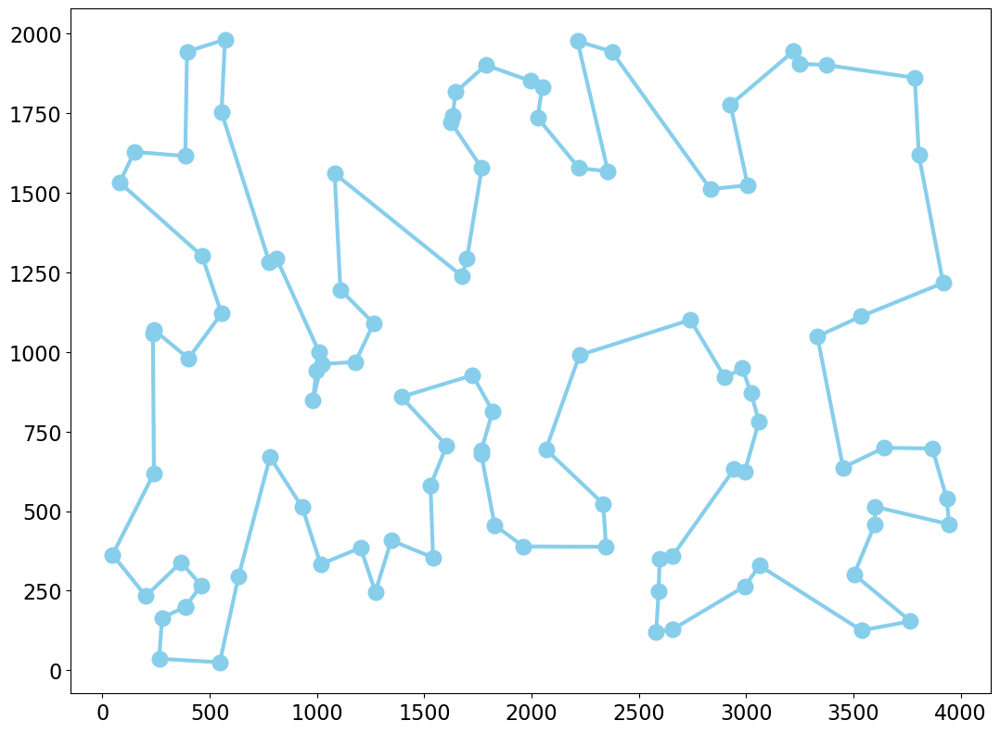

1 relative error closest neighbor:  17.587113740959897 %
2 relative error closest neighbor:  37.11843711843712 %
3 relative error closest neighbor:  33.55874894336433 %
4 relative error closest neighbor:  32.18747064900911 %
5 relative error closest neighbor:  31.06978491593876 %
6 relative error closest neighbor:  32.276697661313044 %
7 relative error closest neighbor:  40.87536395228703 %
8 relative error closest neighbor:  18.81281112050343 %
9 relative error closest neighbor:  40.847187001033156 %
10 relative error closest neighbor:  24.04433173663943 %
relative error closest-neighbor tour:  17.587113740959897 %


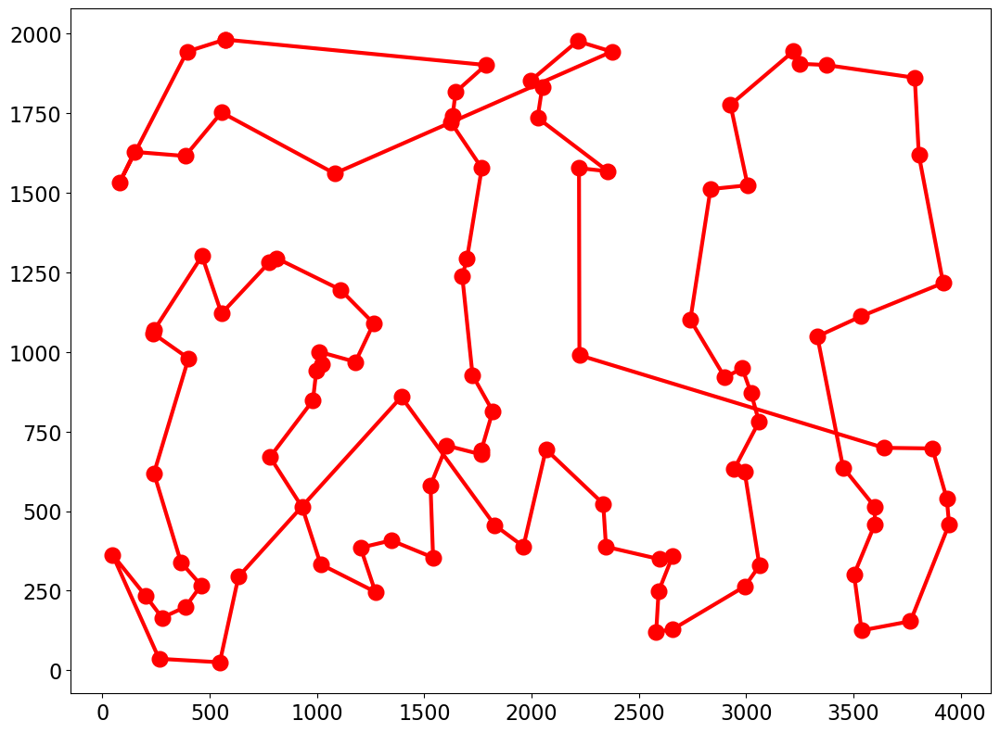

relative error pair-center tour:  12.548135625058702 %


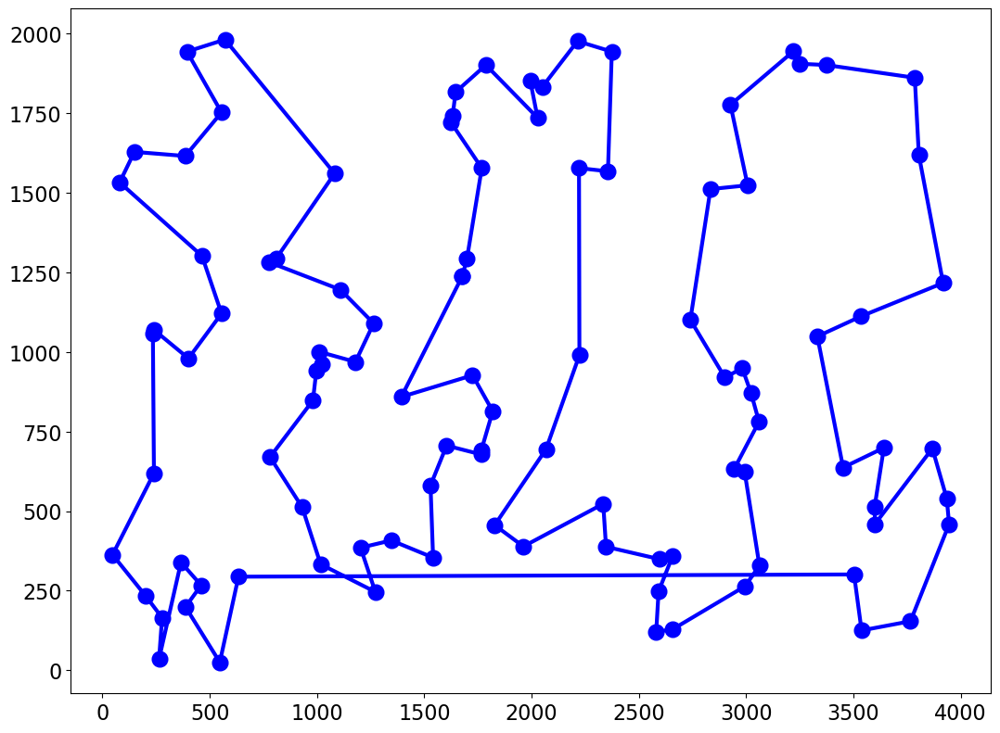

Minimum of objective function: 23077.858460823118
Mean of objective function: 23532.20805388247
Variance of objective function: 96460.17450388291
relative error genetic algorithm:  8.363858363858364 %


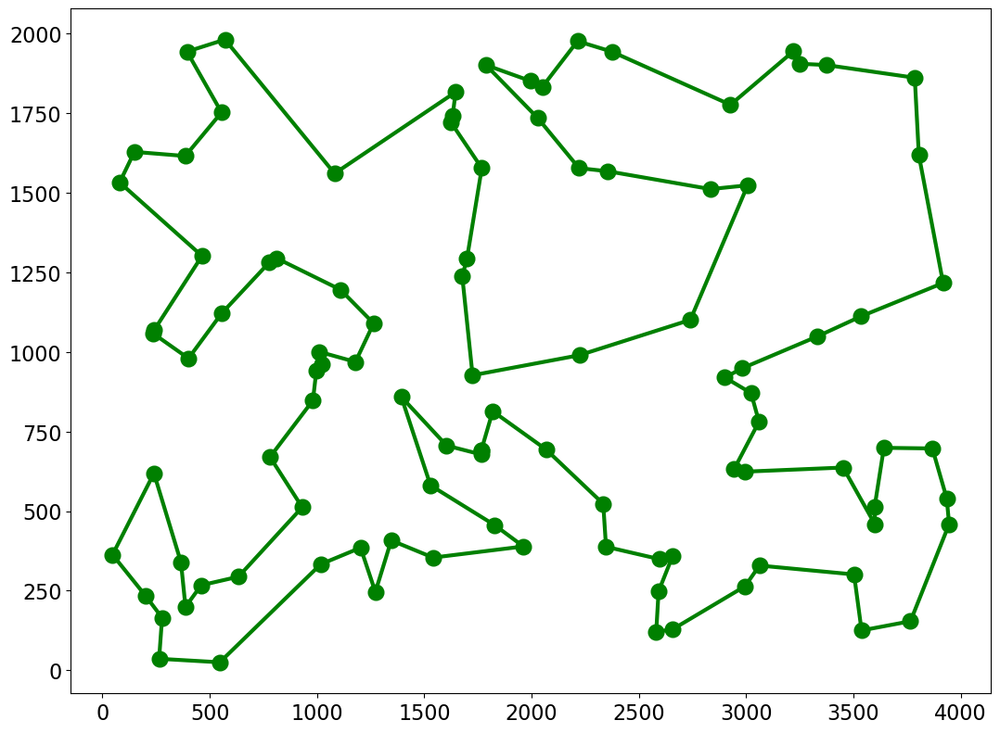

reading tour pr76
reading optimal tour pr76.opt.tour
reading done 108159.0
1 relative error quick tour:  11.031906729906897 %
2 relative error quick tour:  8.850858458380717 %
3 relative error quick tour:  7.565713440397933 %
4 relative error quick tour:  5.924610989376751 %
5 relative error quick tour:  8.419086714928946 %
6 relative error quick tour:  8.296119601697502 %
7 relative error quick tour:  12.251407649848833 %
8 relative error quick tour:  7.458463928105844 %
9 relative error quick tour:  6.236189313880491 %
10 relative error quick tour:  10.213666916299152 %
relative error quick tour  5.924610989376751 %


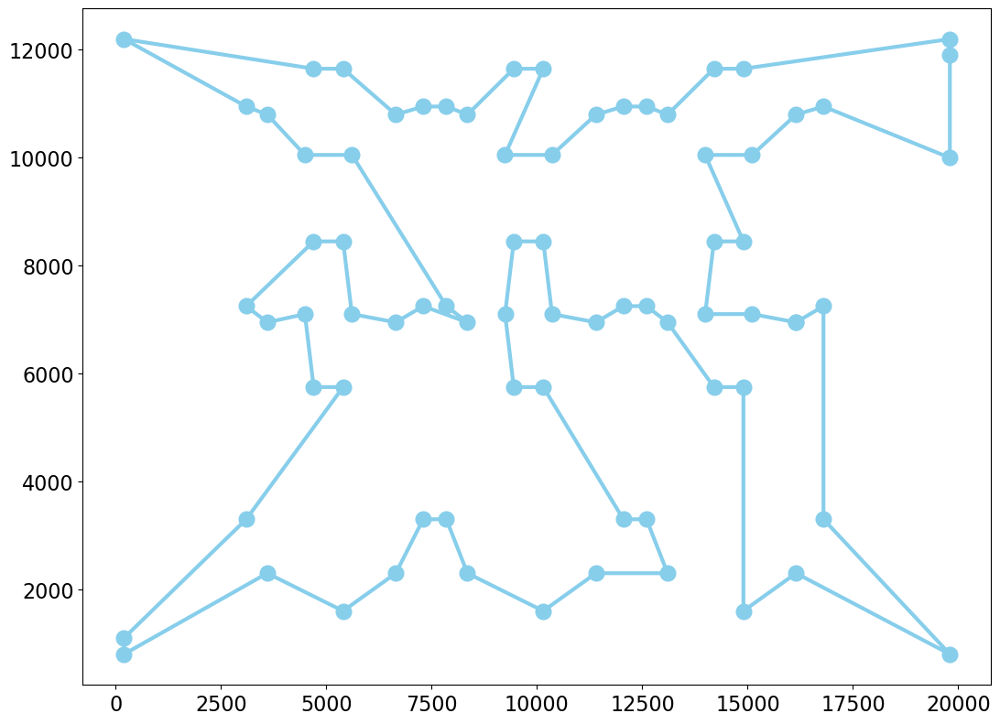

1 relative error closest neighbor:  45.22416072633808 %
2 relative error closest neighbor:  39.461348570160595 %
3 relative error closest neighbor:  28.185356743313086 %
4 relative error closest neighbor:  42.21747612311504 %
5 relative error closest neighbor:  37.15455949111956 %
6 relative error closest neighbor:  39.46319769968287 %
7 relative error closest neighbor:  42.21747612311504 %
8 relative error closest neighbor:  45.04849342172172 %
9 relative error closest neighbor:  38.286226758753315 %
10 relative error closest neighbor:  36.61276454109228 %
relative error closest-neighbor tour:  28.185356743313086 %


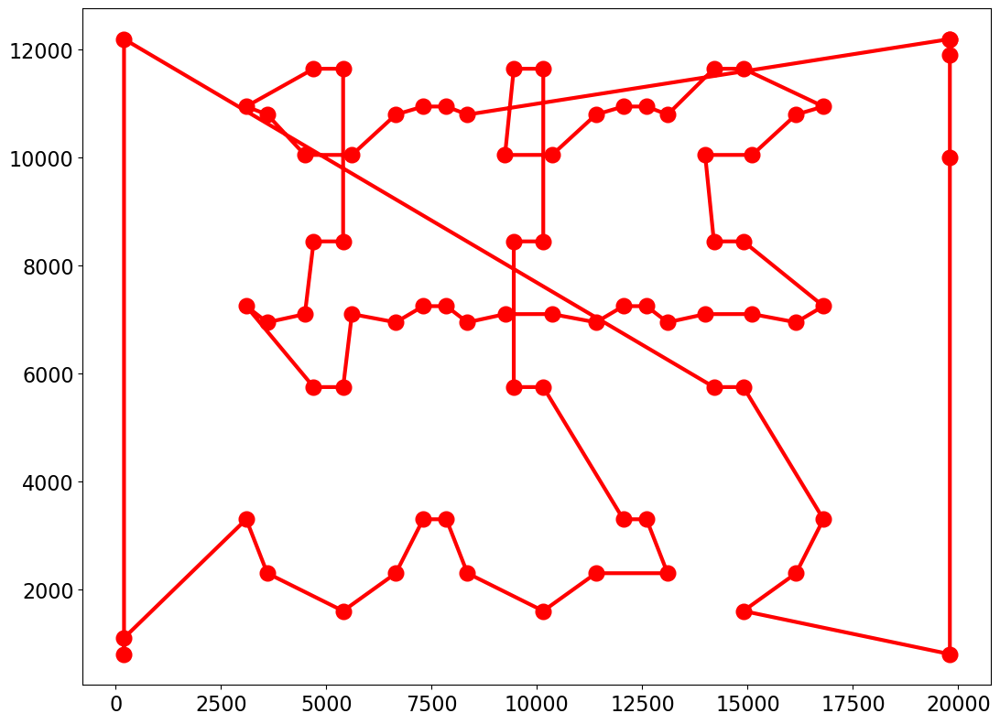

relative error pair-center tour:  13.423755766972697 %


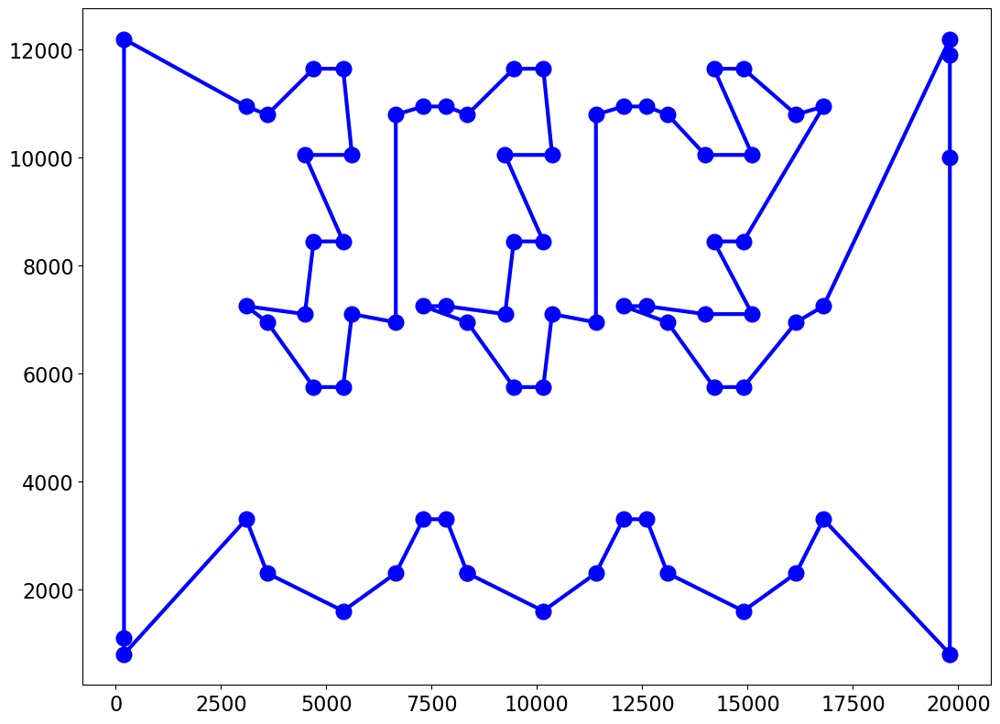

Minimum of objective function: 111611.63630799246
Mean of objective function: 116290.5241453144
Variance of objective function: 9194692.518639443
relative error genetic algorithm:  3.1915975554507714 %


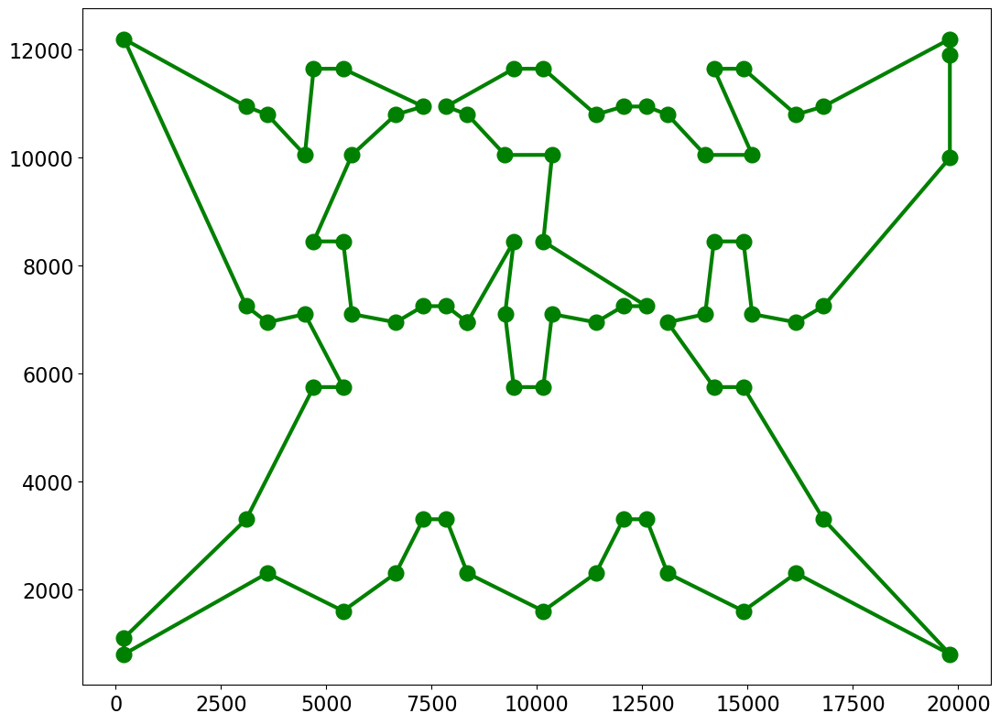

reading tour rat195
reading done 2323.0
1 relative error quick tour:  16.487300904003444 %
2 relative error quick tour:  16.4012053379251 %
3 relative error quick tour:  15.195867412828239 %
4 relative error quick tour:  14.119672836848903 %
5 relative error quick tour:  14.46405510116229 %
6 relative error quick tour:  13.129573826947912 %
7 relative error quick tour:  15.669393026259147 %
8 relative error quick tour:  14.119672836848903 %
9 relative error quick tour:  13.861386138613861 %
10 relative error quick tour:  13.732242789496341 %
relative error quick tour  13.129573826947912 %


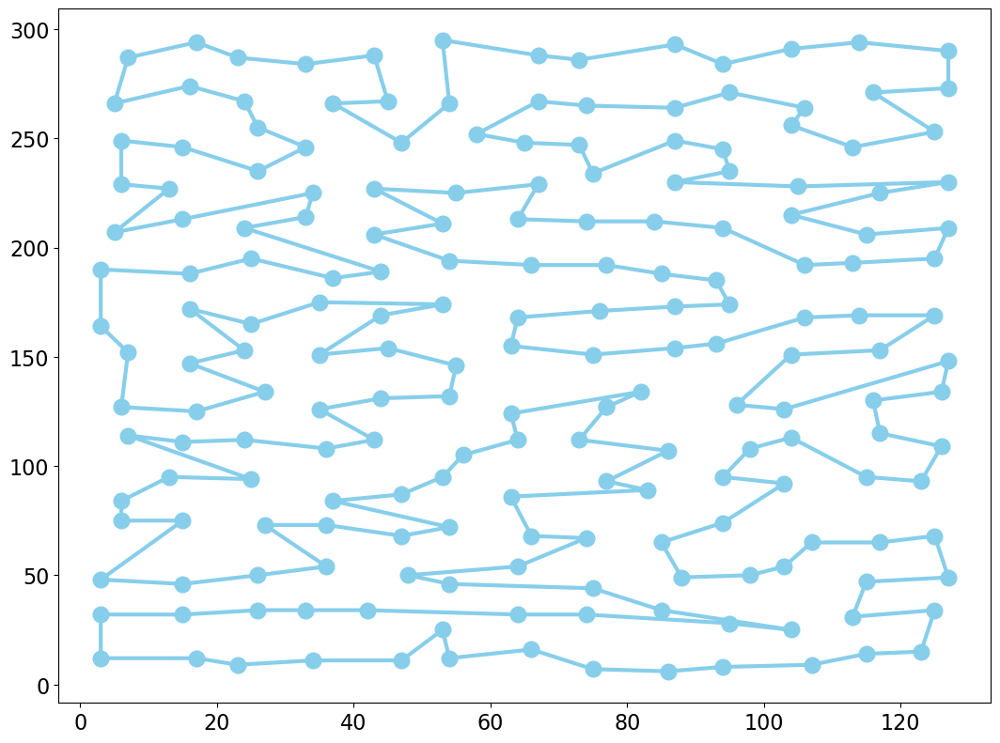

1 relative error closest neighbor:  18.338355574687903 %
2 relative error closest neighbor:  17.520447696943606 %
3 relative error closest neighbor:  16.358157554885924 %
4 relative error closest neighbor:  14.808437365475678 %
5 relative error closest neighbor:  14.162720619888075 %
6 relative error closest neighbor:  20.6198880757641 %
7 relative error closest neighbor:  19.629789065863108 %
8 relative error closest neighbor:  18.080068876452863 %
9 relative error closest neighbor:  19.629789065863108 %
10 relative error closest neighbor:  20.06026689625484 %
relative error closest-neighbor tour:  14.162720619888075 %


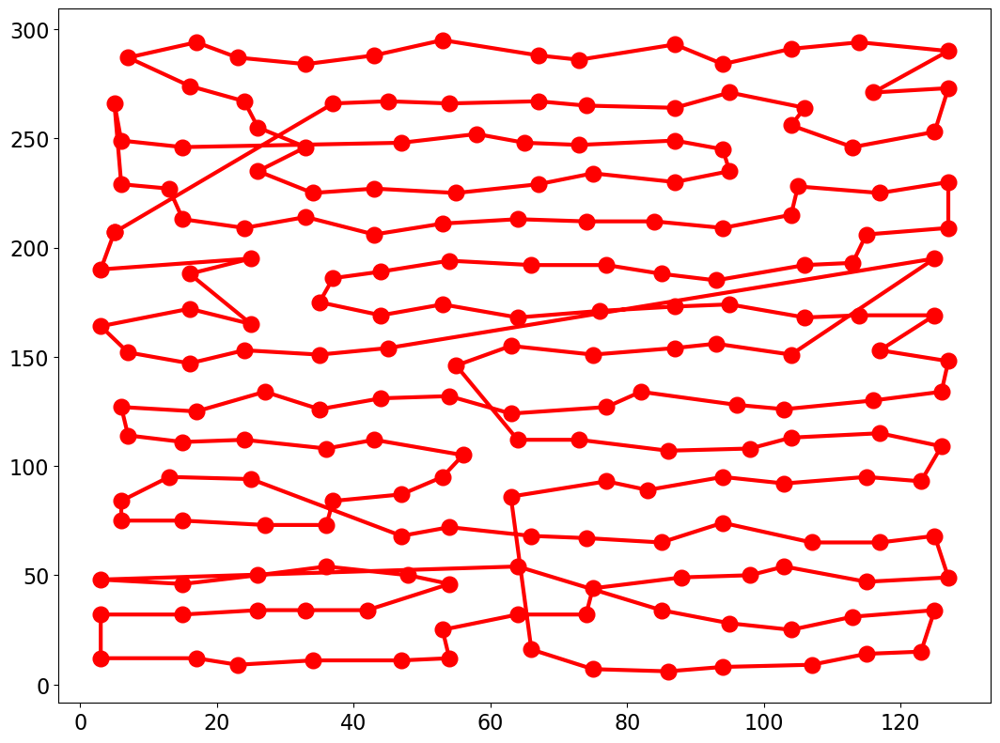

relative error pair-center tour:  16.874730951356007 %


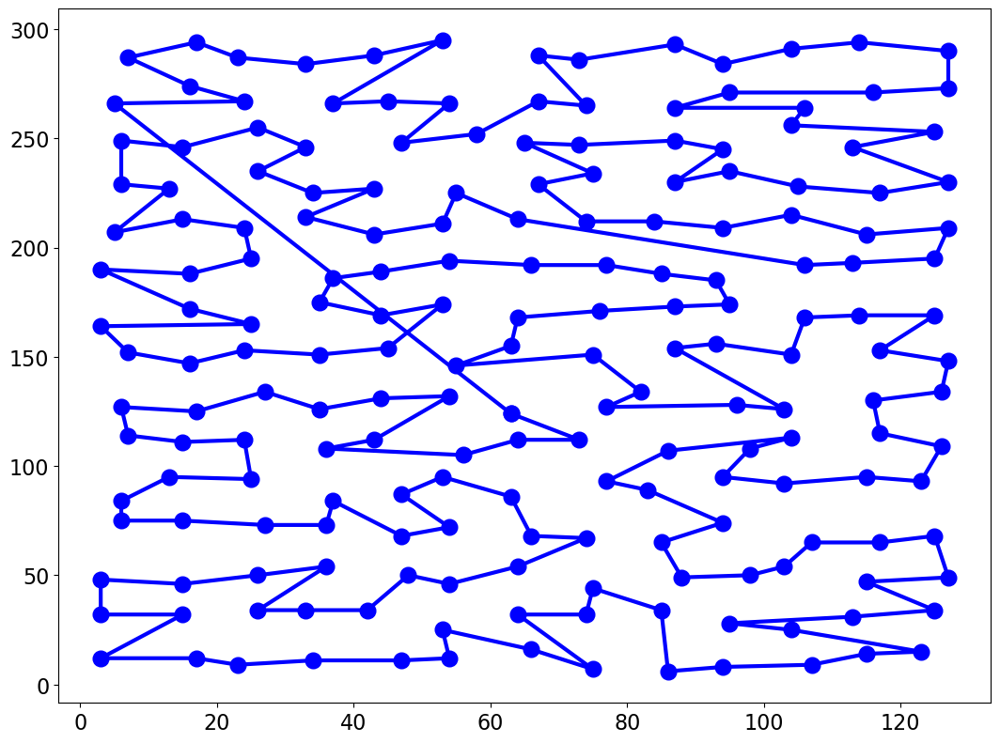

Minimum of objective function: 2994.3897776475187
Mean of objective function: 3126.646667289354
Variance of objective function: 4851.559190431161
relative error genetic algorithm:  28.626775721050365 %


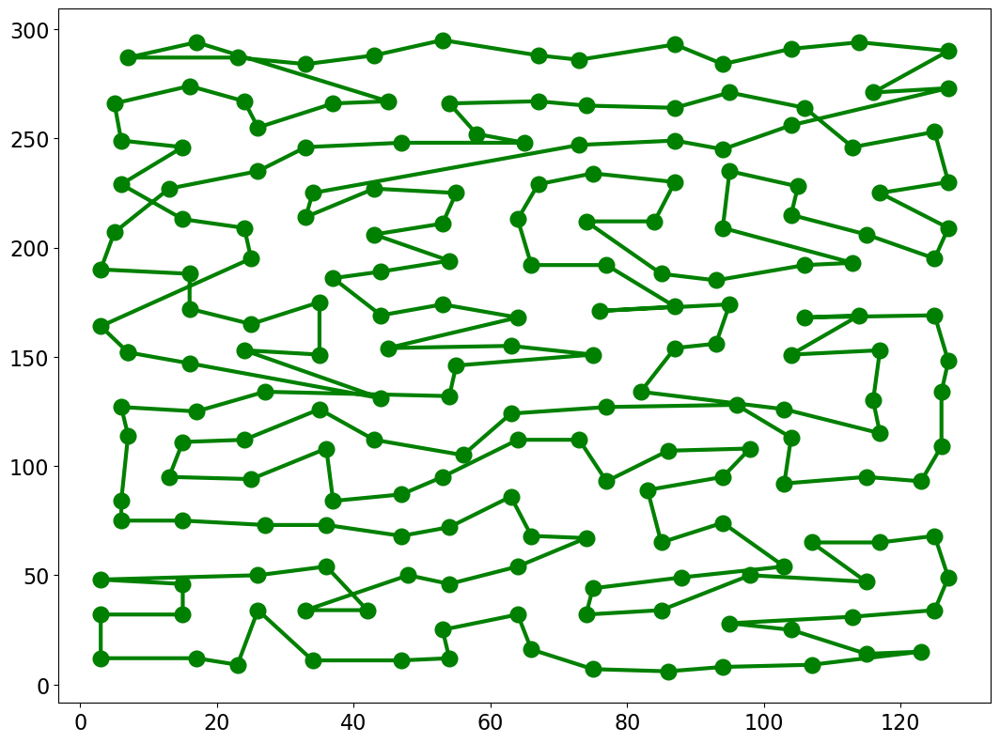

reading tour rat99
reading optimal tour rat99.pc.opt.tour
reading done 1211.0
1 relative error quick tour:  10.487200660611066 %
2 relative error quick tour:  13.542526837324525 %
3 relative error quick tour:  11.973575557390586 %
4 relative error quick tour:  17.753922378199835 %
5 relative error quick tour:  12.056151940545003 %
6 relative error quick tour:  12.22130470685384 %
7 relative error quick tour:  9.90916597853014 %
8 relative error quick tour:  13.294797687861271 %
9 relative error quick tour:  12.63418662262593 %
10 relative error quick tour:  14.45086705202312 %
relative error quick tour  9.90916597853014 %


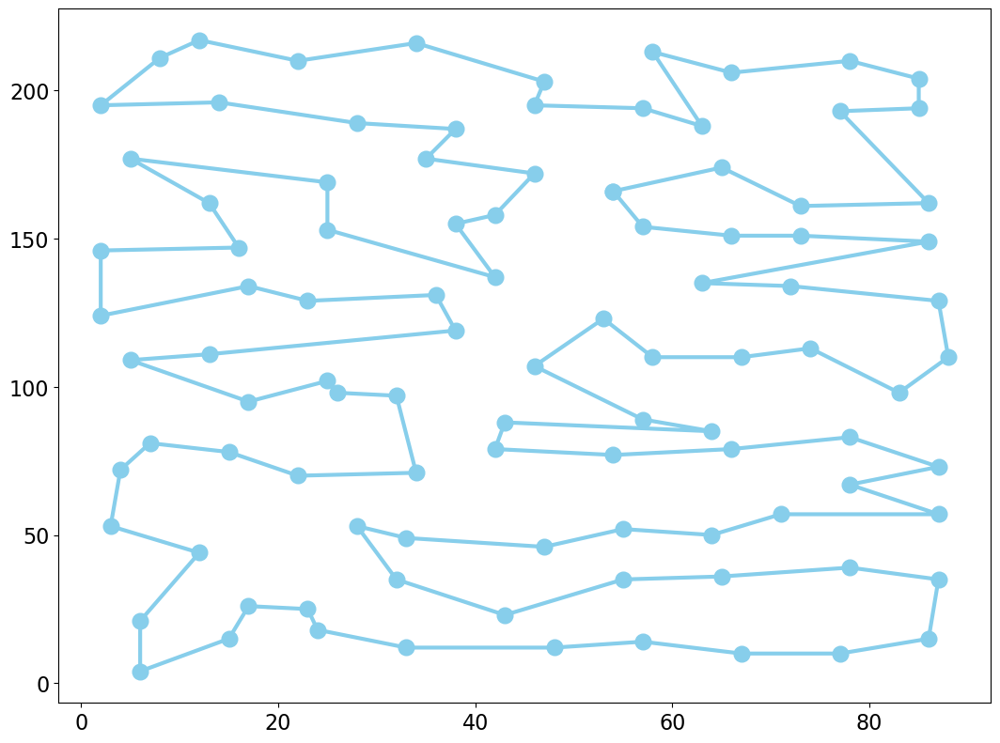

1 relative error closest neighbor:  21.222130470685386 %
2 relative error closest neighbor:  31.29644921552436 %
3 relative error closest neighbor:  18.579686209744015 %
4 relative error closest neighbor:  19.157720891824937 %
5 relative error closest neighbor:  22.13047068538398 %
6 relative error closest neighbor:  17.836498761354253 %
7 relative error closest neighbor:  18.33195706028076 %
8 relative error closest neighbor:  17.671345995045417 %
9 relative error closest neighbor:  28.2411230388109 %
10 relative error closest neighbor:  25.516102394715112 %
relative error closest-neighbor tour:  17.671345995045417 %


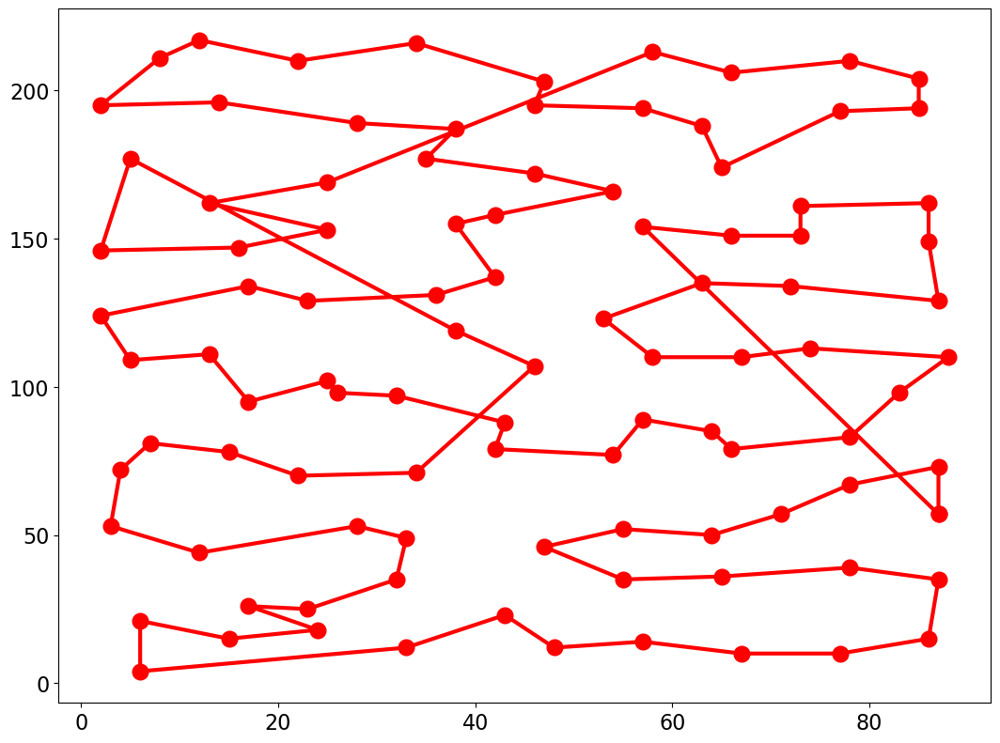

relative error pair-center tour:  21.800165152766308 %


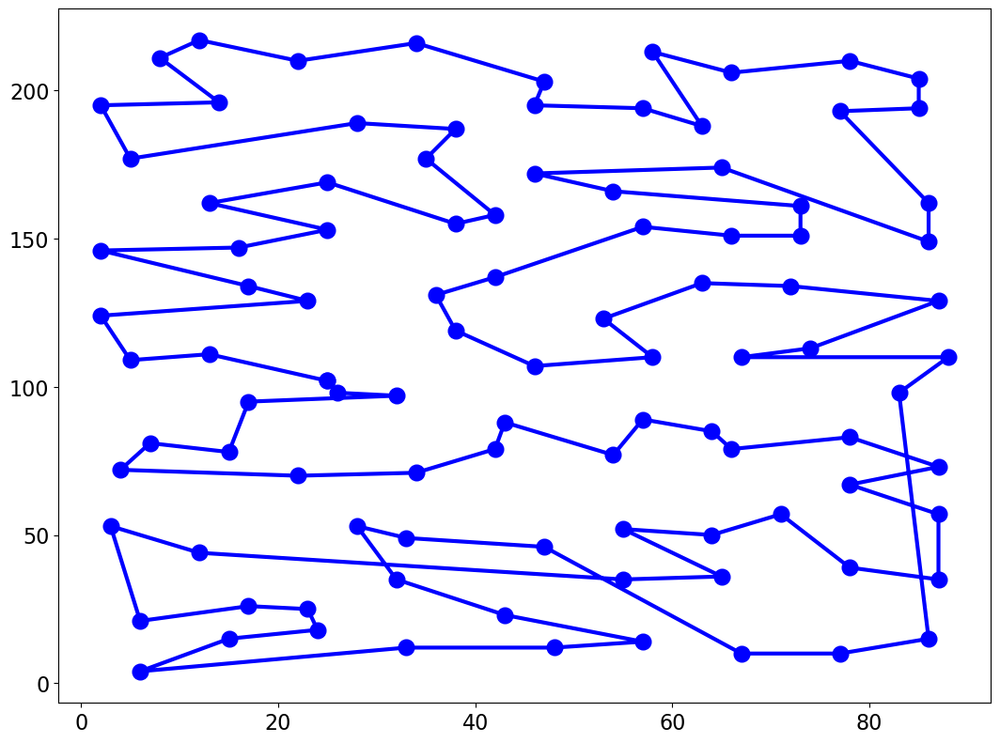

Minimum of objective function: 1302.878682963071
Mean of objective function: 1348.4405643562447
Variance of objective function: 630.1804315579943
relative error genetic algorithm:  7.101568951279934 %


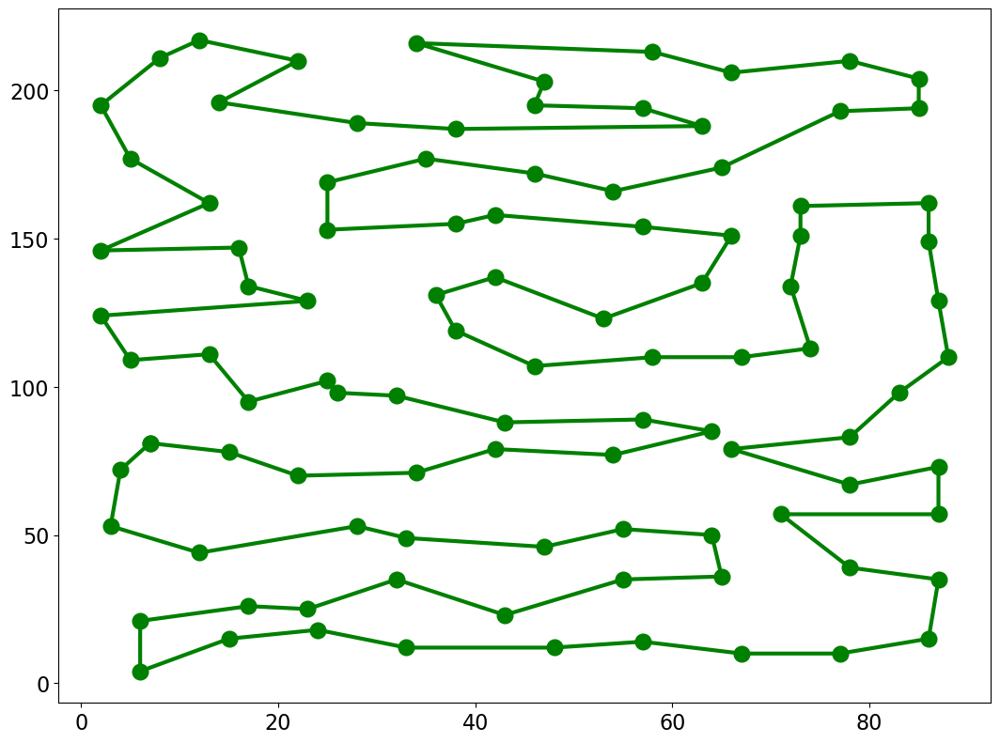

reading tour rd100
reading optimal tour rd100.pc.opt.tour
reading done 7910.0
strange best tour given 51218.0
1 relative error quick tour:  8.34386852085967 %
2 relative error quick tour:  14.336283185840708 %
3 relative error quick tour:  10.341340075853351 %
4 relative error quick tour:  8.255372945638433 %
5 relative error quick tour:  8.508217446270544 %
6 relative error quick tour:  9.190897597977244 %
7 relative error quick tour:  9.481668773704172 %
8 relative error quick tour:  10.265486725663717 %
9 relative error quick tour:  11.529709228824274 %
10 relative error quick tour:  6.308470290771176 %
relative error quick tour  6.308470290771176 %


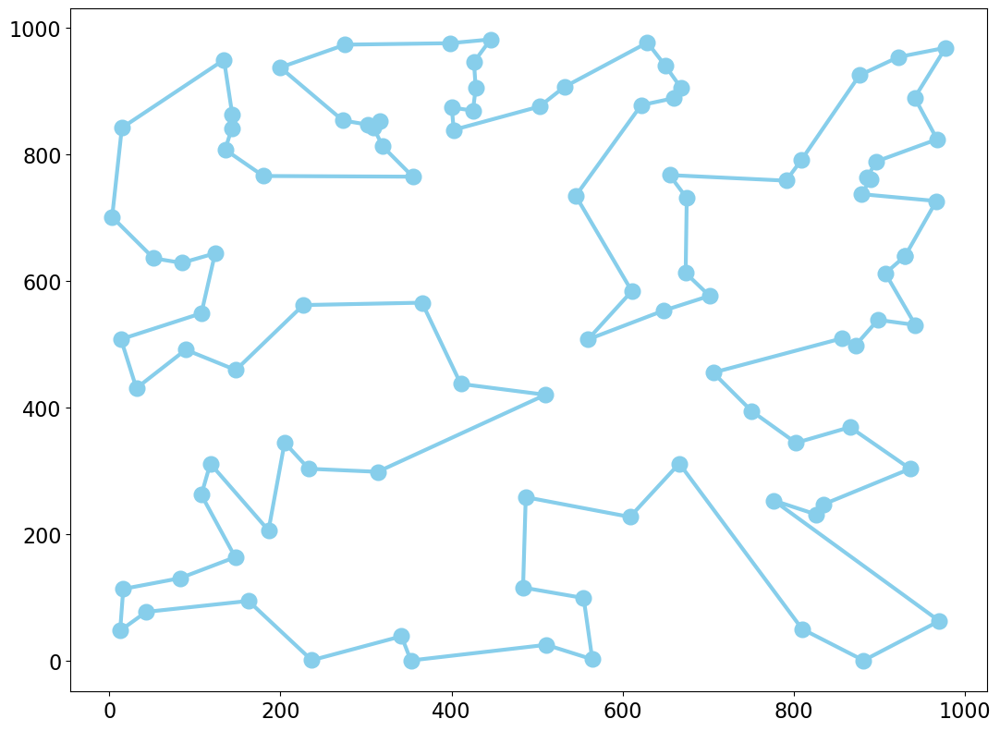

1 relative error closest neighbor:  23.88116308470291 %
2 relative error closest neighbor:  36.18204804045512 %
3 relative error closest neighbor:  31.011378002528446 %
4 relative error closest neighbor:  34.75347661188369 %
5 relative error closest neighbor:  25.12010113780025 %
6 relative error closest neighbor:  25.18331226295828 %
7 relative error closest neighbor:  30.61946902654867 %
8 relative error closest neighbor:  24.892541087231354 %
9 relative error closest neighbor:  25.208596713021493 %
10 relative error closest neighbor:  29.367888748419723 %
relative error closest-neighbor tour:  23.88116308470291 %


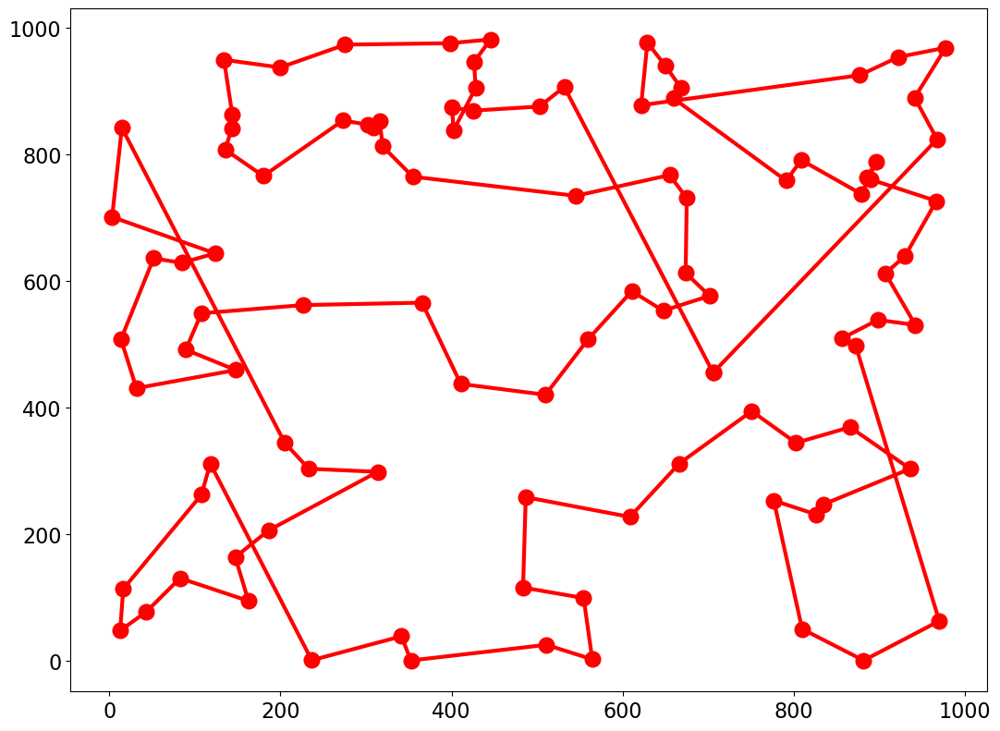

relative error pair-center tour:  11.959544879898862 %


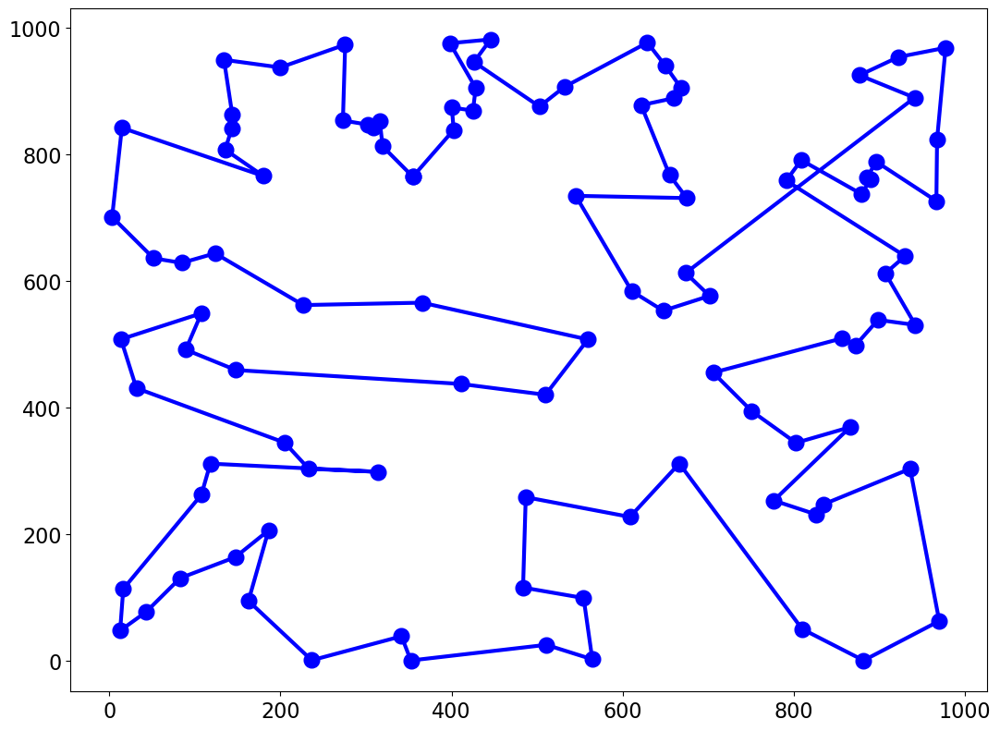

Minimum of objective function: 8523.723997014746
Mean of objective function: 8877.862462754616
Variance of objective function: 73506.91713136085
relative error genetic algorithm:  7.737041719342605 %


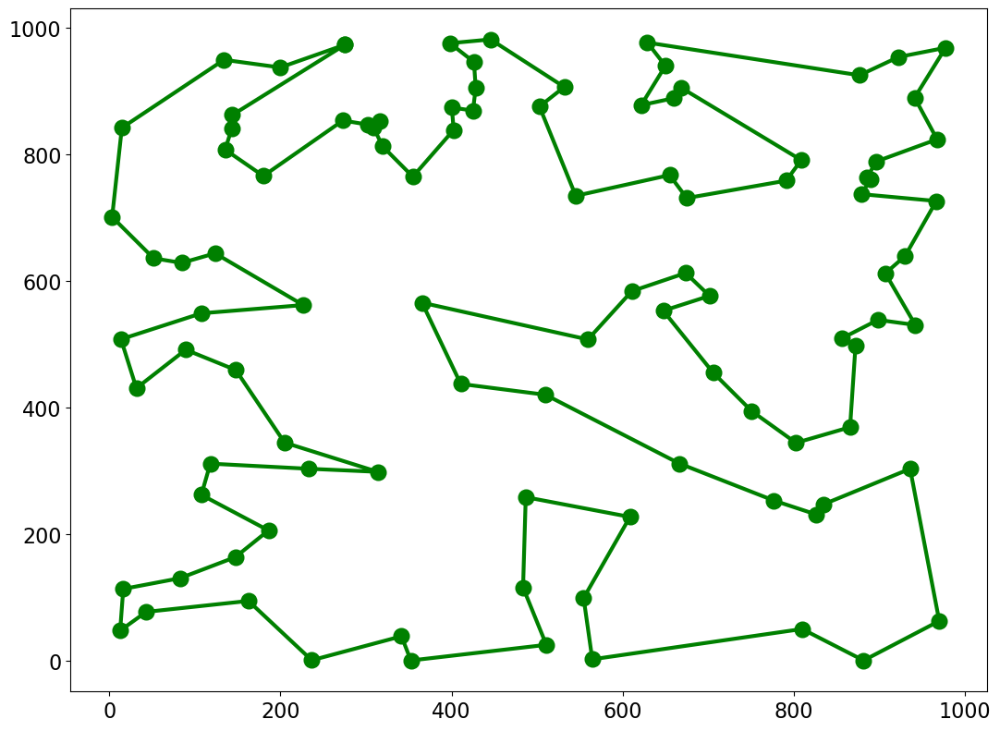

reading tour st70
reading optimal tour st70.opt.tour
reading done 675.0
1 relative error quick tour:  5.185185185185185 %
2 relative error quick tour:  7.407407407407407 %
3 relative error quick tour:  6.37037037037037 %
4 relative error quick tour:  6.814814814814815 %
5 relative error quick tour:  15.555555555555555 %
6 relative error quick tour:  5.62962962962963 %
7 relative error quick tour:  8.444444444444445 %
8 relative error quick tour:  7.111111111111111 %
9 relative error quick tour:  8.148148148148149 %
10 relative error quick tour:  3.4074074074074074 %
relative error quick tour  3.4074074074074074 %


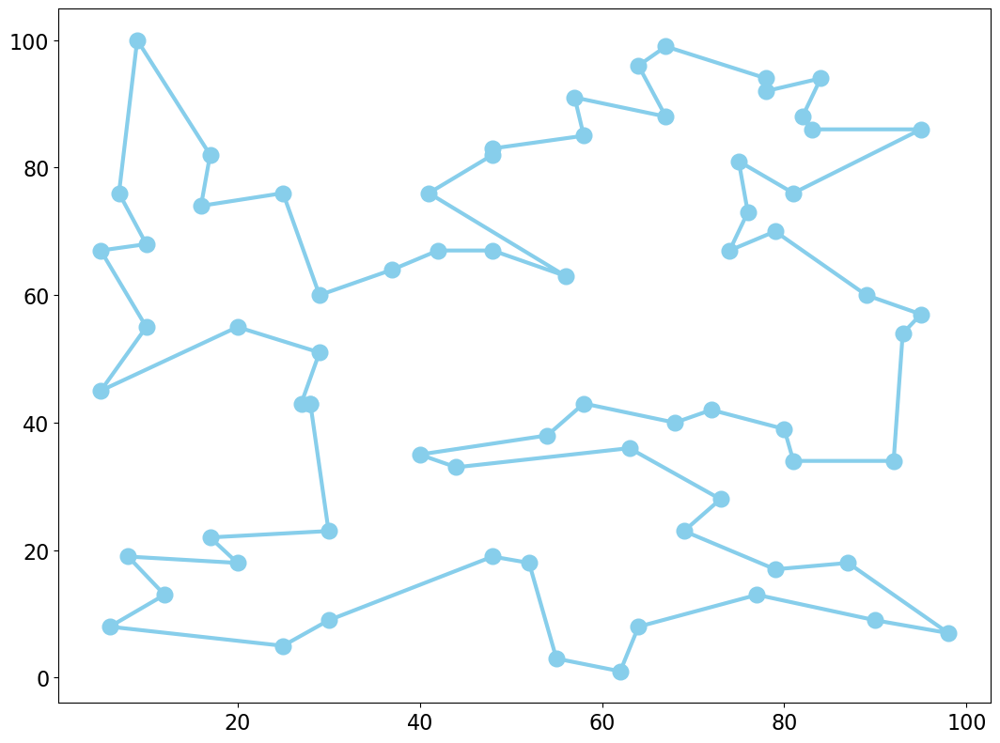

1 relative error closest neighbor:  22.22222222222222 %
2 relative error closest neighbor:  29.333333333333332 %
3 relative error closest neighbor:  32.888888888888886 %
4 relative error closest neighbor:  21.925925925925927 %
5 relative error closest neighbor:  22.962962962962962 %
6 relative error closest neighbor:  20.88888888888889 %
7 relative error closest neighbor:  18.37037037037037 %
8 relative error closest neighbor:  14.37037037037037 %
9 relative error closest neighbor:  30.074074074074073 %
10 relative error closest neighbor:  15.407407407407407 %
relative error closest-neighbor tour:  14.37037037037037 %


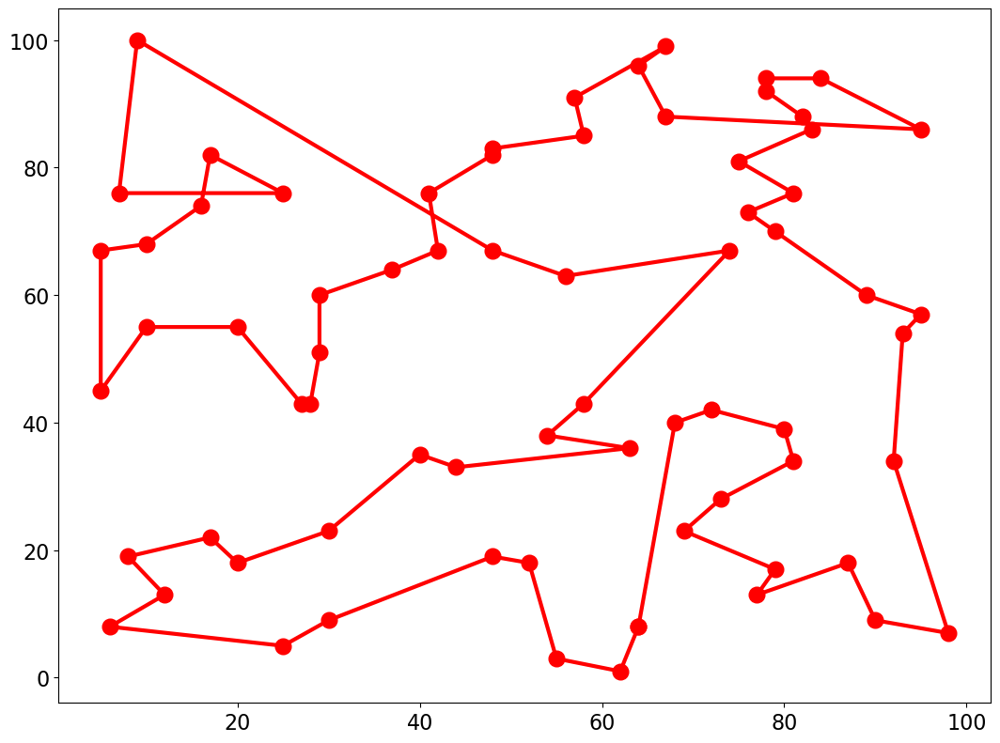

relative error pair-center tour:  7.851851851851852 %


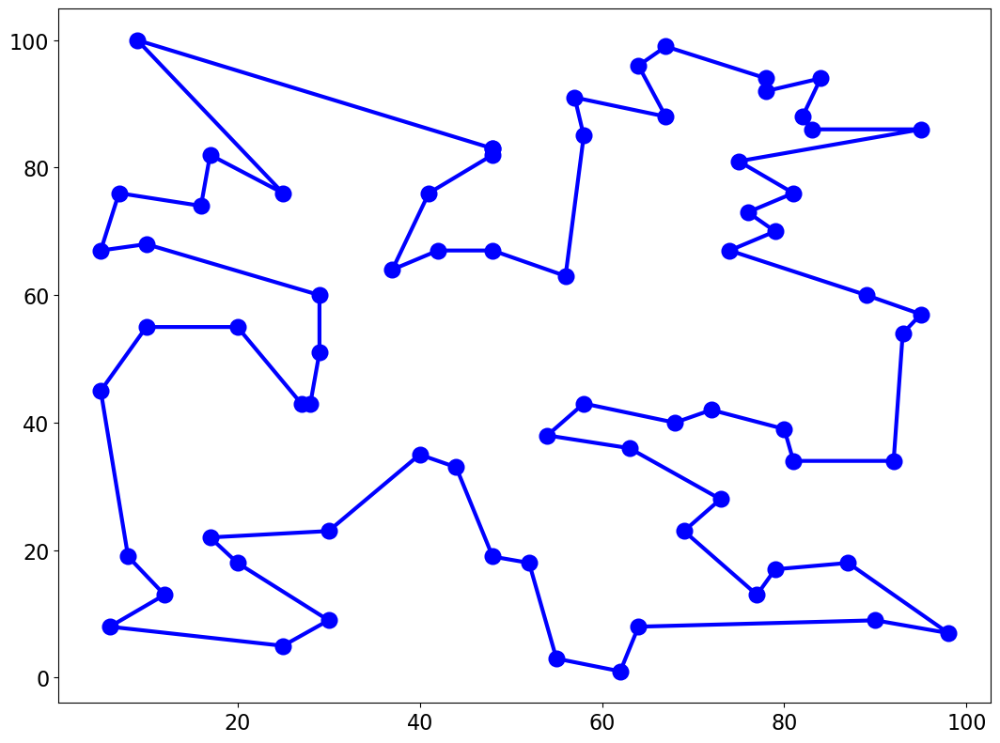

Minimum of objective function: 701.8644727149702
Mean of objective function: 722.4830397076183
Variance of objective function: 479.76167490867965
relative error genetic algorithm:  3.7037037037037037 %


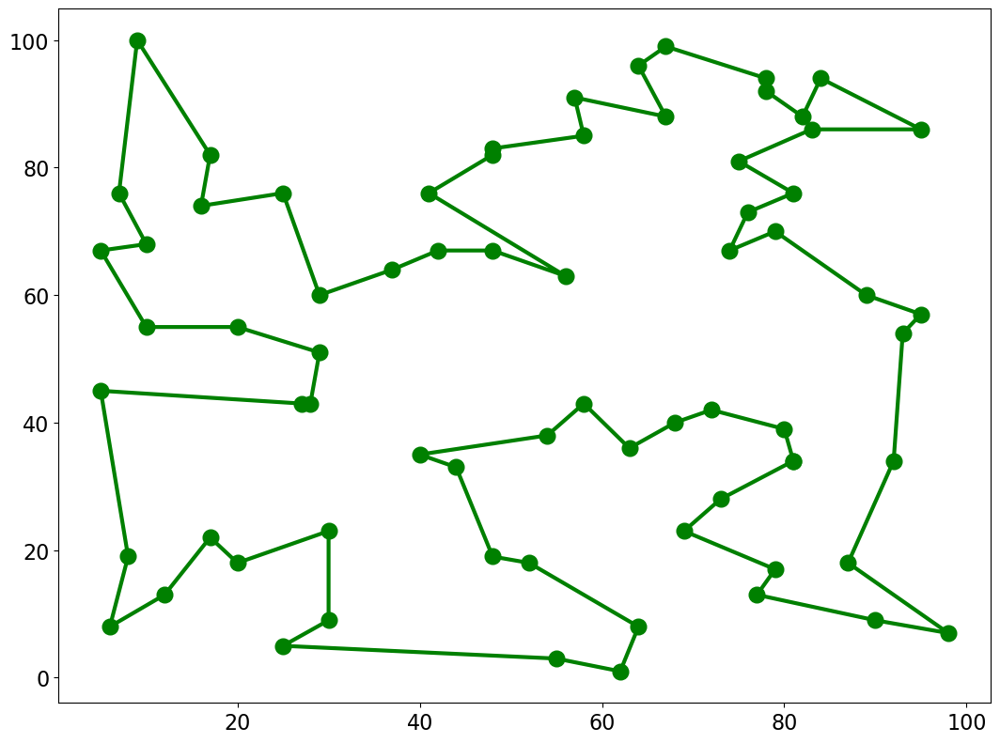

reading tour wi29
reading optimal tour wi29.pc.opt.tour
reading done 27603.0
1 relative error quick tour:  5.720392710937217 %
2 relative error quick tour:  1.550556098974749 %
3 relative error quick tour:  2.130203238778394 %
4 relative error quick tour:  4.4053182625076985 %
5 relative error quick tour:  4.090135130239466 %
6 relative error quick tour:  7.383255443248922 %
7 relative error quick tour:  4.608194761438974 %
8 relative error quick tour:  5.814585371155309 %
9 relative error quick tour:  7.1840017389414195 %
10 relative error quick tour:  1.5179509473607942 %
relative error quick tour  1.5179509473607942 %


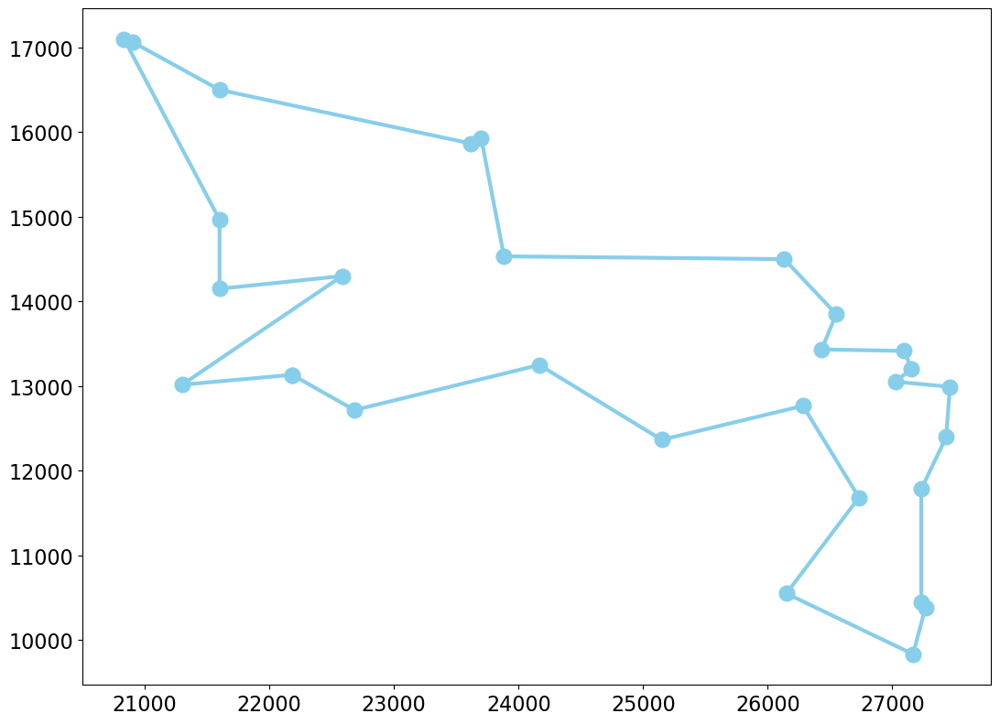

1 relative error closest neighbor:  21.914284679201536 %
2 relative error closest neighbor:  18.878382784479946 %
3 relative error closest neighbor:  16.52356627902764 %
4 relative error closest neighbor:  28.51863927833931 %
5 relative error closest neighbor:  21.914284679201536 %
6 relative error closest neighbor:  18.878382784479946 %
7 relative error closest neighbor:  28.35923631489331 %
8 relative error closest neighbor:  34.88026663768431 %
9 relative error closest neighbor:  34.23540919465275 %
10 relative error closest neighbor:  28.51863927833931 %
relative error closest-neighbor tour:  16.52356627902764 %


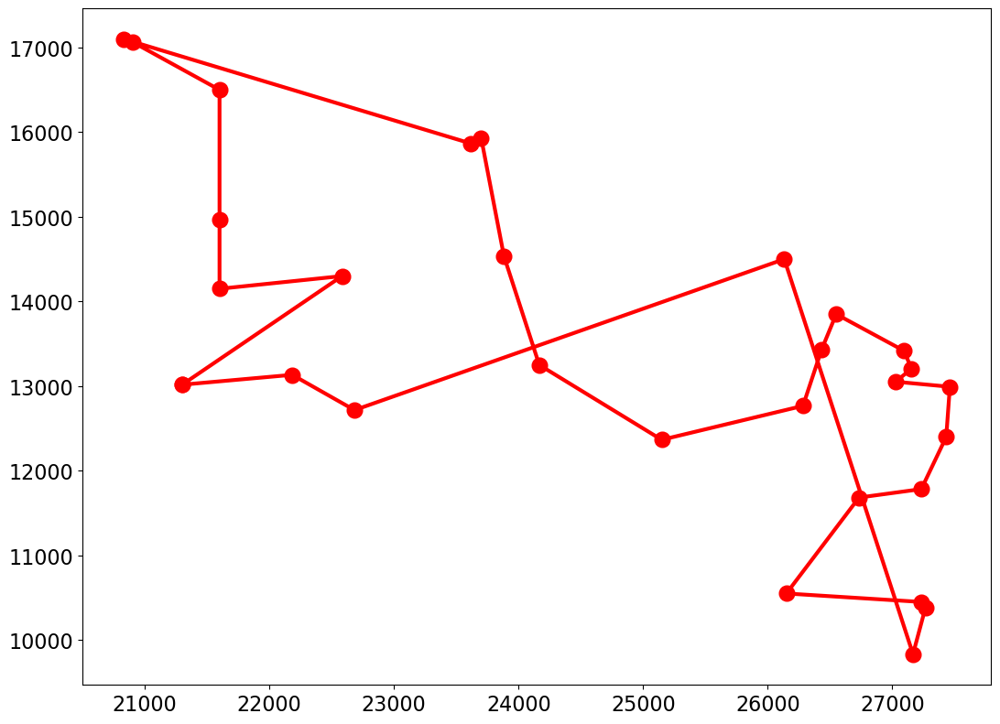

relative error pair-center tour:  23.247473100749918 %


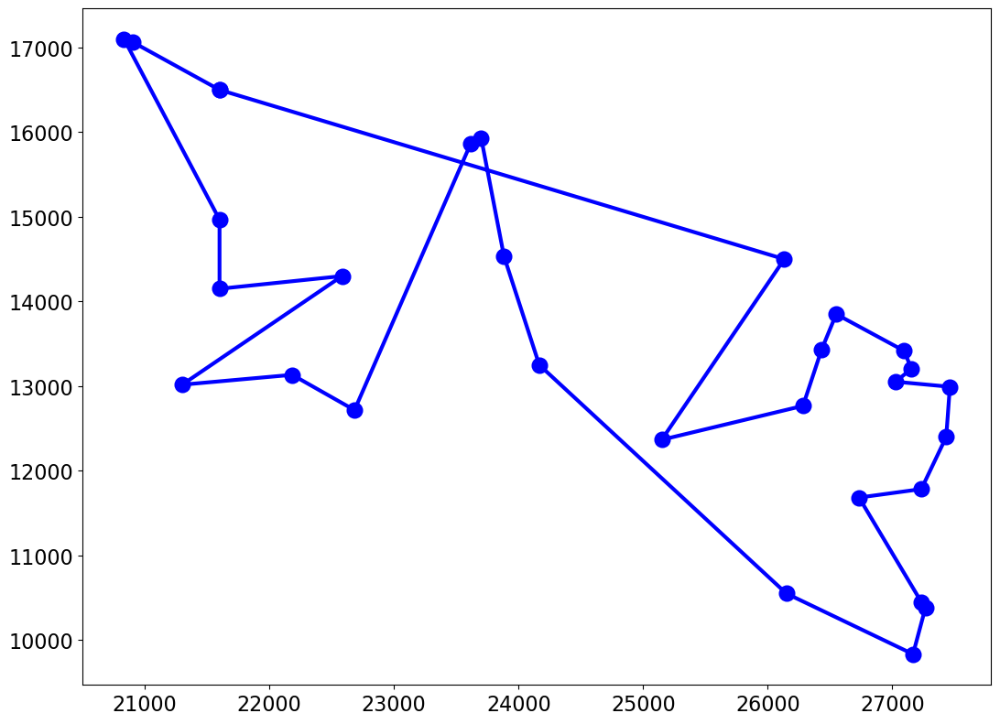

Minimum of objective function: 27601.173774493756
Mean of objective function: 28457.407761617163
Variance of objective function: 317206.93084170774
relative error genetic algorithm:  0.0 %


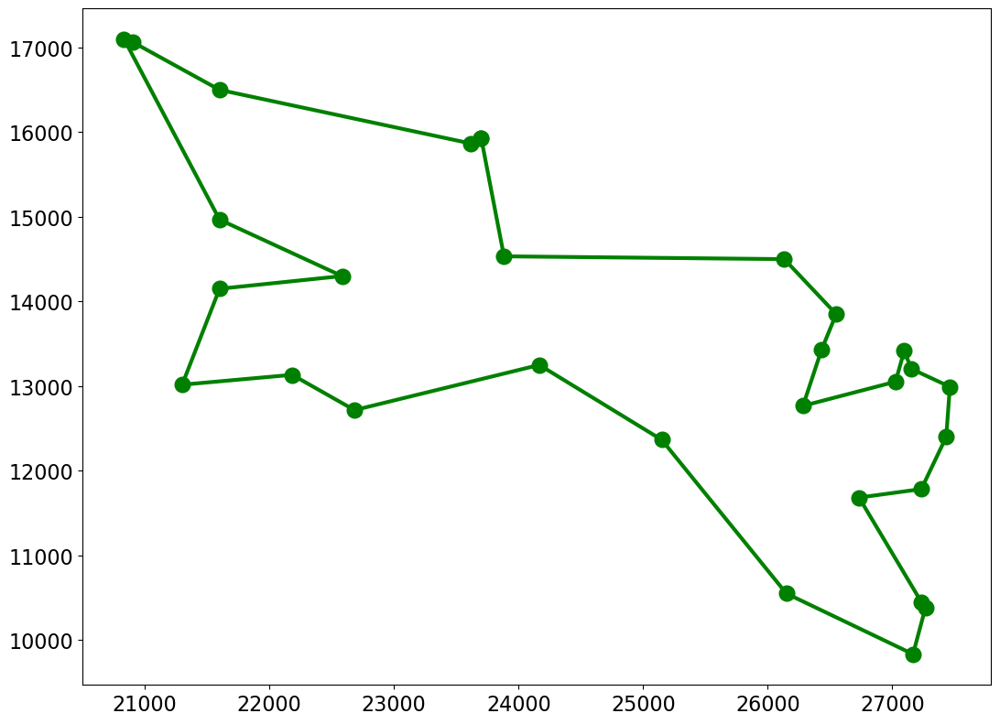

In [17]:
# Get tour filenames
tour_filenames = [ os.path.splitext(filename)[0] for filename in os.listdir(TOURS_PATH) if filename.endswith(".tsp") ]

# Set params to test (GA)
params = {'size_pop': 500, 'max_iter': 1000, 'prob_mut': 0.1}

for filename in tour_filenames:
  theCities,bestLength,bestTour=ReadTsp(TOURS_PATH+"/"+filename)
  if bestTour != [] and bestLength!=TourLength(bestTour):
    print("strange best tour given",TourLength(bestTour))

  # Quick tour
  bestT,error=QuickTour(theCities,rounds,bestLength)
  print("relative error quick tour ",error,"%")
  PlotTour(bestT,"skyblue",show=True,fn=filename+"_QuickTour.png")

  # Closest neighbor tour
  bestT,error=ClosestNeighborTour(theCities,rounds,bestLength)
  print("relative error closest-neighbor tour: ",error,"%")
  PlotTour(bestT,"red",show=True,fn=filename+"_ClosestNeighbor.png")

  # Pair center tour
  bestT,error=PairCenterTour(theCities,bestLength)
  print("relative error pair-center tour: ",error,"%")
  PlotTour(bestT,"blue",show=True,fn=filename+"_PairCenter.png")

  # Monte Carlo genetic algorithm tour
  bestT,error=MonteCarloGATour(rounds,theCities,bestLength,params)
  print("relative error genetic algorithm: ",error,"%")
  PlotTour(bestT,"green",show=True,fn=filename+"_GeneticAlgorithm.png")

With the new set of parameters the GA achieves to overcome the other heuristics in almost every tour, with the exception of kroA100, kroD100 and rat195. In addition, optimizing the parameters of the GA for the most complex tour made the relative error much lower in general.

## Conclusion

In conclusion, the application of genetic algorithms to minimize functions or to solve the Traveling Salesman Problem (TSP) has proven to be a powerful and flexible approach. The algorithm operates by mimicking the principles of natural selection, employing components such as population, fitness evaluation, selection, crossover, and mutation. These mechanisms enable the genetic algorithm to explore the vast search space efficiently and gradually converge towards optimal or near-optimal solutions.

However, the success of a genetic algorithm heavily depends on a careful selection of its parameters. The most critical parameters include ‌population size, mutation rate, crossover rate, and the number of generations. Each of them influences the algorithm’s behavior and performance in distinctive ways. For instance, a larger population size promotes exploration but increases computation time, while a higher mutation rate helps escape local minima but might lead to divergence if set excessively.

Finding the right balance among these parameters becomes critical to achieving the best performance. An unsuitable parameter configuration can lead to bad performance, trapping the algorithm in suboptimal solutions, or excessive exploration that prolongs the optimization process unnecessarily. For the purpose of this project, primarily the performance has been considered (optimizing the mean of the objective function or reducing the relative error), but it is also important to take into account the execution time in real applications.

Hence, researchers and practitioners must conduct thorough parameter tuning to identify the optimal combination for their specific GA instances. This process often involves experimentation and iterative refinement to strike a balance between exploration and exploitation. By selecting appropriate parameters, the genetic algorithm can efficiently explore the search space, escape local minima, and converge towards a stable, near-optimal solution in a timely manner.

In addition, in terms of exploration of the search space Real-coding provides a more continuous and granular exploration of the search space, enabling the genetic algorithm to navigate smoothly across different regions of the solution space whereas Integer-coding explores the search space in a more discrete manner, focusing on specific integer values and combinations that satisfy the problem constraints. The choice between real-coding and integer-coding depends on the nature of the optimization problem, the characteristics of the solution space, and the requirements of the problem domain. 

As stated before these parameters are problem dependent and there is not a "magical formula" to find them other than experimentation. As the field of optimization continues to evolve, refining genetic algorithms’ parameters will remain a critical aspect of maximizing their performance and relevance in solving a wide range of combinatorial optimization problems.